In [1]:
###### This script is to make the panels for Figure 5 and the related supp. figures

##### 


In [2]:
import os, sys
import warnings
warnings.filterwarnings('ignore')
import numpy as np 
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

import pickle

import pandas as pd
from random import sample
from scipy.stats import zscore
from operator import itemgetter
from scipy.signal import find_peaks

In [3]:
# import distinctipy
# from distinctipy import colorblind
# from distinctipy import examples
# from matplotlib.colors import ListedColormap

In [4]:
#### function to order matrices based on correlation
#### based on https://wil.yegelwel.com/cluster-correlation-matrix/
import scipy
import scipy.cluster.hierarchy as sch
import seaborn as sns

def cluster_corr(corr_array, inplace=False):
    """
    Rearranges the correlation matrix, corr_array, so that groups of highly 
    correlated variables are next to eachother 
    
    Parameters
    ----------
    corr_array : pandas.DataFrame or numpy.ndarray
        a NxN correlation matrix 
        
    Returns
    -------
    pandas.DataFrame or numpy.ndarray
        a NxN correlation matrix with the columns and rows rearranged
    """
    pairwise_distances = sch.distance.pdist(corr_array)
    linkage = sch.linkage(pairwise_distances, method='complete')
    cluster_distance_threshold = pairwise_distances.max()/2
    idx_to_cluster_array = sch.fcluster(linkage, cluster_distance_threshold, 
                                        criterion='distance')
    idx = np.argsort(idx_to_cluster_array)
    
    if not inplace:
        corr_array = corr_array.copy()
    
    if isinstance(corr_array, pd.DataFrame):
        return corr_array.iloc[idx, :].T.iloc[idx, :]
    return corr_array[idx, :][:, idx], idx

In [5]:
#### path to data
p = '/nrs/ahrens/Emmanuel/multFISH/DataForFigshare'

In [6]:
p

'/nrs/ahrens/Emmanuel/multFISH/DataForFigshare'

In [7]:
##############################################

In [8]:
##### loading matrices and variables

##### (cells x timeseries) calcium signal of cells positive for at least one gene. Cells of the 3 fish 
##### Note: it has 120 timepoints less due to NMF calculation.
dff_traceAll = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/dff_traceAll.npy')

##### (cells x genes) spot count of genes for cells positive for at least one gene. Cells of the 3 fish.
genes_df_All = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/genes_df_All.npy')

### Gene matrix with nans instead of 0s 
genes_df_All_nans = np.empty((genes_df_All.shape))
genes_df_All_nans[:] = np.nan
genes_df_All_nans[np.where(genes_df_All)] = genes_df_All[np.where(genes_df_All)]

#### to replicate the order we originally got
gene_names = ['cart2','glyt2','tac1','pvalb7','npb','grm1b','irx1b','dat','net','calb1',
              'penka','penkb','eomesa','emx3','cfos','gad1b','cx43','vglut2a','sst','uts1',
              'pou4f2','cort','nr4a2a','cckb','tph2','chata','calb2a','npy','gfra1a','dmbx1a',
              'gbx2','crhb','nefma','chodl','pyya','zic2a','th','pdyn','tbr1b','otpa','esrrb']


#### list of genes without cfos
gene_names_NoCfos = gene_names.copy()
gene_names_NoCfos.pop(gene_names.index('cfos'))

##### (cells x genes) binary classification of gene expression of cells positive for at least one gene. Cells of the 3 fish.
BinaryGenes_All = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/BinaryGenes_All.npy')

#### (genes) indexes of the 41 genes to sort them by number of positive cells.
genes_sorted = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/genes_sorted.npy') ###

### not using cfos for subtypes
BinaryGenes_All_NoCfos = np.copy(BinaryGenes_All)
BinaryGenes_All_NoCfos = np.delete(BinaryGenes_All_NoCfos, gene_names.index('cfos'), axis=1)
BinaryGenes_All_NoCfos.shape

##### 3D (z, x, y) coordinates in atlas space of cells positive for at least one gene. Cells of the 3 fish.
Coords_All = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/Coords_All.npy')

##### (cells x brain regions) binary classification of presence in one of the 112 brain regions of cells positive for at least one gene. Cells of the 3 fish.
BrainRegions_All = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/BrainRegions_All.npy')

##### (cells) Fish ID of cells positive for at least one gene. Cells of the 3 fish.
fish_id = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/fish_id.npy')

fish_list = list(np.unique(fish_id))

#### fish new ID
fish_id2 = fish_id.copy()
fish_id2[np.where(fish_id==59)] = 1
fish_id2[np.where(fish_id==63)] = 2
fish_id2[np.where(fish_id==71)] = 3

##### (cells x coords) = coordinates for the results of t-SNE. For cells positive for at least one gene. Cells of the 3 fish.
tsne_results = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/tsne_results_20240527.npy')

##### list of brain region names from the atlas
BrainRegions_names = np.load(p+'/Fish1/region_names.npy')

#### ideces of brain regions of interest
GoodReg = np.stack((
np.where(BrainRegions_names=='inferior_medulla_oblongata')[0],
np.where(BrainRegions_names=='intermediate_medulla_oblongata')[0],
np.where(BrainRegions_names=='superior_medulla_oblongata')[0],
np.where(BrainRegions_names=='superior_raphe')[0],
np.where(BrainRegions_names=='cerebellum')[0],
np.where(BrainRegions_names=='tegmentum')[0],
np.where(BrainRegions_names=='nucleus_isthmi')[0],
np.where(BrainRegions_names=='periventricular_layer')[0],
np.where(BrainRegions_names=='tectal_neuropil')[0],
np.where(BrainRegions_names=='pretectum')[0],     
np.where(BrainRegions_names=='prethalamus_(ventral_thalamus)')[0],
np.where(BrainRegions_names=='dorsal_thalamus_proper')[0],
np.where(BrainRegions_names=='habenula')[0],
np.where(BrainRegions_names=='hypothalamus')[0],
np.where(BrainRegions_names=='ventral_telencephalon_(subpallium)')[0],
np.where(BrainRegions_names=='dorsal_telencephalon_(pallium)')[0],),axis=1)

GoodReg = GoodReg[0]

#### abbreviations of the selected brain regions
BrainRegions_names_short = ['InfMO', 'IntMO', 'SupMO', 'SupRaphe', 'Cb', 'Tg', 'NI', 'OTpv', 'OTnp', 'Pt', 
                            'preTh', 'Th', 'Hab', 'HypTh', 'SubP', 'Pal']

##### color labeling for brain regions
n=len(BrainRegions_names_short)
colors_Brain = plt.cm.nipy_spectral(np.linspace(0,1,n))

colors_B = plt.cm.nipy_spectral(np.linspace(0,1,len(BrainRegions_names_short)+2))
colors_B.shape

#### (cells) labes from 1-16 for the selected brain regions. For cells positive for at least one gene. Cells of the 3 fish.
Brain_reg = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/Brain_reg.npy')

#### (unique combinations x genes) = 332 unique combinations for positive gene expression based on the 40 genes (not using cfos). 
#### This was obtained with a function that also take into account a minimum number of cells and replicates across fish. 
#### get_unique_types(min_neighbor_thr = 2, count_thr = 5, dist_thr= 40). 
unique_types_full = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/unique_types_full.npy')

###### (cells) integer labeling for the cell subtypes based on the unique combinations. For cells positive for at least one gene. Cells of the 3 fish.
cluster_labelsAll2 = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/cluster_labelsAll2.npy')

##### (subtypes) 332 names for the unique subtypes based on the genes they express.
good_cls_names = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/good_cls_names.npy')

##### (glia subtypes) = labels of the subtypes that were identified with cx43
glia_subs_og = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/glia_subs_og.npy')

#### (subtypes) count of genes present in each of the 332 subtypes. 
g_in_cls_og = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/g_in_cls_og.npy') ###

#### (subtypes) indexes of the 332 subtypes to sort them by number of cells.
subtyps_sorted = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/subtyps_sorted.npy') ###

###### (cells) integer labeling for the cell subtypes reassigning subtype labels based on order of more expression. For cells positive for at least one gene. Cells of the 3 fish.
cluster_labelsAll3 = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/cluster_labelsAll3.npy')

##### (glia subtypes) = labels of the subtypes that were identified with cx43, after they were sorted with subtyps_sorted.
glia_subs = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/glia_subs.npy')

#### (subtypes) count of genes present in each of the 332 subtypes, after they were sorted with subtyps_sorted.
g_in_cls = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/g_in_cls.npy') ###

#### subtype names sorted
good_cls_names = list(np.array(good_cls_names)[subtyps_sorted-1]) ### indexing in names starts at 0

#### colors for subtypes
colors_All = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/colors_All.npy')
cmap_All= ListedColormap(colors_All)

##### (cells) binary classification of cells an imaged planes for cells positive for at least one gene. Cells of the 3 fish.
in_planeAll= np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/in_planeAll.npy')

###### stimuli and correlation results

#### list of stimuli
stim = ['forward', 'backward','right','left','dark-flash','bright-flash','right-loom','left-loom']

#### list of stimuli (full name) 
stim_full = ['forward visual motion',
            'backward visual motion',
            'rightward visual motion',
            'leftward visual motion',
            'Dark flash',
            'Bright flash',
            'Right loom',
            'Left loom',]

#### (stimuli x timeseries) matrix containing for each stimulus (row) the with timings of stimulus presentations and period of expected calcium responses (columns).
regressors= np.load('/nrs/ahrens/Emmanuel/multFISH/MF53_first_release/regressors_SimpleSqr.npy')

#### (cells x stimuli) Matrix with the correlation coefficient of Pearson correlations between the cells activity and the regressors_SimpleSqr (rows). This was performed for each of the 8 stimuli (columns). For cells positive for at least one gene. Cells of the 3 fish.
big_corr_regsAll = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/big_corr_regsAll.npy')

#### (stimuli x timeseries) matrix containing for each stimulus (row) the with timings of dalayed calcium responses (columns).
regressors2 = np.load('/nrs/ahrens/Emmanuel/multFISH/MF51_first_release/regressors_SimpleSqr_AllDelay.npy')

#### (cells x stimuli) Matrix with the correlation coefficient of Pearson correlations between the cells activity and the regressors_SimpleSqr_AllDelay (rows). This was performed for each of the 8 stimuli (columns). For cells positive for at least one gene. Cells of the 3 fish.
big_corr_regsAllDelay = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/big_corr_regsAllDelay.npy')

#### (cells x stimuli) = matrix combining the results of the big_corr_regsAll and the big_corr_regsAllDelay, keeping the highest of both.
big_corr_regsAllMix = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/big_corr_regsAllMix.npy') 

#### percentiles of big_corr_regsAllMix
perc5 = np.percentile(big_corr_regsAllMix[:,0],[5, 10, 25, 59, 75, 90, 95])

#### (cells, stimuli, presentation) = Matrix with the correlation coefficient of Pearson correlations between the cells activity and the regressors_SimpleSqr (1st dimension). This was performed for each of the 8 stimuli (2nd dimension) and for the 2nd to the 10th presentations (3rd dimension). For cells positive for at least one gene. Cells of the 3 fish.
corr_stimAll = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/corr_stimAll.npy') 

#### (cells, stimuli, presentation) same as above but for the delayed responses (regressors_SimpleSqr_AllDelay).
corr_stimAll2 = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/corr_stimAll2.npy') ###

#### (cells x stimuli) Median of the presentation’s correlation coefficients from corr_stimAll.
high_corr_perSim = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/high_corr_perSim.npy') ###

#### (cells x stimuli) Median of the presentation’s correlation coefficients from corr_stimAll2.
high_corr_perSim2 = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/high_corr_perSim2.npy') ###

#### (cells x stimuli) = matrix combining the results of the high_corr_perSim and the high_corr_perSim2, keeping the highest of both.
high_corr_perSimMix = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/high_corr_perSimMix.npy') ###

#### percentiles of high_corr_perSimMix
perc3 = np.percentile(high_corr_perSimMix[:,0],[5, 10, 25, 59, 75, 90, 95])

### finding average per stimuli
for s in range(1,8,1):
    perc3 = np.vstack((perc3, np.percentile(high_corr_perSimMix[:,s],[5, 10, 25, 59, 75, 90, 95])))
    perc5 = np.vstack((perc5, np.percentile(big_corr_regsAllMix[:,s],[5, 10, 25, 59, 75, 90, 95])))
    
perc3mean = np.mean(perc3,0)
perc5mean = np.mean(perc5,0)


#### (cells x timeseries) Average calcium activity of the 9 presentations (2nd to 10th) to have a representative trail (268 timepoints). For cells positive for at least one gene. Cells of the 3 fish.
dff_traceAllavg = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/dff_traceAllavg.npy') ###

#### (stimuli x timeseries) Average of the of the 9 presentations (2nd to 10th) of  regressors_SimpleSqr to have a representative trail (268 timepoints).
regressors_avg = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/regressors_avg.npy') ###

##### (stimuli, presentation, moment) start and end time stamps for each of the stimulus (1st dimension) and each of the 10 presentations (2nd dimension). At 6kHz.
stim_timings = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/stim_timings.npy') ###
stim_timings.shape

##### (closed-loop period, moment) start and end time stamps for each of the 80 closed-loop periods during the experiment. At 6kHz.
stim_timings2 = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/stim_timings2.npy') ###
stim_timings2.shape

##### (stimuli, presentation, moment) start and end time stamps for each of the stimulus (1st dimension) and each of the 10 presentations (2nd dimension). Down sampled to match the calcium timepoints, at 2Hz.
stim_timings_ds = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/stim_timings_ds.npy') ###

##### (closed-loop period, moment) start and end time stamps for each of the 80 closed-loop periods during the experiment. Down sampled to match the calcium timepoints, at 2Hz.
stim_timings2_ds = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/stim_timings2_ds.npy') ###

#### swim trace (ephys resolution) 
swim_power_59 = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/swim_power_59.npy') ###

#### swim trace (imaging resolution) 
swim_power_good59 = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/swim_power_good59.npy') ###

#### swim trace (ephys resolution) 
swim_power_63 = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/swim_power_63.npy') ###

#### swim trace (imaging resolution) 
swim_power_good63 = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/swim_power_good63.npy') ###

#### swim trace (ephys resolution)
swim_power_71 = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/swim_power_71.npy') ###

#### swim trace (imaging resolution) 
swim_power_good71 = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/swim_power_good71.npy') ###

##### (cells) Pearson correlation coefficient of the calcium activity and the estimated swim power. For cells positive for at least one gene. Cells of the 3 fish.
swim_corr_All = np.load('/nrs/ahrens/Emmanuel/multFISH/DataForFigshare/postprocessed/swim_corr_All.npy')
swim_corr_All.shape

print('data loaded')

data loaded


Text(0.5, 1.0, 'colors for subtypes')

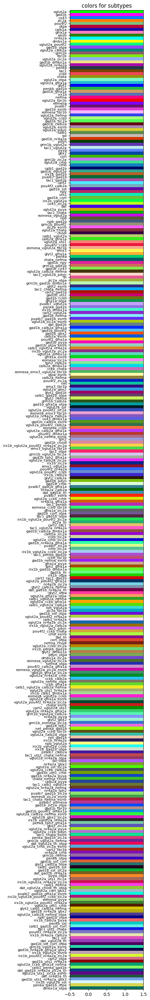

In [9]:
#### colors for subtypes
test_colors = np.zeros((len(colors_All)))
for i in range(len(colors_All)):
    test_colors[i] = i + 1

test_colors = np.vstack((test_colors,test_colors))

plt.figure(figsize = (3,40))
plt.imshow(test_colors.T, aspect='auto', cmap=cmap_All,vmin=1, vmax=332)
plt.yticks(range(len(colors_All)),np.array(good_cls_names), fontsize=8) 
plt.title('colors for subtypes')

332


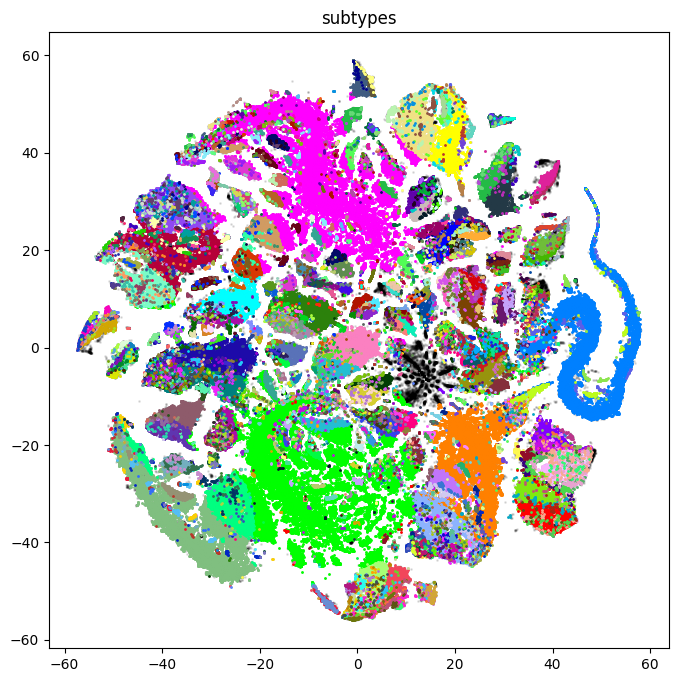

In [10]:
### plotting tsne visualization

plt.figure(figsize=(8,8))

plt.scatter(tsne_results[:,0],tsne_results[:,1], c = 'k', alpha = 0.1,s=1)

count = 0
for cl in np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]]):
    temp = np.where(cluster_labelsAll3==cl)[0]
    if len(temp)>20:
        temp2 = fish_id[temp]
        if len(np.unique(temp2)) > 2: #### 
            if len(np.where(temp2==59)[0])>4 and len(np.where(temp2==63)[0])>4 and len(np.where(temp2==71)[0])>4:
                           
                plt.scatter(tsne_results[temp,0],tsne_results[temp,1], alpha = 1,s=1,c=colors_All[cl-1])
                count = count+1

plt.title('subtypes')

print(count)

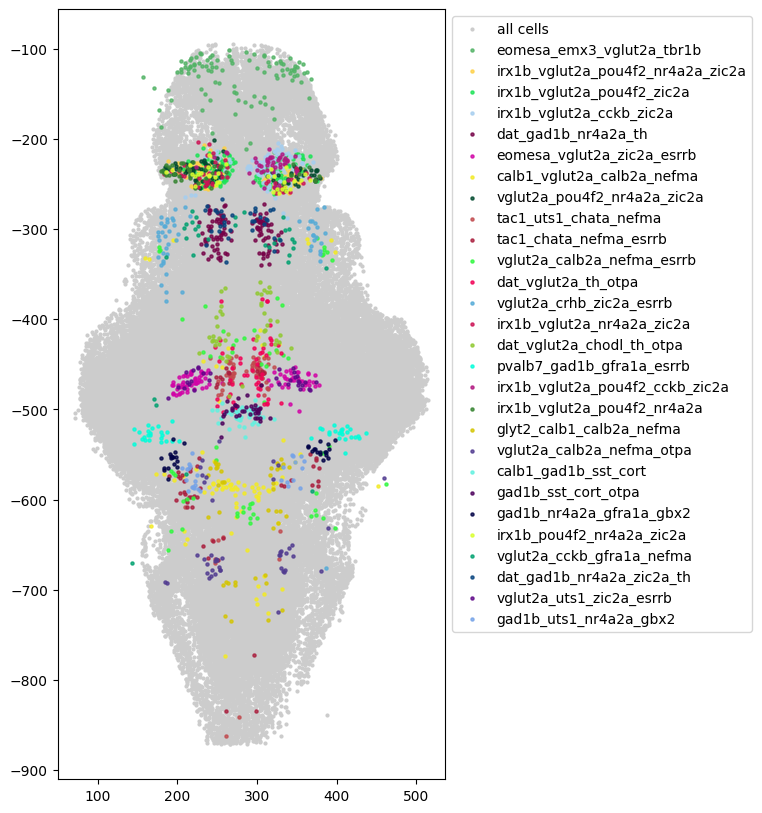

In [11]:
#### checking subtypes with 4 genes or more

minG = 4 #### minimum number of genes in a subtype

temp_f = np.where(fish_id==59)[0]

plt.figure(figsize=(5,10))
plt.scatter(Coords_All[temp_f,1],Coords_All[temp_f,2]*-1,s=4,c='0.8',alpha=1)


names = ['all cells']

for i, cl in enumerate(list(np.unique(cluster_labelsAll3)[1::][np.where(g_in_cls>=minG)[0]])):
    if cl in glia_subs:
        continue
    temp = np.where(cluster_labelsAll3==cl)[0]
    # print(cl)


    temp2 = fish_id[temp]


    if len(np.where(temp2==59)[0])>4 and len(np.where(temp2==63)[0])>4 and len(np.where(temp2==71)[0])>4:

        if len(np.where(temp2==59)[0])/len(temp2)>0.70 or len(np.where(temp2==63)[0])/len(temp2)>0.70 or len(np.where(temp2==71)[0])/len(temp2)>0.70:
            # print(x, good_cls_names[i], BrainRegions_names[b])
            # print(len(np.where(temp2==59)[0])/len(temp2), len(np.where(temp2==63)[0])/len(temp2), len(np.where(temp2==71)[0])/len(temp2))
            continue
    
        plt.scatter(Coords_All[temp,1],Coords_All[temp,2]*-1,s=5,alpha=0.8,c=colors_All[cl-1])
        names.append(good_cls_names[np.where(g_in_cls>=minG)[0][i]])
plt.legend(names, bbox_to_anchor=(1, 1))

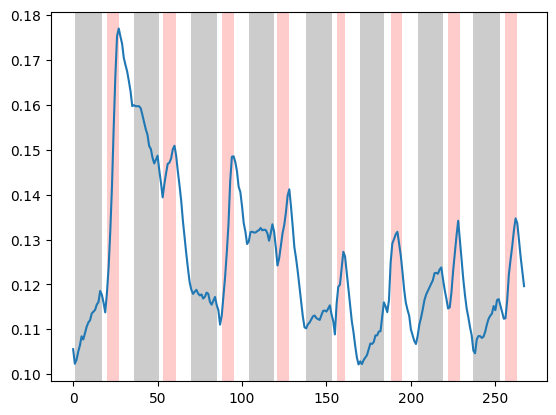

In [12]:
##### plotting mean activity for a representative trail and the stimulus presentations
##### for just stimulus presentation (at 2Hz)

plt.figure()
plt.plot(np.nanmean(dff_traceAllavg,0))
# plt.axvspan(0,134,alpha=0.1, facecolor='r')
for s in range(8):
    dark = 0.2

    plt.axvspan((stim_timings_ds[s,0,0]),(stim_timings_ds[s,0,1]),alpha=dark, facecolor='r')
    plt.axvspan((stim_timings2_ds[s,0]),(stim_timings2_ds[s,1]),alpha=0.2, facecolor='k')

In [13]:
########################

In [14]:
def unique_ordered(arr):
    return np.array(list(dict.fromkeys(arr)))

# Example usage
array = np.array([1, 4, 3, 2, 1, 4, 5, 3])
result = unique_ordered(array)
print(result)  # Output: [1, 2, 3, 4, 5]

[1 4 3 2 5]


0.12937306812442706 0.43417642063345374
72397 47191
84668
foward vglut2a_zic2a pretectum
0.2222222222222222 0.08333333333333333 0.6944444444444444
foward gad1b_dmbx1a inferior_medulla_oblongata
0.16535433070866143 0.6929133858267716 0.14173228346456693
foward vglut2a_otpa intermediate_medulla_oblongata
0.12636165577342048 0.1895424836601307 0.6840958605664488
foward gad1b_zic2a dorsal_thalamus_proper
0.15789473684210525 0.15789473684210525 0.6842105263157895
foward tac1_vglut2a tegmentum
0.09523809523809523 0.2222222222222222 0.6825396825396826
foward vglut2a_zic2a_esrrb superior_medulla_oblongata
0.125 0.2 0.675
foward dat_gad1b_nr4a2a_th pretectum
0.16666666666666666 0.1388888888888889 0.6944444444444444
12671
sorted_counts_ [1350  851  838  678  670  536  459  378  332  304  296  288  288  277
  234  232  220  206  165  163  163  146  138  129  127  120  111  105
  103  100   97   87   85   82   79   77   76   72   71   69   65   62
   61   61   60   58   58   56   52   50   48   48

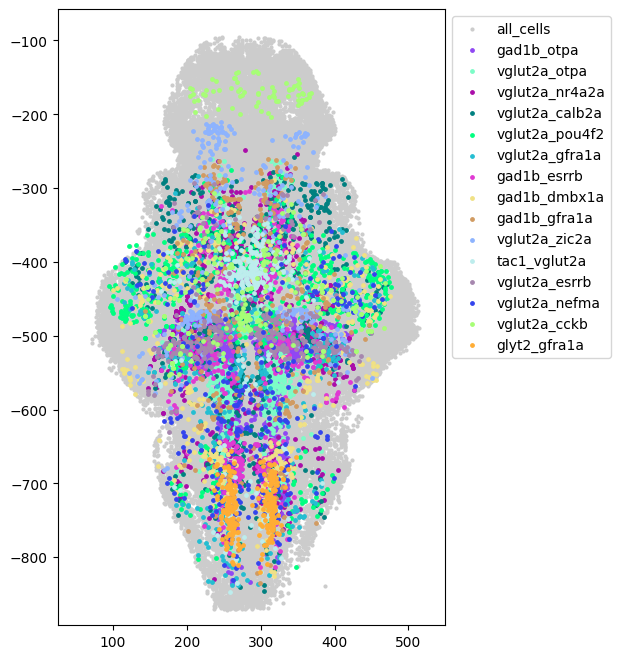

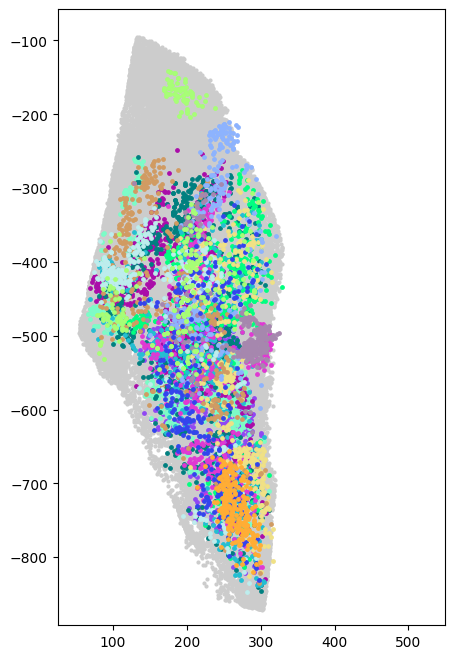

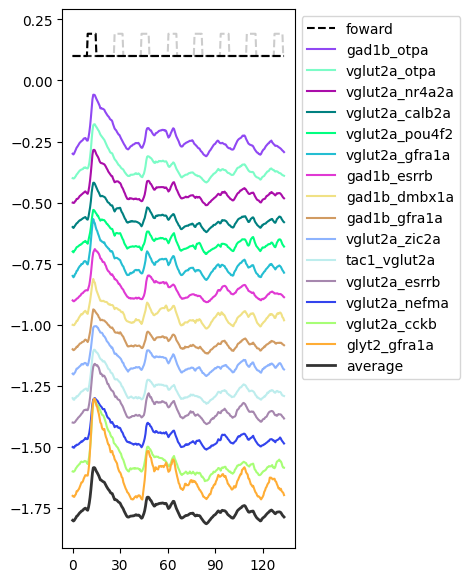

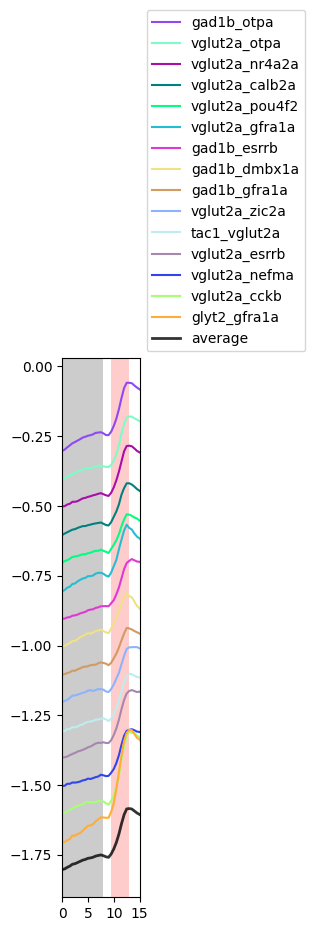

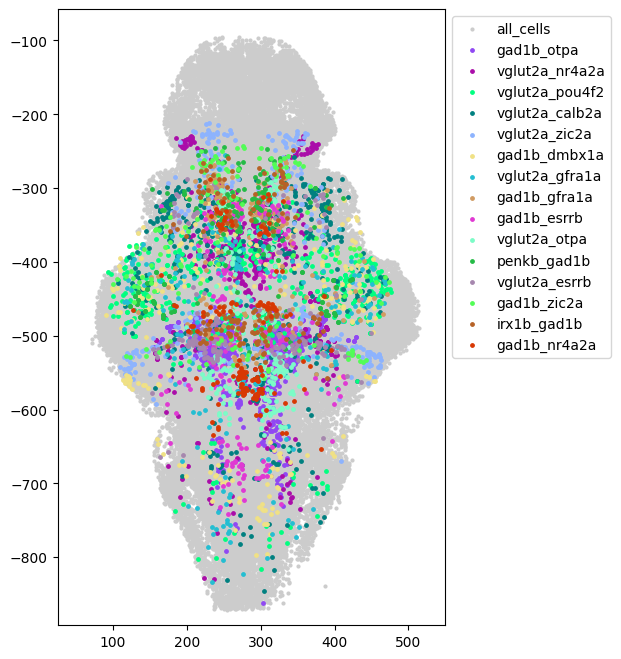

...

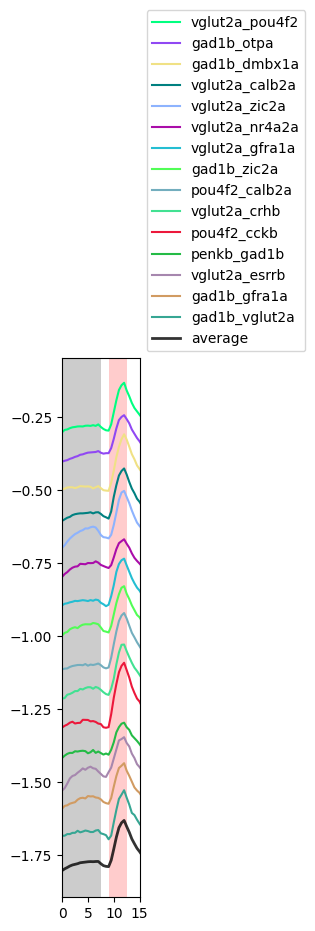

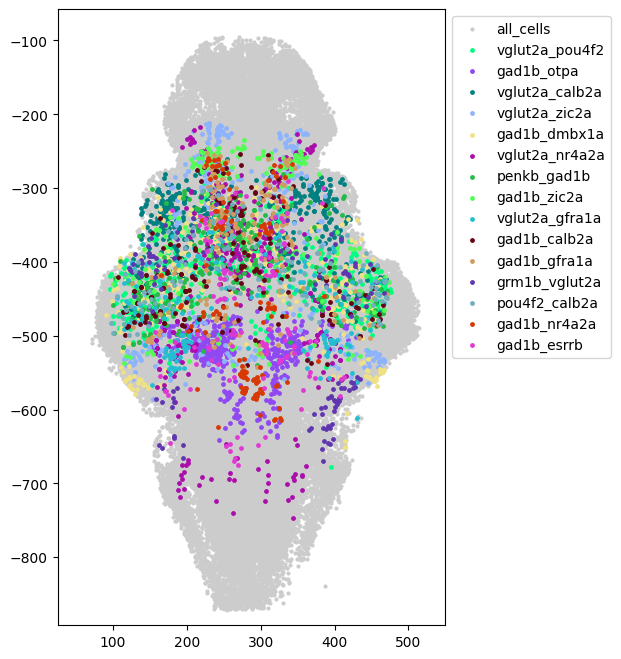

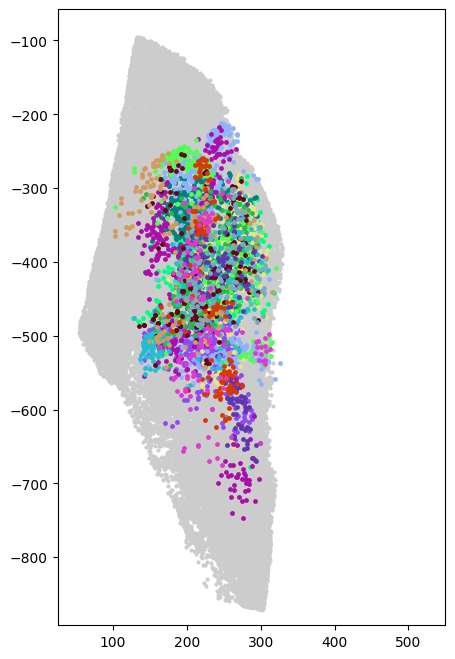

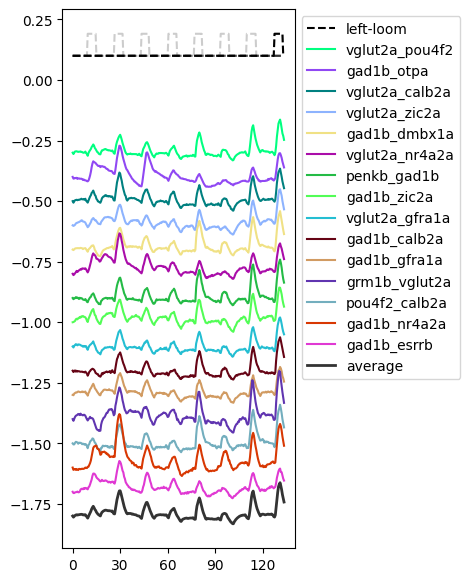

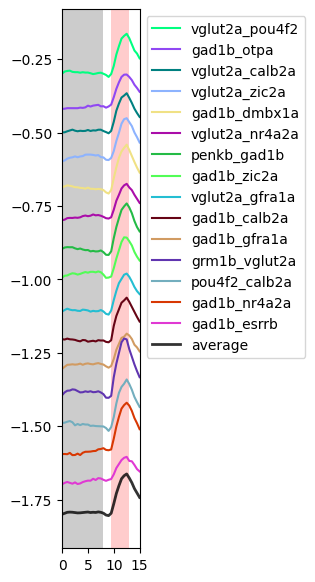

In [17]:

###### plotting maps and traces of correlated cells. 


#####  Trying to split into layers in Z
##### and also selecting just the 15 with most cells
X = 15 #### number of subtypes


from matplotlib import cm
from matplotlib.colors import ListedColormap

####  correlated responses 
thr = perc5mean[5]#*-1
thr2 = perc3mean[5]#*-1
print(thr, thr2)


temp_Sub_cl_full_list = []


for s in range(8):
# for s in [0,1]:
    
    temp_s = np.where(big_corr_regsAllMix[:,s]>thr)[0]
    temp_s2 = np.where(high_corr_perSimMix[:,s]>thr2)[0]

    
    print(len(temp_s), len(temp_s2))
    temp_s = np.union1d(temp_s,temp_s2)
    print(len(temp_s))

    temp_f = np.where(fish_id==59)[0]


    names = ['all_cells']

    count = 0

    temp_All = np.zeros((1))
    
    for i, cl in enumerate(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]])):
    # #### if trying with a minimum number of genes

        ds = 1  ### downsample (skipping cells below)
        if g_in_cls[i]<2:
            continue
        if cl in glia_subs:  ### skipping glial cells
            continue
            
        temp_cl = np.where(cluster_labelsAll3==cl)[0]
        temp_cl = np.intersect1d(temp_cl,temp_s)   
   
        temp_all = np.zeros((1))
        
        for j,b in enumerate(GoodReg):
    
            temp_b = np.where(BrainRegions_All[:,b])[0]
            temp = np.intersect1d(temp_cl,temp_b)

            temp2 = fish_id[temp]

            if len(np.where(temp2==59)[0])>4 and len(np.where(temp2==63)[0])>4 and len(np.where(temp2==71)[0])>4:
                
                if len(np.where(temp2==59)[0])/len(temp2)>0.70 or len(np.where(temp2==63)[0])/len(temp2)>0.70 or len(np.where(temp2==71)[0])/len(temp2)>0.70:
                    # print(x, good_cls_names[i], BrainRegions_names[b])
                    # print(len(np.where(temp2==59)[0])/len(temp2), len(np.where(temp2==63)[0])/len(temp2), len(np.where(temp2==71)[0])/len(temp2))
                    continue

                temp_all = np.hstack((temp_all,temp))
    
                if len(np.where(temp2==59)[0])/len(temp2)>0.67 or len(np.where(temp2==63)[0])/len(temp2)>0.67 or len(np.where(temp2==71)[0])/len(temp2)>0.67:
                    print(stim[s], good_cls_names[i], BrainRegions_names[b])
                    print(len(np.where(temp2==59)[0])/len(temp2), len(np.where(temp2==63)[0])/len(temp2), len(np.where(temp2==71)[0])/len(temp2))
#                 
                
        temp_all = temp_all[1::]

        temp_All = np.hstack((temp_All,temp_all))

    temp_All = temp_All[1::]

    print(len(temp_All))
    
    temp_All = temp_All[::ds]
    
    temp_Sub_cl_full = cluster_labelsAll3[temp_All.astype(int)]

    
    temp_Sub_cl_full_list.append(temp_Sub_cl_full)

    ###### finding the X biggest subtypes to only plot those
    temp_subt, temp_stcounts = np.unique(temp_Sub_cl_full, return_counts=True)

    temp_sort = np.argsort(temp_stcounts)
    temp_sort = temp_sort[::-1]
    print('sorted_counts_',temp_stcounts[temp_sort])

    temp_subt2 = temp_subt[temp_sort][0:X]

    temp_All_short = np.zeros((1))

    # for i, cl in enumerate(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]])):
    for i, cl in enumerate(temp_subt2):
        if cl in temp_subt2:
            temp_cl = np.where(temp_Sub_cl_full==cl)[0]
            temp_All_short = np.hstack((temp_All_short,temp_All[temp_cl]))

    temp_All_short = temp_All_short[1::]
    
    temp_Sub_cl_short = cluster_labelsAll3[temp_All_short.astype(int)]

    temp_Sub_cl = temp_Sub_cl_short

    temp_All = temp_All_short

    if len(temp_Sub_cl)<1:
        continue

    #######
    
    temp_Sub_cl_new = np.zeros((temp_Sub_cl.shape))
    for c,cl in enumerate(unique_ordered(temp_Sub_cl)):
        temp_Sub_cl_new[temp_Sub_cl==cl] = c      

    # temp_Sub_cl2 = np.vstack((temp_Sub_cl,temp_Sub_cl)
    temp_Sub_cl2 = np.vstack((temp_Sub_cl,temp_Sub_cl))
    
    names = ['all_cells']    
    names = names + list(itemgetter(*unique_ordered(temp_Sub_cl)-1)(good_cls_names))   ### the -1 is because there is no subtype 0 but indexing the names starts from 0
    

    cmap = cm.get_cmap('gist_rainbow', len(temp_Sub_cl_new))
    cmap_All= ListedColormap(colors_All)

    
    n = len(np.unique(temp_Sub_cl))
    colors = plt.cm.gist_rainbow(np.linspace(0,1,n))

    plt.figure(figsize=(5,8))
    plt.scatter(Coords_All[temp_f,1],Coords_All[temp_f,2]*-1,s=4,c='0.8',alpha=1)
    
    for c, cl in enumerate(unique_ordered(temp_Sub_cl)):
        inds = temp_All_short[np.where(temp_Sub_cl==cl)[0]]
        cl=cl-1  ### trying to adjust the indexing to the colors

        plt.scatter(Coords_All[inds.astype(int),1],Coords_All[inds.astype(int),2]*-1,s=6,alpha=1,c=colors_All[cl], label=names[c+1] )
        names.append(good_cls_names[i])

    plt.legend(names, bbox_to_anchor=(1, 1))
    plt.axis('equal')
    plt.xlim(25, 550)  # Set x-axis limits
    plt.ylim(-900, -50)  # Set y-axis limits


    # plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/Neg_corr_map_top_stim_{}_300dpi.png'.format(s+1),transparent=True, dpi=300)

        #### lateral view
    plt.figure(figsize=(5,8))
    plt.scatter(Coords_All[temp_f,0],Coords_All[temp_f,2]*-1,s=4,c='0.8',alpha=1)


    for c, cl in enumerate(unique_ordered(temp_Sub_cl)):
        inds = temp_All_short[np.where(temp_Sub_cl==cl)[0]]
        cl=cl-1  ### trying to adjust the indexing to the colors

        plt.scatter(Coords_All[inds.astype(int),0],Coords_All[inds.astype(int),2]*-1,s=6,alpha=1,c=colors_All[cl], label=names[c+1] )
        names.append(good_cls_names[i])

    print(count)

    plt.axis('equal')
    plt.xlim(25, 550)  # Set x-axis limits
    plt.ylim(-900, -50)  # Set y-axis limits


    # plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/Neg_corr_map_side_stim_{}_300dpi.png'.format(s+1),transparent=True, dpi=300)

    # for z in [190,260,330]:

    #     temp_z = np.where(Coords_All[:,0]<z)[0]
    #     temp_z2  = np.where(Coords_All[:,0]>z-70)[0]
    #     temp_z = np.intersect1d(temp_z, temp_z2)

    #     temp_fz = np.intersect1d(temp_z, temp_f)
        
    #     plt.figure(figsize=(5,10))
    #     plt.scatter(Coords_All[temp_fz,1],Coords_All[temp_fz,2]*-1,s=4,c='0.8',alpha=1)

        
    #     for c, cl in enumerate(unique_ordered(temp_Sub_cl)):
    #         inds = np.where(temp_Sub_cl==cl)[0]
    #         inds = np.intersect1d(temp_z, temp_All[inds]).astype(int)
    #         cl=cl-1  ### trying to adjust the indexing to the colors

    #         # plt.scatter(Coords_All[temp_All[inds].astype(int),1],Coords_All[temp_All[inds].astype(int),2]*-1,s=6,alpha=1,c=temp_Sub_cl_new[inds],cmap = cmap, label=names[c+1] )
    #         plt.scatter(Coords_All[inds.astype(int),1],Coords_All[inds.astype(int),2]*-1,s=6,alpha=1,c=colors_All[cl], label=names[c+1] )
    #         # names.append(good_cls_names[i])
    #         # count = count + 1

    #     plt.xlim([0,550])
    #     plt.ylim([-900,-50])
           
    plt.figure(figsize=(3,7))

    names2 = []
    for reg in range(regressors.shape[0]):
        plt.plot((regressors_avg[reg,:]*1)+0.1,c='k',ls='--', alpha = 0.2)
        names2.append('_stimulus')
    
    plt.plot((regressors_avg[s,:]*1)+0.1,c='k',ls='--')

    temp_mean_array = np.zeros((len(np.unique(temp_Sub_cl)),dff_traceAllavg.shape[1]))
    
    for c, cl in enumerate(unique_ordered(temp_Sub_cl)):
        inds = np.where(temp_Sub_cl==cl)[0]
        temp_mean_array[c] = np.mean(dff_traceAllavg[temp_All[inds].astype(int),:],0)  
    
    temp_corrmat = np.corrcoef(temp_mean_array)
    _ , corr_idx = cluster_corr(temp_corrmat)

    #### to invert the order
    # corr_idx = corr_idx[::-1]

    #### to keep the original order
    corr_idx = np.arange(0,len(corr_idx),1)
    
    names2.append(stim[s])
    names2 = names2 + list(itemgetter(*unique_ordered(temp_Sub_cl)[corr_idx]-1)(good_cls_names))


    offset = -0.3
    sorted_inds = np.zeros((1))
    for c, cl in enumerate(unique_ordered(temp_Sub_cl)[corr_idx]):
        inds = np.where(temp_Sub_cl==cl)[0]
        temp_mean = np.mean(dff_traceAllavg[temp_All[inds].astype(int),:],0)
        cl=cl-1  ### trying to adjust the indexing to the colors
        # plt.plot(temp_mean + offset,alpha=1,c = colors_All[cl], label=names2[c+1])
        plt.plot((temp_mean - temp_mean[0]) + offset,alpha=1,c = colors_All[cl], label=names2[c+1])  ### moving the origin
        offset = offset - 0.1
        sorted_inds = np.hstack((sorted_inds,inds))
        count = count + 1
    
    
    print(count)

    sorted_inds = sorted_inds[1::]
    # sorted_inds = sorted_inds[::-1]
   
    temp_mean = np.mean(dff_traceAllavg[temp_All.astype(int),:],0)
    plt.plot((temp_mean-temp_mean[0])+offset,alpha=0.8,c='k',linewidth = '2')
    
    names2.append('average')
    plt.legend(names2, bbox_to_anchor=(1, 1))
    temp_ticks = np.array([0,60,120,180,240])
    plt.xticks(temp_ticks,temp_ticks//2)
    # plt.xlim([0,134])
    # plt.ylim([-0.1,0.2])


    plt.figure(figsize=(1,7))

    names2 = []
    
    temp_mean_array = np.zeros((len(np.unique(temp_Sub_cl)),dff_traceAllavg.shape[1]))
    
    for c, cl in enumerate(unique_ordered(temp_Sub_cl)):
        inds = np.where(temp_Sub_cl==cl)[0]
        temp_mean_array[c] = np.mean(dff_traceAllavg[temp_All[inds].astype(int),:],0)  
    
    temp_corrmat = np.corrcoef(temp_mean_array)
    _ , corr_idx = cluster_corr(temp_corrmat)


    #### to invert the order
    # corr_idx = corr_idx[::-1]

    #### to keep the original order
    corr_idx = np.arange(0,len(corr_idx),1)
    
    names2 = names2 + list(itemgetter(*unique_ordered(temp_Sub_cl)[corr_idx]-1)(good_cls_names))


    offset = -0.3
    sorted_inds = np.zeros((1))
    for c, cl in enumerate(unique_ordered(temp_Sub_cl)[corr_idx]):
        inds = np.where(temp_Sub_cl==cl)[0]
        temp_mean = np.mean(dff_traceAllavg[temp_All[inds].astype(int),:],0)
        cl=cl-1  ### to adjust the indexing to the colors
        # plt.plot(temp_mean + offset,alpha=1,c = colors_All[cl], label=names2[c])
        plt.plot((temp_mean - temp_mean[0]) + offset,alpha=1,c = colors_All[cl], label=names2[c])  ### moving the origin
        offset = offset - 0.1
        sorted_inds = np.hstack((sorted_inds,inds))
        count = count + 1
    
    
    print(count)

    sorted_inds = sorted_inds[1::]
    # sorted_inds = sorted_inds[::-1]
   
    temp_mean = np.mean(dff_traceAllavg[temp_All.astype(int),:],0)
    plt.plot((temp_mean-temp_mean[0])+offset,alpha=0.8,c='k',linewidth = '2')
    
    names2.append('average')
    plt.legend(names2, bbox_to_anchor=(1, 1))

    # for s2 in range(8):
    # for s2 in [0]:
    s2=s
    
    dark = 0.2
    

    ### 2Hz  with the downsmapled version
    plt.axvspan((stim_timings_ds[s2,0,0]),(stim_timings_ds[s2,0,1]),alpha=dark, facecolor='r')
    plt.axvspan((stim_timings2_ds[s2,0]),(stim_timings2_ds[s2,1]),alpha=0.2, facecolor='k')

    print('timings',stim_timings2_ds[s2,0],stim_timings2_ds[s2,0]+30)
    plt.xlim([stim_timings2_ds[s2,0],stim_timings2_ds[s2,0]+30])
    temp_ticks = np.array([0,10,20,30])
    plt.xticks([stim_timings2_ds[s2,0],stim_timings2_ds[s2,0]+10,stim_timings2_ds[s2,0]+20,stim_timings2_ds[s2,0]+30],temp_ticks//2)

    # plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/Neg_corr_traces_stim_{}_300dpi.svg'.format(s+1),transparent=True, dpi=300)
   
      

0.12937306812442706 0.43417642063345374
72397 47191
84668
foward vglut2a_zic2a pretectum
0.2222222222222222 0.08333333333333333 0.6944444444444444
foward gad1b_dmbx1a inferior_medulla_oblongata
0.16535433070866143 0.6929133858267716 0.14173228346456693
foward vglut2a_otpa intermediate_medulla_oblongata
0.12636165577342048 0.1895424836601307 0.6840958605664488
foward gad1b_zic2a dorsal_thalamus_proper
0.15789473684210525 0.15789473684210525 0.6842105263157895
foward tac1_vglut2a tegmentum
0.09523809523809523 0.2222222222222222 0.6825396825396826
foward vglut2a_zic2a_esrrb superior_medulla_oblongata
0.125 0.2 0.675
foward dat_gad1b_nr4a2a_th pretectum
0.16666666666666666 0.1388888888888889 0.6944444444444444
12671
sorted_counts_ [1350  851  838  678  670  536  459  378  332  304  296  288  288  277
  234  232  220  206  165  163  163  146  138  129  127  120  111  105
  103  100   97   87   85   82   79   77   76   72   71   69   65   62
   61   61   60   58   58   56   52   50   48   48

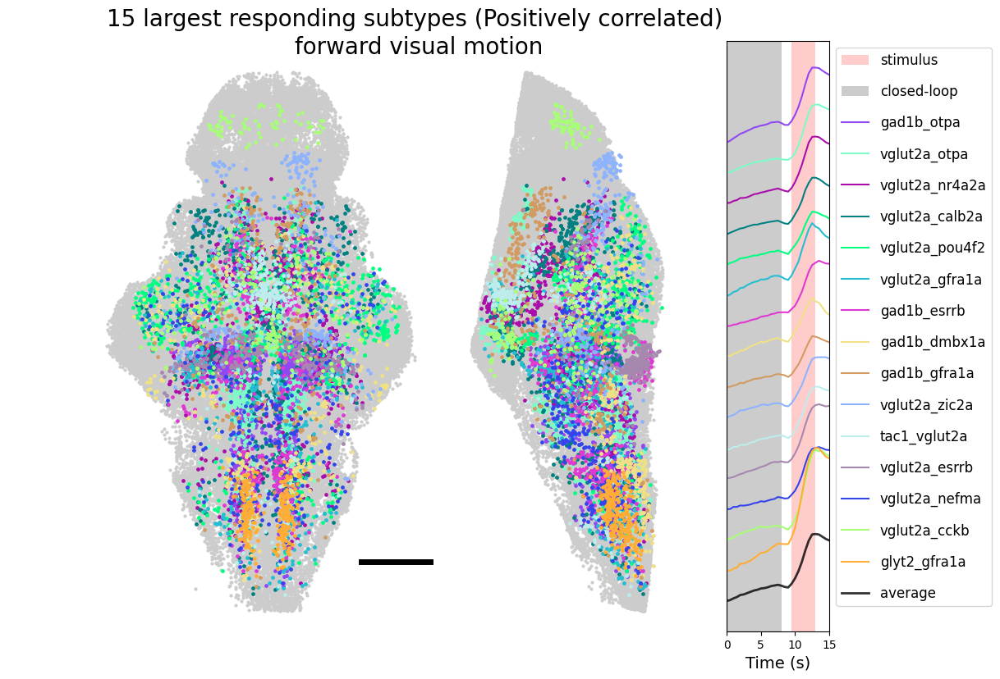

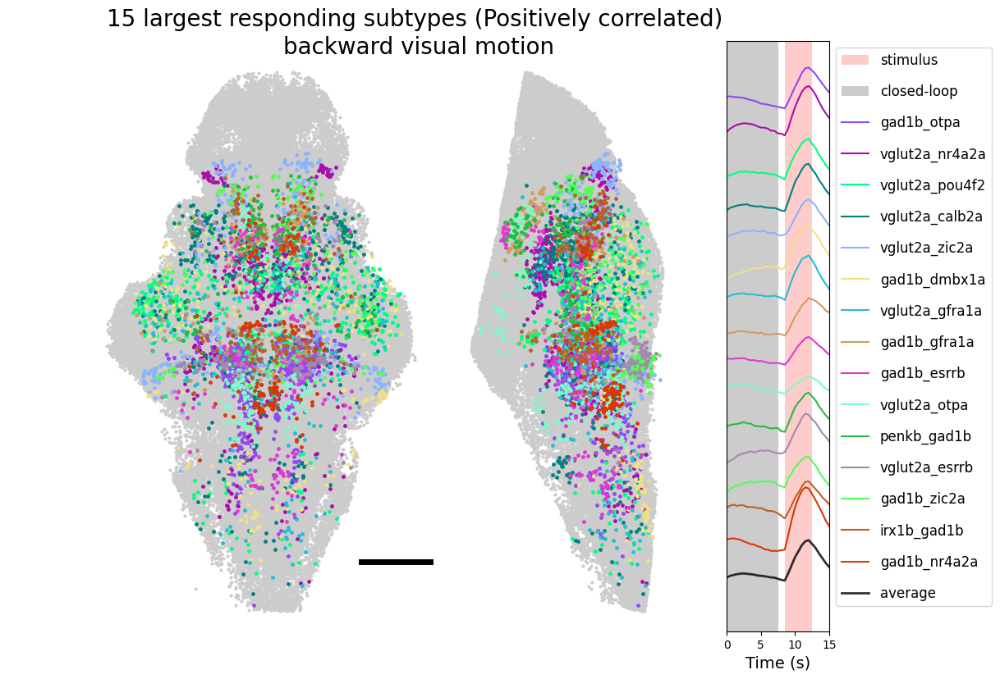

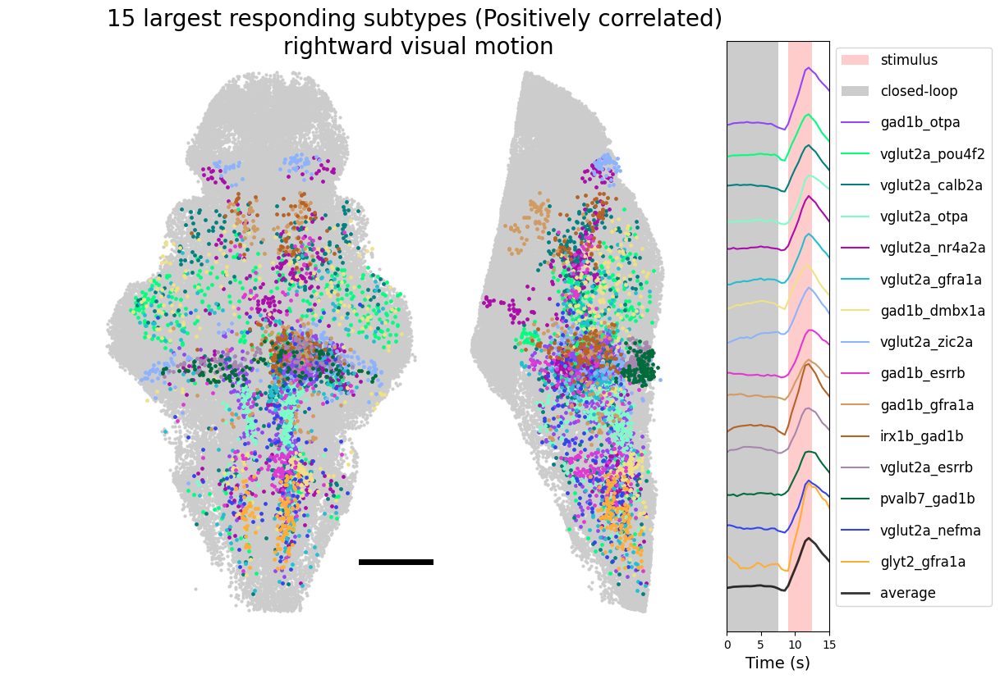

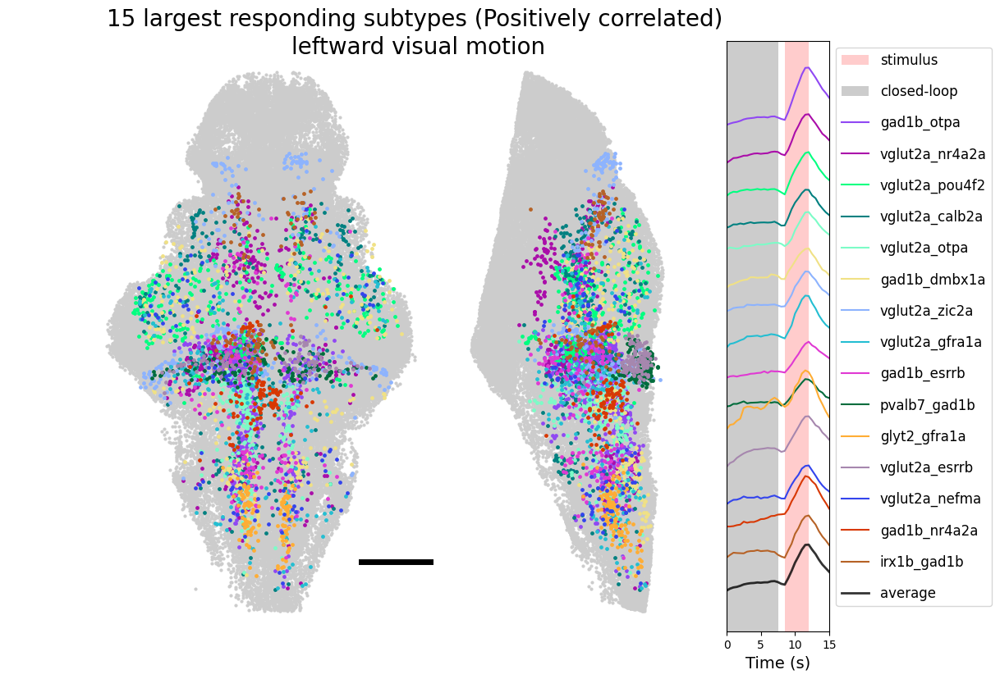

In [ ]:
from matplotlib.gridspec import GridSpec
from matplotlib.transforms import Bbox
###### plotting maps and traces of correlated cells. 
###### side by side to make a movie


#####  Trying to split into layers in Z
##### and also selecting just the 15 with most cells
X = 15 #### number of subtypes


from matplotlib import cm
from matplotlib.colors import ListedColormap

####  correlated responses 
thr = perc5mean[5]#*-1
thr2 = perc3mean[5]#*-1
print(thr, thr2)


temp_Sub_cl_full_list = []

for s in range(8):
# for s in [0]:
    
    temp_s = np.where(big_corr_regsAllMix[:,s]>thr)[0]
    temp_s2 = np.where(high_corr_perSimMix[:,s]>thr2)[0]
    
    print(len(temp_s), len(temp_s2))
    temp_s = np.union1d(temp_s,temp_s2)
    print(len(temp_s))

    temp_f = np.where(fish_id==59)[0]

    names = ['all_cells']

    count = 0

    temp_All = np.zeros((1))
    
    for i, cl in enumerate(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]])):
        ds = 1  ### downsample (skipping cells below)
        if g_in_cls[i]<2:
            continue
        if cl in glia_subs:  ### skipping glial cells
            continue
            
        temp_cl = np.where(cluster_labelsAll3==cl)[0]
        temp_cl = np.intersect1d(temp_cl,temp_s)   
   
        temp_all = np.zeros((1))
        
        for j,b in enumerate(GoodReg):
    
            temp_b = np.where(BrainRegions_All[:,b])[0]
            temp = np.intersect1d(temp_cl,temp_b)
            temp2 = fish_id[temp]

            if len(np.where(temp2==59)[0])>4 and len(np.where(temp2==63)[0])>4 and len(np.where(temp2==71)[0])>4:
                
                if len(np.where(temp2==59)[0])/len(temp2)>0.70 or len(np.where(temp2==63)[0])/len(temp2)>0.70 or len(np.where(temp2==71)[0])/len(temp2)>0.70:
                    # print(x, good_cls_names[i], BrainRegions_names[b])
                    # print(len(np.where(temp2==59)[0])/len(temp2), len(np.where(temp2==63)[0])/len(temp2), len(np.where(temp2==71)[0])/len(temp2))
                    continue


                temp_all = np.hstack((temp_all,temp))
    
                if len(np.where(temp2==59)[0])/len(temp2)>0.67 or len(np.where(temp2==63)[0])/len(temp2)>0.67 or len(np.where(temp2==71)[0])/len(temp2)>0.67:
                    print(stim[s], good_cls_names[i], BrainRegions_names[b])
                    print(len(np.where(temp2==59)[0])/len(temp2), len(np.where(temp2==63)[0])/len(temp2), len(np.where(temp2==71)[0])/len(temp2))
#                 
                
        temp_all = temp_all[1::]

        temp_All = np.hstack((temp_All,temp_all))

    temp_All = temp_All[1::]

    print(len(temp_All))
    
    temp_All = temp_All[::ds]
    
    temp_Sub_cl_full = cluster_labelsAll3[temp_All.astype(int)]

    
    temp_Sub_cl_full_list.append(temp_Sub_cl_full)

    ###### finding the X biggest subtypes to only plot those
    temp_subt, temp_stcounts = np.unique(temp_Sub_cl_full, return_counts=True)

    temp_sort = np.argsort(temp_stcounts)
    temp_sort = temp_sort[::-1]
    print('sorted_counts_',temp_stcounts[temp_sort])

    temp_subt2 = temp_subt[temp_sort][0:X]

    temp_All_short = np.zeros((1))

    for i, cl in enumerate(temp_subt2):
        if cl in temp_subt2:
            temp_cl = np.where(temp_Sub_cl_full==cl)[0]
            temp_All_short = np.hstack((temp_All_short,temp_All[temp_cl]))

    temp_All_short = temp_All_short[1::]
    
    temp_Sub_cl_short = cluster_labelsAll3[temp_All_short.astype(int)]

    temp_Sub_cl = temp_Sub_cl_short

    temp_All = temp_All_short

    if len(temp_Sub_cl)<1:
        continue

    #######
    
    temp_Sub_cl_new = np.zeros((temp_Sub_cl.shape))
    for c,cl in enumerate(unique_ordered(temp_Sub_cl)):
        temp_Sub_cl_new[temp_Sub_cl==cl] = c      

    # temp_Sub_cl2 = np.vstack((temp_Sub_cl,temp_Sub_cl)
    temp_Sub_cl2 = np.vstack((temp_Sub_cl,temp_Sub_cl))
    
    names = ['all_cells']    
    names = names + list(itemgetter(*unique_ordered(temp_Sub_cl)-1)(good_cls_names))   ### the -1 is because there is no subtype 0 but indexing the names starts from 0
    

    cmap = cm.get_cmap('gist_rainbow', len(temp_Sub_cl_new))
    cmap_All= ListedColormap(colors_All)

    
    n = len(np.unique(temp_Sub_cl))
    colors = plt.cm.gist_rainbow(np.linspace(0,1,n))

    ###### making the figure
    fig = plt.figure(figsize=(12.5, 8))
    
    # Set the figure background color to white
    fig.patch.set_facecolor('white')
    
    ax1 = fig.add_axes([0.1, 0.1, 0.5, 0.9], facecolor='none')  # First subplot
    ax2 = fig.add_axes([0.45, 0.1, 0.40, 0.9], facecolor='none')  # Second subplot
    ax3 = fig.add_axes([0.8, 0.1, 0.10, 0.9], facecolor='none')  # Third subplot
    
        
    # plt.figure(figsize=(5,8))
    ax1.scatter(Coords_All[temp_f,1],Coords_All[temp_f,2]*-1,s=4,c='0.8',alpha=1)
    
    for c, cl in enumerate(unique_ordered(temp_Sub_cl)):
        inds = temp_All_short[np.where(temp_Sub_cl==cl)[0]]
        cl=cl-1  ### to adjust the indexing to the colors
    
        ax1.scatter(Coords_All[inds.astype(int),1],Coords_All[inds.astype(int),2]*-1,s=6,alpha=1,c=colors_All[cl], label=names[c+1] )
        names.append(good_cls_names[i])
    
    ax1.plot(np.arange(50,150),np.ones(100)*-800, c='k',linewidth=5)
    
    # plt.legend(names, bbox_to_anchor=(1, 1))
    ax1.axis('equal')
    ax1.set_xlim(25, 550)  # Set x-axis limits
    ax1.set_ylim(-900, -50)  # Set y-axis limits
    ax1.axis('off')
    ax1.invert_xaxis()  # Invert the x-axis
    
    
        #### lateral view
    # plt.figure(figsize=(5,8))
    ax2.scatter(Coords_All[temp_f,0],Coords_All[temp_f,2]*-1,s=4,c='0.8',alpha=1)
    
    
    for c, cl in enumerate(unique_ordered(temp_Sub_cl)):
        inds = temp_All_short[np.where(temp_Sub_cl==cl)[0]]
        cl=cl-1  ### to adjust the indexing to the colors
    
        ax2.scatter(Coords_All[inds.astype(int),0],Coords_All[inds.astype(int),2]*-1,s=6,alpha=1,c=colors_All[cl], label=names[c+1] )
        names.append(good_cls_names[i])
    
    print(count)
    
    ax2.axis('equal')
    ax2.set_xlim(0, 400)  # Set x-axis limits
    ax2.set_ylim(-900, -50)  # Set y-axis limits
    ax2.axis('off')
    
    
    # plt.figure(figsize=(1,7))
    
    names2 = []
    
    temp_mean_array = np.zeros((len(np.unique(temp_Sub_cl)),dff_traceAllavg.shape[1]))
    
    for c, cl in enumerate(unique_ordered(temp_Sub_cl)):
        inds = np.where(temp_Sub_cl==cl)[0]
        temp_mean_array[c] = np.mean(dff_traceAllavg[temp_All[inds].astype(int),:],0)  
    
    temp_corrmat = np.corrcoef(temp_mean_array)
    _ , corr_idx = cluster_corr(temp_corrmat)
    
    
    #### to invert the order
    # corr_idx = corr_idx[::-1]
    
    #### to keep the original order
    corr_idx = np.arange(0,len(corr_idx),1)

    s2=s
    
    ### 2Hz  with the downsmapled version
    ax3.axvspan((stim_timings_ds[s2,0,0]),(stim_timings_ds[s2,0,1]),alpha=dark, facecolor='r')
    names2.append('stimulus')
    ax3.axvspan((stim_timings2_ds[s2,0]),(stim_timings2_ds[s2,1]),alpha=0.2, facecolor='k')
    names2.append('closed-loop')
    
    
    names2 = names2 + list(itemgetter(*unique_ordered(temp_Sub_cl)[corr_idx]-1)(good_cls_names))
    
    
    offset = -0.0
    sorted_inds = np.zeros((1))
    for c, cl in enumerate(unique_ordered(temp_Sub_cl)[corr_idx]):
        inds = np.where(temp_Sub_cl==cl)[0]
        temp_mean = np.mean(dff_traceAllavg[temp_All[inds].astype(int),:],0)
        cl=cl-1  ### trying to adjust the indexing to the colors
        # plt.plot(temp_mean + offset,alpha=1,c = colors_All[cl], label=names2[c])
        ax3.plot((temp_mean - temp_mean[0]) + offset,alpha=1,c = colors_All[cl], label=names2[c])  ### moving the origin
        offset = offset - 0.1
        sorted_inds = np.hstack((sorted_inds,inds))
        count = count + 1
    
    
    print(count)
    
    sorted_inds = sorted_inds[1::]
    # sorted_inds = sorted_inds[::-1]
    
    temp_mean = np.mean(dff_traceAllavg[temp_All.astype(int),:],0)
    ax3.plot((temp_mean-temp_mean[0])+offset,alpha=0.8,c='k',linewidth = '2')
    
    names2.append('average')
      
    dark = 0.2
    
    ax3.legend(names2, loc='upper left', bbox_to_anchor=(1, 1),labelspacing=1.2, fontsize='12',)
    
    
    print('timings',stim_timings2_ds[s2,0],stim_timings2_ds[s2,0]+30)
    ax3.set_xlim([stim_timings2_ds[s2,0],stim_timings2_ds[s2,0]+30])
    temp_ticks = np.array([0,10,20,30])
    ax3.set_xticks([stim_timings2_ds[s2,0],stim_timings2_ds[s2,0]+10,stim_timings2_ds[s2,0]+20,stim_timings2_ds[s2,0]+30],temp_ticks//2)
    ax3.set_yticks([])
    ax3.set_xlabel('Time (s)', fontsize=14) 
    
    plt.tight_layout()
    
    # Add a title for the entire figure
    fig.suptitle('15 largest responding subtypes (Positively correlated) ', fontsize=20, y=1.05, x=0.5)
    fig.text(0.5, 0.98, stim_full[s], ha='center', fontsize=20)
    
    
    # plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/Stim_sub_mov/Neg_corr_traces_stim_{}_300dpi.svg'.format(s+1),transparent=False, dpi=300, bbox_inches= Bbox.from_bounds(1.5, 0, 12.5, 8.5), facecolor='white')
    
    # plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/Stim_sub_mov/pos_corr/Pos_corr_traces_stim_{}_300dpi.png'.format(s+1),transparent=False, dpi=300, bbox_inches= Bbox.from_bounds(1.5, 0, 12.5, 9), facecolor='white')



In [ ]:
###### making the figure
fig = plt.figure(figsize=(12.5, 8))

# Set the figure background color to white
fig.patch.set_facecolor('white')


ax1 = fig.add_axes([0.1, 0.1, 0.5, 0.85], facecolor='none')  # First subplot
ax2 = fig.add_axes([0.45, 0.1, 0.40, 0.85], facecolor='none')  # Second subplot
ax3 = fig.add_axes([0.8, 0.1, 0.10, 0.85], facecolor='none')  # Third subplot

    
ax1.scatter(Coords_All[temp_f,1],Coords_All[temp_f,2]*-1,s=4,c='0.8',alpha=1)

for c, cl in enumerate(unique_ordered(temp_Sub_cl)):
    inds = temp_All_short[np.where(temp_Sub_cl==cl)[0]]
    cl=cl-1  ### to adjust the indexing to the colors

    ax1.scatter(Coords_All[inds.astype(int),1],Coords_All[inds.astype(int),2]*-1,s=6,alpha=1,c=colors_All[cl], label=names[c+1] )
    names.append(good_cls_names[i])

ax1.plot(np.arange(50,150),np.ones(100)*-800, c='k',linewidth=5)

# plt.legend(names, bbox_to_anchor=(1, 1))
ax1.axis('equal')
ax1.set_xlim(25, 550)  # Set x-axis limits
ax1.set_ylim(-900, -50)  # Set y-axis limits
ax1.axis('off')
ax1.invert_xaxis()  # Invert the x-axis


    #### lateral view
ax2.scatter(Coords_All[temp_f,0],Coords_All[temp_f,2]*-1,s=4,c='0.8',alpha=1)


for c, cl in enumerate(unique_ordered(temp_Sub_cl)):
    inds = temp_All_short[np.where(temp_Sub_cl==cl)[0]]
    cl=cl-1  ### to adjust the indexing to the colors

    ax2.scatter(Coords_All[inds.astype(int),0],Coords_All[inds.astype(int),2]*-1,s=6,alpha=1,c=colors_All[cl], label=names[c+1] )
    names.append(good_cls_names[i])

print(count)

ax2.axis('equal')
ax2.set_xlim(0, 400)  # Set x-axis limits
ax2.set_ylim(-900, -50)  # Set y-axis limits
ax2.axis('off')


# plt.figure(figsize=(1,7))

names2 = []

temp_mean_array = np.zeros((len(np.unique(temp_Sub_cl)),dff_traceAllavg.shape[1]))

for c, cl in enumerate(unique_ordered(temp_Sub_cl)):
    inds = np.where(temp_Sub_cl==cl)[0]
    temp_mean_array[c] = np.mean(dff_traceAllavg[temp_All[inds].astype(int),:],0)  

temp_corrmat = np.corrcoef(temp_mean_array)
_ , corr_idx = cluster_corr(temp_corrmat)


#### to invert the order
# corr_idx = corr_idx[::-1]

#### to keep the original order
corr_idx = np.arange(0,len(corr_idx),1)

### 2Hz  with the downsmapled version
ax3.axvspan((stim_timings_ds[s2,0,0]),(stim_timings_ds[s2,0,1]),alpha=dark, facecolor='r')
names2.append('stimulus')
ax3.axvspan((stim_timings2_ds[s2,0]),(stim_timings2_ds[s2,1]),alpha=0.2, facecolor='k')
names2.append('closed-loop')


names2 = names2 + list(itemgetter(*unique_ordered(temp_Sub_cl)[corr_idx]-1)(good_cls_names))


offset = -0.0
sorted_inds = np.zeros((1))
for c, cl in enumerate(unique_ordered(temp_Sub_cl)[corr_idx]):
    inds = np.where(temp_Sub_cl==cl)[0]
    temp_mean = np.mean(dff_traceAllavg[temp_All[inds].astype(int),:],0)
    cl=cl-1  ### trying to adjust the indexing to the colors
    # plt.plot(temp_mean + offset,alpha=1,c = colors_All[cl], label=names2[c])
    ax3.plot((temp_mean - temp_mean[0]) + offset,alpha=1,c = colors_All[cl], label=names2[c])  ### moving the origin
    offset = offset - 0.1
    sorted_inds = np.hstack((sorted_inds,inds))
    count = count + 1


print(count)

sorted_inds = sorted_inds[1::]
# sorted_inds = sorted_inds[::-1]

temp_mean = np.mean(dff_traceAllavg[temp_All.astype(int),:],0)
ax3.plot((temp_mean-temp_mean[0])+offset,alpha=0.8,c='k',linewidth = '2')

names2.append('average')

# for s2 in range(8):
# for s2 in [0]:
s2=s

dark = 0.2

ax3.legend(names2, loc='upper left', bbox_to_anchor=(1, 1),labelspacing=1.2, fontsize='12',)


print('timings',stim_timings2_ds[s2,0],stim_timings2_ds[s2,0]+30)
ax3.set_xlim([stim_timings2_ds[s2,0],stim_timings2_ds[s2,0]+30])
temp_ticks = np.array([0,10,20,30])
ax3.set_xticks([stim_timings2_ds[s2,0],stim_timings2_ds[s2,0]+10,stim_timings2_ds[s2,0]+20,stim_timings2_ds[s2,0]+30],temp_ticks//2)
ax3.set_yticks([])
ax3.set_xlabel('Time (s)', fontsize=14) 

plt.tight_layout()

# Add a title for the entire figure
fig.suptitle('15 largest responding subtypes (Negatively correlated) ', fontsize=20, y=1.05, x=0.5)
fig.text(0.5, 0.98, stim_full[s], ha='center', fontsize=20)


# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/Stim_sub_mov/neg_corr/Neg_corr_traces_stim_{}_300dpi.png'.format(s+1),transparent=False, dpi=300, bbox_inches= Bbox.from_bounds(1.5, 0, 12.5, 8.5), facecolor='white')



In [ ]:
##### making also dataframes to have as sup. table

for s in range(8):
# for s in [0]:
    

    ###### finding the biggest subtypes to only plot those
    temp_subt, temp_stcounts = np.unique(temp_Sub_cl_full_list[s], return_counts=True)
    
    temp_sort = np.argsort(temp_stcounts)
    temp_sort = temp_sort[::-1]
    print(len(temp_subt))
    print('sorted_counts_',temp_stcounts[temp_sort]/3)
    
    plt.figure(figsize=[4,0.5])
    plt.bar(np.array(good_cls_names)[temp_subt[temp_sort]-1], np.log10(temp_stcounts[temp_sort]/3), color=np.array(colors_All)[temp_subt[temp_sort]-1])
    plt.xticks([])
    # plt.xticks(range(len(temp_subt)),np.array(good_cls_names)[temp_subt[temp_sort]-1], rotation = 90, fontsize=10)
    plt.xlim(-0.50,14.5)
    plt.ylim([0,3])
    plt.yticks([0, 1, 2, 3],['0', '10', '100', '1000'])  # Specify the ticks you want
    # # plt.title("subtypes "+ stim[s])


    
    df = pd.DataFrame(np.round(temp_stcounts[temp_sort]/3,2), index=list(np.array(good_cls_names)[temp_subt[temp_sort]-1]),columns=[stim_full[s]]).T

    # df.to_csv('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/Neg_corr_traces_stim_{}.csv'.format(s+1), index=True)
    # df.to_csv('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/Pos_corr_traces_stim_{}.csv'.format(s+1), index=True)




In [ ]:
##################  circular graphs  ########


In [ ]:
def get_label_rotation(angle, offset, invert=True):
    # Rotation must be specified in degrees :(
    rotation = np.rad2deg(angle + offset)
    if invert:
        if angle <= np.pi:
            alignment = "right"
            rotation = rotation + 180
        else: 
            alignment = "left"
        return rotation, alignment
    else:
        return rotation, "left"

def add_labels(angles, values, labels, offset, invert, ax):
    
    # This is the space between the end of the bar and the label
    padding = 10
    
    # Iterate over angles, values, and labels, to add all of them.
    for angle, value, label, in zip(angles, values, labels):
        angle = angle
        
        # Obtain text rotation and alignment
        rotation, alignment = get_label_rotation(angle, offset, invert=invert)

        # And finally add the text
        ax.text(
            x=angle, 
            y=value + padding, 
            s=label, 
            ha=alignment, 
            va="center", 
            rotation=rotation, 
            rotation_mode="anchor",
            fontsize=8
        ) 

In [ ]:
MaxN = 15
PAD = 2

group_values = []
group_labels = []
group_colors = []
group_alphas = []
group_widths = []

for s in range(8):
# for s in [0]:

    ###### finding the biggest subtypes to only plot those
    temp_subt, temp_stcounts = np.unique(temp_Sub_cl_full_list[s], return_counts=True)
    
    temp_sort = np.argsort(temp_stcounts)
    temp_sort = temp_sort[::-1]
    print(len(temp_subt))
    print('sorted_counts_',temp_stcounts[temp_sort[0:15]]/3)


    if len(temp_sort)>15:
        maxN = 15
    elif len(temp_sort)<15:
        maxN = len(temp_sort)
        
    values = np.zeros((MaxN))
    labels = np.full((MaxN), ' ', dtype='<U31')
    colors = np.zeros((MaxN,3))
    alphas = np.zeros((MaxN))
    
    values[0:maxN] = temp_stcounts[temp_sort[0:maxN]]/3
    labels[0:maxN] = np.array(good_cls_names)[temp_subt[temp_sort[0:maxN]]-1]
    labels[maxN+1::] = ''
    colors[0:maxN] = np.array(colors_All)[temp_subt[temp_sort[0:maxN]]-1]
    
    alphas[0:maxN] = np.flip((np.arange(0, maxN)/maxN + .25)/1.25)

    
#     input_values = subtype_pos_count[:, stim_i]
#     sort_inds = np.flip(np.argsort(input_values))[:maxN]
#     values = input_values[sort_inds]
#     labels = np.array(fish_data[fish_n]['subtype_names'])[sort_inds]
#     labels[3:] = ''
#     colors = subtype_colors[sort_inds]
#     alphas = np.flip((np.arange(0, maxN)/maxN + .25)/1.25)
# #     alphas = np.ones(maxN)
    
    group_values.append(values)
    group_labels.append(labels)
    group_colors.append(colors)
    group_alphas.append(alphas)

ANGLES_N = maxN * len(group_values) + PAD * len(group_values)
ANGLES = np.linspace(0, 2 * np.pi, num=ANGLES_N, endpoint=False)
WIDTH = (2 * np.pi) / len(ANGLES) * 1

# Obtaining the right indexes is now a little more complicated
offset = 0
IDXS = []
for group_i in range(len(group_values)):
    IDXS += list(range(offset + PAD, offset + maxN + PAD))
    offset += maxN + PAD
    
OFFSET = np.pi / 2

# Same layout as above
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={"projection": "polar"})

ax.set_theta_offset(OFFSET)
# ax.set_ylim(-250, 1000)
ax.set_frame_on(False)
ax.xaxis.grid(False)
ax.yaxis.grid(True, linestyle=(0, (5, 10)))
ax.set_rscale('symlog')
ax.set_rlabel_position(+8)
ax.set_xticks([])

for g_i in range(8):
    x = 2*np.pi/len(IDXS) * (maxN*g_i + 1)
    ax.axvline(x, color='k', lw=.5, ymin=.0006, linestyle=(0, (20, 10)))
    x = 2*np.pi/len(IDXS) * (maxN*g_i + maxN)
    ax.axvline(x, color='k', lw=.5, ymin=.0006, linestyle=(0, (20, 10)))

colors = np.concatenate(group_colors)
alphas = np.concatenate(group_alphas)
colors_with_alpha = np.concatenate((colors, alphas[:, None]), axis=1)
bar = ax.bar(
    ANGLES[IDXS], np.concatenate(group_values), width=WIDTH, color=colors_with_alpha, 
    edgecolor="white", linewidth=2, bottom=.001
)

add_labels(ANGLES[IDXS], np.concatenate(group_values), np.concatenate(group_labels), OFFSET, True, ax)

# fig.savefig('./polar_barplot.jpg', dpi=500, bbox_inches='tight')
# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/Pos_corr_polar_barplot_300dpi.svg',transparent=True, dpi=300, bbox_inches='tight')

In [ ]:
##### specific subpopulation analysis

from scipy import stats
import scikit_posthocs as sp


no_nans = np.where(~np.isnan(dff_traceAll[:,0]))[0]
in_planeAll_idx = np.where(in_planeAll)[0]

good_cells = np.intersect1d(no_nans, in_planeAll_idx)


####### for specific examples

b = BrainRegions_names.tolist().index('inferior_medulla_oblongata')
# b = BrainRegions_names.tolist().index('intermediate_medulla_oblongata')
# b = BrainRegions_names.tolist().index('superior_medulla_oblongata')
# b = BrainRegions_names.tolist().index('medulla_oblongata')
# b = BrainRegions_names.tolist().index('cerebellum')
# b = BrainRegions_names.tolist().index('superior_raphe')
# b = BrainRegions_names.tolist().index('tegmentum')
# b = BrainRegions_names.tolist().index('nucleus_isthmi')
# b = BrainRegions_names.tolist().index('periventricular_layer')
# b = BrainRegions_names.tolist().index('pretectum')
# b = BrainRegions_names.tolist().index('prethalamus_(ventral_thalamus)')
# b = BrainRegions_names.tolist().index('dorsal_thalamus_proper')
# b = BrainRegions_names.tolist().index('habenula')
# b = BrainRegions_names.tolist().index('telencephalon')



temp_b = np.where(BrainRegions_All[:,b])[0]
temp_b = np.intersect1d(temp_b, good_cells) 
# temp_b = good_cells.copy() #### no anatomical filtering

##### getting the ones classified as subtype (this is just needed for when looking at a gene and not a subtype)
temp_b = np.setdiff1d(temp_b, np.where(cluster_labelsAll3==0)[0])

print(len(temp_b))



#######################


subtype_2_check = 'glyt2_gfra1a'
# subtype_2_check = 'pou4f2_cckb'


#### for a specific subtype
temp_cl = np.where(cluster_labelsAll3 == good_cls_names.index(subtype_2_check)+1)[0]


len(temp_cl)

temp_b_cl_g = np.intersect1d(temp_b, temp_cl)


##### getting the ones that responded to stimuli
thr = perc5mean[5]#*-1
thr2 = perc3mean[5]#*-1

print(thr, thr2)

### for a specific stimulus
s=0
temp_s = np.where(big_corr_regsAllMix[:,s]>thr)[0]
# temp_s2 = np.where(high_corr_perSimMix[:,s]>thr2)[0]
# temp_s = np.union1d(temp_s,temp_s2)

temp_b_cl_g_s = np.intersect1d(temp_b_cl_g, temp_s)


##### saving the 2 examples glyt2_cart and the cart2_gad cells to check if their registration was accurate. 
# np.save('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/glyt2_gfra1a_infMO_fwrd_temp_in_All_20250402.npy', temp_b_cl_g_s)
# np.save('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/cart2_gad_pv_dark_temp_in_All_20250402.npy', temp_b_cl_g_s)


##############


###### other responsive cells
temp_b_s = np.intersect1d(temp_b, temp_s)
temp_b_s = np.setdiff1d(temp_b_s, temp_b_cl_g_s)

###### the non-responsive cells in the same region (but that have traces)
temp_b2 = np.setdiff1d(temp_b, temp_s)
temp_b2 = np.setdiff1d(temp_b2, temp_cl)



print(temp_b_cl_g_s.shape, temp_b_s.shape, temp_b2.shape, temp_b.shape)


######

temp_Sub_cl = cluster_labelsAll3[temp_b_cl_g_s]

temp_fishID = fish_id2[temp_b_cl_g_s]

#######
 

temp_Sub_cl2 = np.vstack((temp_Sub_cl,temp_Sub_cl))

names = []    
names = names + list(itemgetter(*np.unique(temp_Sub_cl)-1)(good_cls_names)) 
print(names)

plt.figure(figsize=(5,8))
plt.scatter(Coords_All[temp_f,1],Coords_All[temp_f,2]*-1,s=4,c='0.8',alpha=1)
plt.scatter(Coords_All[temp_b_cl_g_s,1],Coords_All[temp_b_cl_g_s,2]*-1,s=4,c=colors_All[good_cls_names.index(subtype_2_check)],alpha=1)

plt.axis('equal')
plt.xlim(25, 550)  # Set x-axis limits
plt.ylim(-900, -50)  # Set y-axis limits

# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/glyt2a_gfra1a_corr_map_top_stim_{}_300dpi.png'.format(s+1),transparent=True, dpi=300)
# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/pou4f2_cckb_map_top_stim_{}_300dpi.png'.format(s+1),transparent=True, dpi=300)


plt.figure(figsize=(5,8))
plt.scatter(Coords_All[temp_f,0],Coords_All[temp_f,2]*-1,s=4,c='0.8',alpha=1)
plt.scatter(Coords_All[temp_b_cl_g_s,0],Coords_All[temp_b_cl_g_s,2]*-1,s=4,c=colors_All[good_cls_names.index(subtype_2_check)],alpha=1)

plt.axis('equal')
plt.xlim(25, 550)  # Set x-axis limits
plt.ylim(-900, -50)  # Set y-axis limits

# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/glyt2a_gfra1a_map_side_stim_{}_300dpi.png'.format(s+1),transparent=True, dpi=300)
# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/pou4f2_cckb_map_side_stim_{}_300dpi.png'.format(s+1),transparent=True, dpi=300)


##### per fish
plt.figure(figsize=(5,8))
plt.scatter(Coords_All[temp_f,1],Coords_All[temp_f,2]*-1,s=4,c='0.8',alpha=1)
plt.scatter(Coords_All[temp_b_cl_g_s,1],Coords_All[temp_b_cl_g_s,2]*-1,s=4,cmap='brg',c=fish_id2[temp_b_cl_g_s],alpha=1)

plt.axis('equal')
plt.xlim(25, 550)  # Set x-axis limits
plt.ylim(-900, -50)  # Set y-axis limits



plt.figure(figsize=(10,5))
plt.imshow(dff_traceAllavg[temp_b_cl_g_s,:],vmin=-0.1, vmax=0.4,cmap='inferno',aspect='auto',interpolation='nearest')


plt.figure(figsize=(10,5))
time_stamp2 = np.arange(0,dff_traceAllavg.shape[1]/2,0.5)
plt.plot(time_stamp2,np.nanmean(dff_traceAllavg[temp_b_cl_g_s,:],0),c=colors_All[good_cls_names.index(subtype_2_check)],linewidth='3')

# error = np.nanstd(dff_traceAllavg[temp_b_cl_g_s,:],0)
error = stats.sem(dff_traceAllavg[temp_b_cl_g_s,:],0)

# Fill the area between the line and the error margin
plt.fill_between(time_stamp2, np.nanmean(dff_traceAllavg[temp_b_cl_g_s,:],0) - error, np.nanmean(dff_traceAllavg[temp_b_cl_g_s,:],0) + error, color=colors_All[good_cls_names.index(subtype_2_check)], alpha=0.2, label='Error Shadow')



plt.xlim([0,dff_traceAllavg.shape[1]/2])
plt.ylim([0,np.max(np.nanmean(dff_traceAllavg[temp_b_cl_g_s,:],0))+0.01])



#### changes in luminance (1Hz)
plt.axvspan(0,134,alpha=0.2, facecolor='k')
for ss in range(8):
    dark = 0.2
    if ss == 4:
        dark = 0.9
        plt.axvspan((stim_timings[ss,0,0]/6000)-1.5,(stim_timings[ss,0,1]/6000)-1.5,alpha=dark, facecolor='k')
    elif ss == 5:
        dark = 0.9
        plt.axvspan((stim_timings[ss,0,0]/6000)-1.5,(stim_timings[ss,0,1]/6000)-1.5,alpha=dark, facecolor='w')
    elif ss == 6 or ss == 7:
        dark = 0.7
        plt.axvspan((stim_timings[ss,0,0]/6000)-1.5,(stim_timings[ss,0,1]/6000)-1.5,alpha=dark, facecolor='k')
    else:
        dark = 0.2
        plt.axvspan((stim_timings[ss,0,0]/6000)-1.5,(stim_timings[ss,0,1]/6000)-1.5,alpha=dark, facecolor='k')
    
for ss in range(8):
    plt.axvspan((stim_timings2[ss,0]/6000)-1.5,(stim_timings2[ss,1]/6000)-1.5,alpha=0.2, facecolor='k')


# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/pou4f2_cckb_corr_trace_wSEM_lumin_stim_{}_300dpi.svg'.format(s+1),transparent=True, dpi=300)



plt.figure(figsize=[8,5])
plt.imshow(genes_df_All_nans[temp_b_cl_g_s,:][:,genes_sorted], vmin=25, vmax=100, cmap='inferno', aspect="auto",interpolation='nearest')
plt.xticks(range(len(gene_names)),np.array(gene_names)[genes_sorted], rotation = 45) 
plt.title('Gene expression')


plt.figure(figsize=(1,5))

plt.imshow(temp_Sub_cl2.T,aspect='auto',cmap=cmap_All,interpolation='nearest',vmin=1,vmax=332)

##### plotting which fish they belong to
temp_fishID2 = np.vstack((temp_fishID,temp_fishID))
plt.figure(figsize=(1,5))
plt.imshow(temp_fishID2.T,aspect='auto',cmap='brg',interpolation='nearest',vmin=1, vmax=3)


##### plotting if the neurons are involved in swimming or not
swim_bar = np.vstack((swim_corr_All[temp_b_cl_g_s],swim_corr_All[temp_b_cl_g_s]))
# swim_bar.shape
plt.figure(figsize=(1,5))
plt.imshow(swim_bar.T,aspect='auto',cmap='bwr',interpolation='nearest',vmin=-0.5, vmax=0.5)


plt.figure(figsize=(7,5))
corr_mat = np.corrcoef(dff_traceAllavg[temp_b_cl_g_s,:])
plt.imshow(corr_mat,cmap='bwr', interpolation='nearest',vmin=-1, vmax=1)
plt.colorbar()
print(corr_mat.shape[0], np.nanmean(np.corrcoef(dff_traceAllavg[temp_b_cl_g_s,:])[np.where(np.tril(np.corrcoef(dff_traceAllavg[temp_b_cl_g_s,:]),-1))]))
# print(np.nanmean(dff_traceAllavgCorrs[temp_b_cl_g_s]))


##### for max amplitude
w_peaks, _ = find_peaks(regressors[s,:], height=0.8, distance=10)

if len(w_peaks)>9:
    w_peaks = w_peaks[1::]

wind_t1 = np.zeros((9,len(temp_b_cl_g_s)))
wind_t2 = np.zeros((9,len(temp_b_s)))
wind_t3 = np.zeros((9,len(temp_b2)))


for t in range(9):
    wind_t1[t,:] = np.mean(dff_traceAll[temp_b_cl_g_s,w_peaks[t]-3:w_peaks[t]+7],1)
    
    wind_t2[t,:] = np.mean(dff_traceAll[temp_b_s,w_peaks[t]-3:w_peaks[t]+7],1)
    
    wind_t3[t,:] = np.mean(dff_traceAll[temp_b2,w_peaks[t]-3:w_peaks[t]+7],1)
    

# print(wind_t1.shape, wind_t2.shape, wind_t3.shape)
                    

cellst1 = np.mean(wind_t1,0)
cellst2 = np.mean(wind_t2,0)
cellst3 = np.mean(wind_t3,0)  

stat, pv = stats.kruskal(cellst1, cellst2, cellst3)

print('max amp Kruskal p=',pv)

if pv<0.05:
    
    plt.figure()
    # plt.boxplot([cellst1, cellst2, cellst3])
    plt.violinplot([cellst1, cellst2, cellst3], showmeans=False, showextrema=False, showmedians=True)
    plt.title(stim[s]+'_'+ BrainRegions_names[b]+'_p:'+str(pv))
    plt.xticks([1,2,3],['subtype','other resp', 'rest'], rotation = 45)
    plt.ylim([-0.1,1.5])

    # plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/glyt2a_gfra1a_corr_maxresp_stim_{}_300dpi.svg'.format(s+1),transparent=True, dpi=300)

    #perform Dunn's test using a Bonferonni correction for the p-values
    results_D = sp.posthoc_dunn([cellst1, cellst2, cellst3], p_adjust = 'bonferroni')
    plt.figure()
    plt.imshow(results_D,vmin= 0.0001, vmax=0.12,cmap='tab20c',interpolation='nearest')
    plt.xticks(range(3),['subtype','other resp', 'rest'], rotation = 45) 
    plt.yticks(range(3),['subtype','other resp', 'rest']) 
    plt.colorbar()
    plt.title("Max Resp: Dunn_for_"+ stim[s]+'_in_'+ BrainRegions_names[b])
    # plt.title("Max Resp: Dunn_for_"+ stim[s]+'_in_'+np.array(BrainRegions_names_short)[np.argwhere(GoodReg==b)][0][0])

    print('Max Resp')
    print(np.nanmean(cellst1),np.nanmean(cellst2),np.nanmean(cellst3))
    print(np.nanstd(cellst1),np.nanstd(cellst2),np.nanstd(cellst3))
    print(len(cellst1),len(cellst2),len(cellst3))

    print('max amp Dunn p=',results_D)

    # df = pd.DataFrame(results_D).T
    # # Change index and columns directly
    # df.index = ['subtype','other resp', 'rest']
    # df.columns = ['subtype','other resp', 'rest']
    # df.to_csv('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/MaxAmpDunn_{}.csv'.format(subtype_2_check), index=True)

    

######## showing responses to other stimuli
##### for max amplitude

cellst1_ms = []

# for sss in [0,4,5,6,7]:
for sss in range(8):
    w_peaks, _ = find_peaks(regressors[sss,:], height=0.8, distance=10)

    if len(w_peaks)>9:
        w_peaks = w_peaks[1::]
    
    wind_t1 = np.zeros((9,len(temp_b_cl_g_s)))

    for t in range(9):
        wind_t1[t,:] = np.max(dff_traceAll[temp_b_cl_g_s,w_peaks[t]-3:w_peaks[t]+7],1)
        
        wind_t2[t,:] = np.max(dff_traceAll[temp_b_s,w_peaks[t]-3:w_peaks[t]+7],1)
        
        wind_t3[t,:] = np.max(dff_traceAll[temp_b2,w_peaks[t]-3:w_peaks[t]+7],1)
                   

    cellst1_ms.append(np.mean(wind_t1,0))


stat, pv = stats.kruskal(*cellst1_ms)


if pv<0.05:
    
    plt.figure(figsize=(10,5))
    # plt.boxplot([cellst1, cellst2, cellst3])
    plt.violinplot([*cellst1_ms], showmeans=False, showextrema=False, showmedians=True)
    plt.title(stim[s]+'_'+ BrainRegions_names[b]+'_p:'+str(pv))
    plt.xticks([1,2,3,4,5,6,7,8],stim, rotation = 45)
    plt.ylim([-0.1,1])

    # plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/pou4f2_cckb_corr_MaxOtherstimTest_stim_{}_300dpi.svg'.format(s+1),transparent=True, dpi=300)

    
    #perform Dunn's test using a Bonferonni correction for the p-values
    results_D = sp.posthoc_dunn([*cellst1_ms], p_adjust = 'bonferroni')
    plt.figure()
    plt.imshow(results_D,vmin= 0.0001, vmax=0.12,cmap='tab20c',interpolation='nearest')
    plt.xticks(range(8),stim, rotation = 45) 
    plt.yticks(range(8),stim) 
    plt.colorbar()
    plt.title("Max Resp: Dunn_for_"+ stim[s]+'_in_'+ BrainRegions_names[b])
    # plt.title("Max Resp: Dunn_for_"+ stim[s]+'_in_'+np.array(BrainRegions_names_short)[np.argwhere(GoodReg==b)][0][0])


    # print(results_D)

    # df = pd.DataFrame(results_D).T
    # # Change index and columns directly
    # df.index = stim
    # df.columns = stim
    # df.to_csv('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/MaxAmpToStimDunn_{}.csv'.format(subtype_2_check), index=True)


##### for area under the curve
w_peaks, _ = find_peaks(regressors[s,:], height=0.8, distance=10)

if len(w_peaks)>9:
    w_peaks = w_peaks[1::]

wind_t1 = np.zeros((9,len(temp_b_cl_g_s)))
wind_t2 = np.zeros((9,len(temp_b_s)))
wind_t3 = np.zeros((9,len(temp_b2)))


for t in range(9):
    wind_t1[t,:] = np.trapz(dff_traceAll[temp_b_cl_g_s,w_peaks[t]-3:w_peaks[t]+7],axis=1)
    
    wind_t2[t,:] = np.trapz(dff_traceAll[temp_b_s,w_peaks[t]-3:w_peaks[t]+7],axis=1)
    
    wind_t3[t,:] = np.trapz(dff_traceAll[temp_b2,w_peaks[t]-3:w_peaks[t]+7],axis=1)
    

# print(wind_t1.shape, wind_t2.shape, wind_t3.shape)
                    
cellst1 = np.mean(wind_t1,0)
cellst2 = np.mean(wind_t2,0)
cellst3 = np.mean(wind_t3,0)  

stat, pv = stats.kruskal(cellst1, cellst2, cellst3)

if pv<0.05:
    
    plt.figure()
    # plt.boxplot([cellst1, cellst2, cellst3])
    plt.violinplot([cellst1, cellst2, cellst3], showmeans=False, showextrema=False, showmedians=True)
    plt.title(stim[s]+'_'+ BrainRegions_names[b]+'_p:'+str(pv))
    plt.xticks([1,2,3],['subtype','other resp', 'rest'], rotation = 45)

    #perform Dunn's test using a Bonferonni correction for the p-values
    results_D = sp.posthoc_dunn([cellst1, cellst2, cellst3], p_adjust = 'bonferroni')
    plt.figure()
    plt.imshow(results_D,vmin= 0.0001, vmax=0.12,cmap='tab20c',interpolation='nearest')
    plt.xticks(range(3),['subtype','other resp', 'rest'], rotation = 45) 
    plt.yticks(range(3),['subtype','other resp', 'rest']) 
    plt.colorbar()
    plt.title("Area Under Curve: Dunn_for_"+ stim[s]+'_in_'+ BrainRegions_names[b])
    # plt.title("Area Under Curve: Dunn_for_"+ stim[s]+'_in_'+np.array(BrainRegions_names_short)[np.argwhere(GoodReg==b)][0][0])

    print('Area Under Curve')
    print(np.nanmean(cellst1),np.nanmean(cellst2),np.nanmean(cellst3))
    print(np.nanstd(cellst1),np.nanstd(cellst2),np.nanstd(cellst3))
    print(len(cellst1),len(cellst2),len(cellst3))


###### for correlation to stimulus:

cellst1 = np.max(np.vstack((big_corr_regsAllMix[temp_b_cl_g_s,s],high_corr_perSimMix[temp_b_cl_g_s,s])),0)
cellst2 = np.max(np.vstack((big_corr_regsAllMix[temp_b_s,s],high_corr_perSimMix[temp_b_s,s])),0)
cellst3 = np.max(np.vstack((big_corr_regsAllMix[temp_b2,s],high_corr_perSimMix[temp_b2,s])),0) 

# cellst1 = big_corr_regsAllMix[temp_b_cl_g_s,s]
# cellst2 = big_corr_regsAllMix[temp_b_s,s]
# cellst3 = big_corr_regsAllMix[temp_b2,s] 


# stat, pv = stats.kruskal(big_corr_regsAllMix[temp_b_cl_g_s,s], big_corr_regsAllMix[temp_b_s,s], big_corr_regsAllMix[temp_b2,s])

stat, pv = stats.kruskal(cellst1, cellst2, cellst3)


if pv<0.05:
    
    plt.figure()
    # plt.boxplot([big_corr_regsAllMix[temp_b_cl_g_s,s], big_corr_regsAllMix[temp_b_s,s], big_corr_regsAllMix[temp_b,s]])
    plt.violinplot([cellst1, cellst2, cellst3], showmeans=False, showextrema=False, showmedians=True)
    plt.title(stim[s]+'_'+ BrainRegions_names[b]+'_p:'+str(pv))
    plt.xticks([1,2,3],['subtype','other resp', 'rest'], rotation = 45)

    #perform Dunn's test using a Bonferonni correction for the p-values
    results_D = sp.posthoc_dunn([cellst1, cellst2, cellst3], p_adjust = 'bonferroni')
    plt.figure()
    plt.imshow(results_D,vmin= 0.0001, vmax=0.12,cmap='tab20c',interpolation='nearest')
    plt.xticks(range(3),['subtype','other resp', 'rest'], rotation = 45) 
    plt.yticks(range(3),['subtype','other resp', 'rest']) 
    plt.colorbar()
    plt.title("Correlation to stim: Dunn_for_"+ stim[s]+'_in_'+ BrainRegions_names[b])
    # plt.title("Correlation to stim: Dunn_for_"+ stim[s]+'_in_'+np.array(BrainRegions_names_short)[np.argwhere(GoodReg==b)][0][0])

    print('Correlation to stim')
    print(np.nanmean(cellst1),np.nanmean(cellst2),np.nanmean(cellst3))
    print(np.nanstd(cellst1),np.nanstd(cellst2),np.nanstd(cellst3))
    print(len(cellst1),len(cellst2),len(cellst3))


###### for correlation to swimming:

cellst1 = swim_corr_All[temp_b_cl_g_s]
cellst2 = swim_corr_All[temp_b_s]
cellst3 = swim_corr_All[temp_b2]


# stat, pv = stats.kruskal(big_corr_regsAllMix[temp_b_cl_g_s,s], big_corr_regsAllMix[temp_b_s,s], big_corr_regsAllMix[temp_b2,s])

stat, pv = stats.kruskal(cellst1, cellst2, cellst3)

print('corr to swim Kruskal p=',pv)
    
if pv<0.05:
    
    plt.figure()
    # plt.boxplot([big_corr_regsAllMix[temp_b_cl_g_s,s], big_corr_regsAllMix[temp_b_s,s], big_corr_regsAllMix[temp_b,s]])
    plt.violinplot([cellst1, cellst2, cellst3], showmeans=False, showextrema=False, showmedians=True)
    plt.title(stim[s]+'_'+ BrainRegions_names[b]+'_p:'+str(pv))
    plt.xticks([1,2,3],['subtype','other resp', 'rest'], rotation = 45)

    # plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/glyt2a_gfra1a_corr_toswimTest_stim_{}_300dpi.svg'.format(s+1),transparent=True, dpi=300)

    #perform Dunn's test using a Bonferonni correction for the p-values
    results_D = sp.posthoc_dunn([cellst1, cellst2, cellst3], p_adjust = 'bonferroni')
    plt.figure()
    plt.imshow(results_D,vmin= 0.0001, vmax=0.12,cmap='tab20c',interpolation='nearest')
    plt.xticks(range(3),['subtype','other resp', 'rest'], rotation = 45) 
    plt.yticks(range(3),['subtype','other resp', 'rest']) 
    plt.colorbar()
    plt.title("Correlation to swim: Dunn_for_"+ stim[s]+'_in_'+ BrainRegions_names[b])
    # plt.title("Correlation to swim: Dunn_for_"+ stim[s]+'_in_'+np.array(BrainRegions_names_short)[np.argwhere(GoodReg==b)][0][0])

    print('Correlation to swim')
    print(np.nanmean(cellst1),np.nanmean(cellst2),np.nanmean(cellst3))
    print(np.nanstd(cellst1),np.nanstd(cellst2),np.nanstd(cellst3))
    print(len(cellst1),len(cellst2),len(cellst3))

    print('corr to swim Dunn p=',results_D)

    # df = pd.DataFrame(results_D).T
    # # Change index and columns directly
    # df.index = ['subtype','other resp', 'rest']
    # df.columns = ['subtype','other resp', 'rest']
    # df.to_csv('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/CorrToSwimDunn_{}.csv'.format(subtype_2_check), index=True)



###### adding responses to swimming

from fish.ephys.ephys import load, windowed_variance

# ephys_file = p+'/Fish1/ephys/MF59_6dpf_VisRap_ver4.0.0.11chFlt'
ephys_file = p+'/Fish2/ephys/MF63_6dpf_VisRap_ver4.0.0.11chFlt'
# ephys_file = p+'/Fish3/ephys/MF71_6dpf_VisRap_ver4.0.0.11chFlt'


ep = load(ephys_file, num_channels=11)
channel1 = ep[0] 
channel2 = ep[1] 

aquisition_times=ep[2]

##### fish package function 
from fish.ephys.ephys import estimate_swims, estimate_peaks

fltch, var_estimate, mean_estimate = windowed_variance(channel1)
start, stop, thr = estimate_swims(fltch)

#### finding the start and ends of each stimulus

channel_test = ep[6].copy()
diffgain = np.diff(channel_test)
stim_timings = np.zeros((8,10,2))

from scipy.signal import find_peaks

peaks, _ = find_peaks(aquisition_times, height=3.8, distance=10)
print(len(peaks))

for i,st in enumerate(np.unique(channel_test)[1::]):
    # print(s)
    peaks1, _ = find_peaks(diffgain[peaks[0]+10:peaks[-1]+3000], height=[st-0.1,st+0.1])  #### I had to add 10 timepoints to get rid of a artifact at the very begining
    peaks2, _ = find_peaks((-1*diffgain[peaks[0]+10:peaks[-1]+3000]), height=[st-0.1,st+0.1])
    stim_timings [i,:,0] = peaks1 ### starting
    stim_timings [i,:,1] = peaks2 ### finishing

stim_timings.shape

temp2=fish_id[temp_b_cl_g_s]

temp2_f = np.where(temp2==63)


time_stamp = np.arange(10*6000)/6000
time_stamp2 = np.arange(0,10.5,0.5)


w_peaks, _ = find_peaks(regressors[s,:], height=0.8, distance=10)

if len(w_peaks)>9:
    w_peaks = w_peaks[1::]

plt.figure(figsize=(5,8))
# for t in range(9):
for t in [0,2,4,6,8]:
    
    t = (t+1)  #### skipping the first trial presentation 


    temp_mean = (np.mean(dff_traceAll[temp_b_cl_g_s[temp2_f],w_peaks[t-1]-10:w_peaks[t-1]+11],0)*0.02)
    plt.plot(time_stamp2,((temp_mean))-0.007*t,c=colors_All[good_cls_names.index(subtype_2_check)],linewidth='5')
    plt.plot(time_stamp,(fltch[stim_timings[s,t,0].astype(int)-(2*6000):stim_timings[s,t,0].astype(int)+(8*6000)]*8)-0.007*t, c='k')
    plt.plot(time_stamp,(start[stim_timings[s,t,0].astype(int)-(2*6000):stim_timings[s,t,0].astype(int)+(8*6000)]*0.005)-0.007*t, c='g')
    
    
plt.axvspan((stim_timings[0,0,0]-(8.5*6000))/6000,(stim_timings[0,0,1]-(8.5*6000))/6000, facecolor='r', alpha = 0.2)
# plt.ylim([0,1])

# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/glyt2a_gfra1a_corr_behavNtraces_stim_{}_300dpi.svg'.format(s+1),transparent=True, dpi=300)


In [ ]:
################

In [ ]:
########## making an overlay of the swim traces like in En's paper.


from fish.ephys.ephys import load, windowed_variance
from scipy.signal import find_peaks

fish_ephys = [p+'/Fish1/ephys/MF59_6dpf_VisRap_ver4.0.0.11chFlt',
             p+'/Fish2/ephys/MF63_6dpf_VisRap_ver4.0.0.11chFlt',
             p+'/Fish3/ephys/MF71_6dpf_VisRap_ver4.0.0.11chFlt']


fish_c = ['b','r','g']

plt.figure(figsize=(1,1))

s=0

for f in range(3):
    ephys_file = fish_ephys[f]

    ep = load(ephys_file, num_channels=11)
    channel1 = ep[0] 

    if f == 1: ### in this fish channel2 is better
    
        channel1 = ep[1] 

    ##### fish package function 
    from fish.ephys.ephys import estimate_swims, estimate_peaks
    
    fltch, var_estimate, mean_estimate = windowed_variance(channel1)
    start, stop, thr = estimate_swims(fltch)

    #### finding the start and ends of each stimulus
    
    channel_test = ep[6].copy()
    diffgain = np.diff(channel_test)
    stim_timings = np.zeros((8,10,2))

    peaks, _ = find_peaks(aquisition_times, height=3.8, distance=10)
    print(len(peaks))

    for i,st in enumerate(np.unique(channel_test)[1::]):
        # print(st)
        peaks1, _ = find_peaks(diffgain[peaks[0]+10:peaks[-1]+3000], height=[st-0.1,st+0.1])  #### I had to add 10 timepoints to get rid of a artifact at the very begining
        peaks2, _ = find_peaks((-1*diffgain[peaks[0]+10:peaks[-1]+3000]), height=[st-0.1,st+0.1])
        stim_timings [i,:,0] = peaks1 ### starting
        stim_timings [i,:,1] = peaks2 ### finishing

    print(stim_timings.shape)
    ######

    #### finding the start and ends of each close loop
    
    channel_test5 = ep[5].copy()
    diffgain = np.diff(channel_test5)
    stim_timings2 = np.zeros((80,2))

    peaks1, _ = find_peaks(diffgain, height=[0.015-0.001,0.015+0.001])  #### I had to add 10 timepoints to get rid of a artifact at the very begining
    peaks2, _ = find_peaks((-1*diffgain), height=[0.015-0.001,0.015+0.001])

    if len(peaks1)>80:
        peaks1 = peaks1[0:80]
    if len(peaks2)>80:
        peaks2 = peaks2[1:81]
    
    # print(peaks1.shape, peaks2.shape)
    # print(peaks1[0], peaks2[0])
    stim_timings2 [:,0] = peaks1 ### starting
    stim_timings2 [:,1] = peaks2 ### finishing

    print(stim_timings2.shape)
    #####

    
    time_stamp = np.arange(15*6000)/6000

    w_peaks, _ = find_peaks(regressors[s,:], height=0.8, distance=10)
    
    if len(w_peaks)>9:
        w_peaks = w_peaks[1::]
    
    # plt.figure(figsize=(5,8))
    for t in range(9):
    # for t in [0,2,4,6,8]:
        
        t = (t+1)  #### we are skipping the first trial presentation 

        
        # plt.plot(time_stamp,(fltch[stim_timings[s,t,0].astype(int)-(7*6000):stim_timings[s,t,0].astype(int)+(8*6000)]*8)-0.007*t, c='k', alpha = 0.1)
        plt.plot(time_stamp,(fltch[stim_timings[s,t,0].astype(int)-(7*6000):stim_timings[s,t,0].astype(int)+(8*6000)]*8), c='k', alpha = 0.1)
        # plt.plot(time_stamp,(start[stim_timings[s,t,0].astype(int)-(7*6000):stim_timings[s,t,0].astype(int)+(8*6000)]*0.005), c='k', alpha = 0.1)


    # plt.axvspan(stim_timings[0,0,0]/6000,stim_timings[0,0,1]/6000, facecolor='r', alpha = 0.05)
    # plt.axvspan((stim_timings2[0,0])/6000,(stim_timings2[0,1])/6000, facecolor='0.8', alpha = 1)
    
    ##### I need to substract 3.5 seconds. 1.5 is the delay for the train to start and 2 seconds because I am only showing the last 5 of the close loop. 
    plt.axvspan((stim_timings[0,0,0]-(3.5*6000))/6000,(stim_timings[0,0,1]-(3.5*6000))/6000, facecolor='r', alpha = 0.05)
    plt.axvspan((stim_timings2[0,0]-(3.5*6000))/6000,(stim_timings2[0,1]-(3.5*6000))/6000, facecolor='0.8', alpha = 1)
        
# plt.axvspan((stim_timings[0,0,0]-(3.5*6000))/6000,(stim_timings[0,0,1]-(3.5*6000))/6000, facecolor='r', alpha = 0.1)
# plt.axvspan((stim_timings2[0,0]-(3.5*6000))/6000,(stim_timings2[0,1]-(3.5*6000))/6000, facecolor='0.8', alpha = 1)
# # plt.axvspan(0,5, facecolor='0.8', alpha = 1)
plt.xlim([0,15])

temp_ticks = np.array([0,5,10,15])
plt.xticks(temp_ticks,temp_ticks)
plt.title(stim[s])


# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/swim_overlay_stim_{}_300dpi.svg'.format(s+1),transparent=True, dpi=300)


In [ ]:
########## making an overlay of the swim traces like in En's paper.
##### this version is ok but I think I could do the aligment a bit better


from fish.ephys.ephys import load, windowed_variance
from scipy.signal import find_peaks

fish_ephys = [p+'/Fish1/ephys/MF59_6dpf_VisRap_ver4.0.0.11chFlt',
             p+'/Fish2/ephys/MF63_6dpf_VisRap_ver4.0.0.11chFlt',
             p+'/Fish3/ephys/MF71_6dpf_VisRap_ver4.0.0.11chFlt']



fish_c = ['b','r','g']

plt.figure(figsize=(1,1))

s=0

for f in range(3):
    ephys_file = fish_ephys[f]

    ep = load(ephys_file, num_channels=11)
    channel1 = ep[0] 

    if f == 1: ### in this fish channel2 is better
    
        channel1 = ep[1] 

    ##### fish package function 
    from fish.ephys.ephys import estimate_swims, estimate_peaks
    
    fltch, var_estimate, mean_estimate = windowed_variance(channel1)
    start, stop, thr = estimate_swims(fltch)

    #### finding the start and ends of each stimulus
    
    channel_test = ep[6].copy()
    diffgain = np.diff(channel_test)
    stim_timings = np.zeros((8,10,2))

    peaks, _ = find_peaks(aquisition_times, height=3.8, distance=10)
    print(len(peaks))

    for i,st in enumerate(np.unique(channel_test)[1::]):
        # print(st)
        peaks1, _ = find_peaks(diffgain[peaks[0]+10:peaks[-1]+3000], height=[st-0.1,st+0.1])  #### I had to add 10 timepoints to get rid of a artifact at the very begining
        peaks2, _ = find_peaks((-1*diffgain[peaks[0]+10:peaks[-1]+3000]), height=[st-0.1,st+0.1])
        stim_timings [i,:,0] = peaks1 ### starting
        stim_timings [i,:,1] = peaks2 ### finishing

    print(stim_timings.shape)
    ######

    #### finding the start and ends of each close loop
    
    channel_test5 = ep[5].copy()
    diffgain = np.diff(channel_test5)
    stim_timings2 = np.zeros((80,2))

    peaks1, _ = find_peaks(diffgain, height=[0.015-0.001,0.015+0.001])  #### I had to add 10 timepoints to get rid of a artifact at the very begining
    peaks2, _ = find_peaks((-1*diffgain), height=[0.015-0.001,0.015+0.001])

    if len(peaks1)>80:
        peaks1 = peaks1[0:80]
    if len(peaks2)>80:
        peaks2 = peaks2[1:81]
    
    # print(peaks1.shape, peaks2.shape)
    # print(peaks1[0], peaks2[0])
    stim_timings2 [:,0] = peaks1 ### starting
    stim_timings2 [:,1] = peaks2 ### finishing

    print(stim_timings2.shape)
    #####

    
    time_stamp = np.arange(15*6000)/6000

    w_peaks, _ = find_peaks(regressors[s,:], height=0.8, distance=10)
    
    if len(w_peaks)>9:
        w_peaks = w_peaks[1::]
    
    # plt.figure(figsize=(5,8))
    for t in range(9):
    # for t in [0,2,4,6,8]:
        
        t = (t+1)  #### we are skipping the first trial presentation 

        
        # plt.plot(time_stamp,(fltch[stim_timings[s,t,0].astype(int)-(7*6000):stim_timings[s,t,0].astype(int)+(8*6000)]*8)-0.007*t, c='k', alpha = 0.1)
        plt.plot(time_stamp,(fltch[stim_timings[s,t,0].astype(int)-(9*6000):stim_timings[s,t,0].astype(int)+(6*6000)]*8), c='k', alpha = 0.1)
        # plt.plot(time_stamp,(start[stim_timings[s,t,0].astype(int)-(7*6000):stim_timings[s,t,0].astype(int)+(8*6000)]*0.005), c='k', alpha = 0.1)


    # plt.axvspan(stim_timings[0,0,0]/6000,stim_timings[0,0,1]/6000, facecolor='r', alpha = 0.05)
    # plt.axvspan((stim_timings2[0,0])/6000,(stim_timings2[0,1])/6000, facecolor='0.8', alpha = 1)
    
    ##### I need to substract 1.5 seconds. 1.5 is the delay for the train to start
    plt.axvspan((stim_timings[0,0,0]-(1*6000))/6000,(stim_timings[0,0,1]-(1.5*6000))/6000, facecolor='r', alpha = 0.05)
    plt.axvspan((stim_timings2[0,0]-(1.5*6000))/6000,(stim_timings2[0,1]-(1.5*6000))/6000, facecolor='0.8', alpha = 1)




### 2Hz  with the downsmapled version

temp_ticks = np.array([0,5,10,15])
plt.xticks(temp_ticks,temp_ticks)
plt.xlim([0,15])
plt.title(stim[s])


# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/swim_overlay_stim_{}_300dpi.svg'.format(s+1),transparent=True, dpi=300)


In [ ]:
########## making an overlay of the swim traces like in En's paper.

##### at full resoluiton is hard to handle it as a svg. so I downsampled it. 

from fish.ephys.ephys import load, windowed_variance
from scipy.signal import find_peaks

fish_ephys = [p+'/Fish1/ephys/MF59_6dpf_VisRap_ver4.0.0.11chFlt',
             p+'/Fish2/ephys/MF63_6dpf_VisRap_ver4.0.0.11chFlt',
             p+'/Fish3/ephys/MF71_6dpf_VisRap_ver4.0.0.11chFlt']


fish_c = ['b','r','g']

plt.figure(figsize=(10,0.5))

s=0

for f in range(3):
    ephys_file = fish_ephys[f]

    ep = load(ephys_file, num_channels=11)
    channel1 = ep[0] 

    if f == 1: ### in this fish channel2 is better
    
        channel1 = ep[1] 

    ##### fish package function 
    from fish.ephys.ephys import estimate_swims, estimate_peaks
    
    fltch, var_estimate, mean_estimate = windowed_variance(channel1)
    start, stop, thr = estimate_swims(fltch)

    #### finding the start and ends of each stimulus
    
    channel_test = ep[6].copy()
    diffgain = np.diff(channel_test)
    stim_timings = np.zeros((8,10,2))

    peaks, _ = find_peaks(aquisition_times, height=3.8, distance=10)
    print(len(peaks))

    for i,st in enumerate(np.unique(channel_test)[1::]):
        # print(st)
        peaks1, _ = find_peaks(diffgain[peaks[0]+10:peaks[-1]+3000], height=[st-0.1,st+0.1])  #### I had to add 10 timepoints to get rid of a artifact at the very begining
        peaks2, _ = find_peaks((-1*diffgain[peaks[0]+10:peaks[-1]+3000]), height=[st-0.1,st+0.1])
        stim_timings [i,:,0] = peaks1 ### starting
        stim_timings [i,:,1] = peaks2 ### finishing

    print(stim_timings.shape)


    #### finding the start and ends of each close loop
    
    channel_test5 = ep[5].copy()
    diffgain = np.diff(channel_test5)
    stim_timings2 = np.zeros((80,2))

    peaks1, _ = find_peaks(diffgain, height=[0.015-0.001,0.015+0.001])  #### I had to add 10 timepoints to get rid of a artifact at the very begining
    peaks2, _ = find_peaks((-1*diffgain), height=[0.015-0.001,0.015+0.001])

    if len(peaks1)>80:
        peaks1 = peaks1[0:80]
    if len(peaks2)>80:
        peaks2 = peaks2[1:81]
    
    # print(peaks1.shape, peaks2.shape)
    # print(peaks1[0], peaks2[0])
    stim_timings2 [:,0] = peaks1 ### starting
    stim_timings2 [:,1] = peaks2 ### finishing

    print(stim_timings2.shape)
    #####

    
    time_stamp = np.arange(134*6000)/6000

    w_peaks, _ = find_peaks(regressors[s,:], height=0.8, distance=10)
    
    if len(w_peaks)>9:
        w_peaks = w_peaks[1::]
    
    # plt.figure(figsize=(5,8))
    for t in range(9):
    # for t in [0,2,4,6,8]:
        
        t = (t+1)  #### skipping the first trial presentation 

        
        # plt.plot(time_stamp,(fltch[stim_timings[s,t,0].astype(int)-(7*6000):stim_timings[s,t,0].astype(int)+(8*6000)]*8)-0.007*t, c='k', alpha = 0.1)
        plt.plot(time_stamp[::500],(fltch[stim_timings[s,t,0].astype(int)-(7*6000):stim_timings[s,t,0].astype(int)+(127*6000)]*8)[::500], c='k', alpha = 0.1)
        # plt.plot(time_stamp,(start[stim_timings[s,t,0].astype(int)-(7*6000):stim_timings[s,t,0].astype(int)+(8*6000)]*0.005), c='k', alpha = 0.1)
        
    

for i,st in enumerate(np.unique(channel_test)[1::]):
    plt.axvspan((stim_timings[i,0,0]-(3.5*6000))/6000,(stim_timings[i,0,1]-(3.5*6000))/6000, facecolor='r', alpha = 0.2)

# plt.axvspan((stim_timings[0,0,0]-(3.5*6000))/6000,(stim_timings[0,0,1]-(3.5*6000))/6000, facecolor='r', alpha = 0.1)
# plt.axvspan(0,5, facecolor='0.8', alpha = 1)
plt.xlim([0,134])

# temp_ticks = np.array([0,5,10,15])
# plt.xticks(temp_ticks,temp_ticks)
plt.title(stim[s])


# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/swim_overlay_allstim_stim_300dpi.svg',transparent=True, dpi=300)


In [ ]:
########## overlay of the swim traces

##### downsampled to work as svg 

from fish.ephys.ephys import load, windowed_variance
from scipy.signal import find_peaks

fish_ephys = [p+'/Fish1/ephys/MF59_6dpf_VisRap_ver4.0.0.11chFlt',
             p+'/Fish2/ephys/MF63_6dpf_VisRap_ver4.0.0.11chFlt',
             p+'/Fish3/ephys/MF71_6dpf_VisRap_ver4.0.0.11chFlt']



fish_c = ['b','r','g']

plt.figure(figsize=(10,0.5))

s=0

for f in range(3):
    ephys_file = fish_ephys[f]

    ep = load(ephys_file, num_channels=11)
    channel1 = ep[0] 

    if f == 1: ### in this fish channel2 is better
    
        channel1 = ep[1] 

    ##### fish package function 
    from fish.ephys.ephys import estimate_swims, estimate_peaks
    
    fltch, var_estimate, mean_estimate = windowed_variance(channel1)
    start, stop, thr = estimate_swims(fltch)

    #### finding the start and ends of each stimulus
    
    channel_test = ep[6].copy()
    diffgain = np.diff(channel_test)
    stim_timings = np.zeros((8,10,2))

    peaks, _ = find_peaks(aquisition_times, height=3.8, distance=10)
    print(len(peaks))

    for i,st in enumerate(np.unique(channel_test)[1::]):
        # print(st)
        peaks1, _ = find_peaks(diffgain[peaks[0]+10:peaks[-1]+3000], height=[st-0.1,st+0.1])  #### I had to add 10 timepoints to get rid of a artifact at the very begining
        peaks2, _ = find_peaks((-1*diffgain[peaks[0]+10:peaks[-1]+3000]), height=[st-0.1,st+0.1])
        stim_timings [i,:,0] = peaks1 ### starting
        stim_timings [i,:,1] = peaks2 ### finishing

    print(stim_timings.shape)


    #### finding the start and ends of each close loop
    
    channel_test5 = ep[5].copy()
    diffgain = np.diff(channel_test5)
    stim_timings2 = np.zeros((80,2))

    peaks1, _ = find_peaks(diffgain, height=[0.015-0.001,0.015+0.001])  #### I had to add 10 timepoints to get rid of a artifact at the very begining
    peaks2, _ = find_peaks((-1*diffgain), height=[0.015-0.001,0.015+0.001])

    if len(peaks1)>80:
        peaks1 = peaks1[0:80]
    if len(peaks2)>80:
        peaks2 = peaks2[1:81]
    
    # print(peaks1.shape, peaks2.shape)
    # print(peaks1[0], peaks2[0])
    stim_timings2 [:,0] = peaks1 ### starting
    stim_timings2 [:,1] = peaks2 ### finishing

    print(stim_timings2.shape)
    #####

    
    time_stamp = np.arange(134*6000)/6000

    w_peaks, _ = find_peaks(regressors[s,:], height=0.8, distance=10)
    
    if len(w_peaks)>9:
        w_peaks = w_peaks[1::]
    
    # plt.figure(figsize=(5,8))
    for t in range(9):
    # for t in [0,2,4,6,8]:
        
        t = (t+1)  #### skipping the first trial presentation 

        
        # plt.plot(time_stamp,(fltch[stim_timings[s,t,0].astype(int)-(7*6000):stim_timings[s,t,0].astype(int)+(8*6000)]*8)-0.007*t, c='k', alpha = 0.1)
        plt.plot(time_stamp[::500],(fltch[stim_timings[s,t,0].astype(int)-(9*6000):stim_timings[s,t,0].astype(int)+(125*6000)]*8)[::500], c='k', alpha = 0.1)
        # plt.plot(time_stamp,(start[stim_timings[s,t,0].astype(int)-(7*6000):stim_timings[s,t,0].astype(int)+(8*6000)]*0.005), c='k', alpha = 0.1)
        
    

for i,st in enumerate(np.unique(channel_test)[1::]):
    plt.axvspan((stim_timings[i,0,0]-(1.5*6000))/6000,(stim_timings[i,0,1]-(1.5*6000))/6000, facecolor='r', alpha = 0.2)

# plt.axvspan((stim_timings[0,0,0]-(3.5*6000))/6000,(stim_timings[0,0,1]-(3.5*6000))/6000, facecolor='r', alpha = 0.1)
# plt.axvspan(0,5, facecolor='0.8', alpha = 1)
plt.xlim([0,134])

# temp_ticks = np.array([0,5,10,15])
# plt.xticks(temp_ticks,temp_ticks)
plt.title(stim[s])


# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/swim_overlay_allstim_stim_300dpi.svg',transparent=True, dpi=300)


In [ ]:
##################

0.12937306812442706 0.43417642063345374
87658 60243
104462
foward vglut2a_otpa intermediate_medulla_oblongata
0.12269938650306748 0.1901840490797546 0.6871165644171779
foward penkb_gad1b dorsal_thalamus_proper
0.20270270270270271 0.10810810810810811 0.6891891891891891
foward irx1b periventricular_layer
0.125 0.17857142857142858 0.6964285714285714
foward vglut2a_cckb intermediate_medulla_oblongata
0.15625 0.15625 0.6875
foward calb1_gad1b superior_medulla_oblongata
0.08333333333333333 0.21666666666666667 0.7
foward irx1b_gad1b superior_medulla_oblongata
0.10185185185185185 0.2037037037037037 0.6944444444444444
foward tac1_gad1b hypothalamus
0.1388888888888889 0.16666666666666666 0.6944444444444444
foward tac1_chata inferior_medulla_oblongata
0.2033898305084746 0.6949152542372882 0.1016949152542373
foward gad1b_uts1 periventricular_layer
0.14634146341463414 0.17073170731707318 0.6829268292682927
foward tac1_penkb hypothalamus
0.14285714285714285 0.16326530612244897 0.6938775510204082
fow

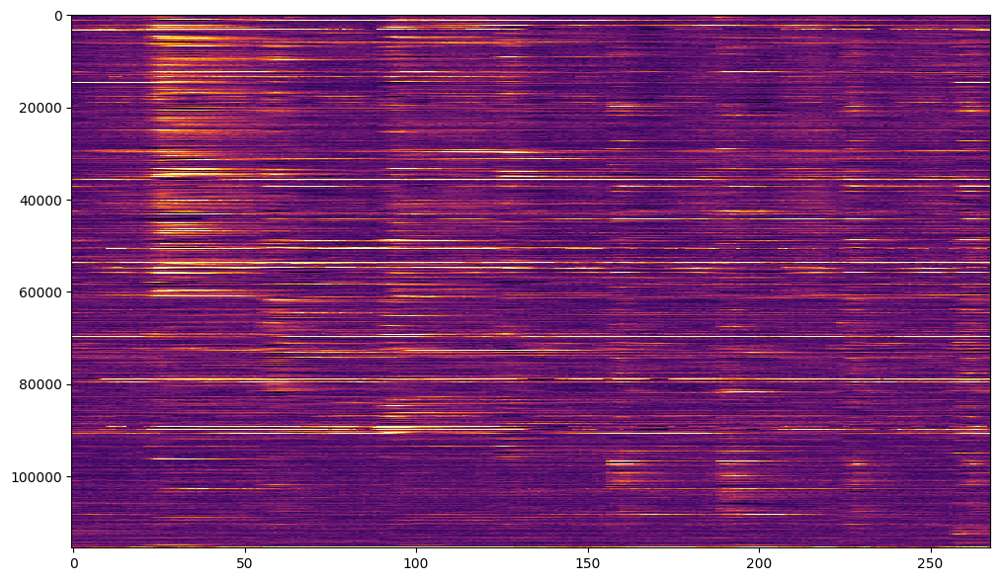

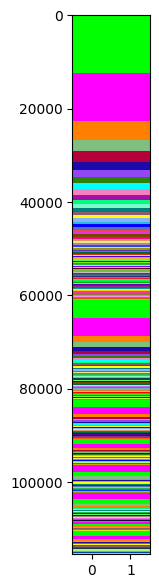

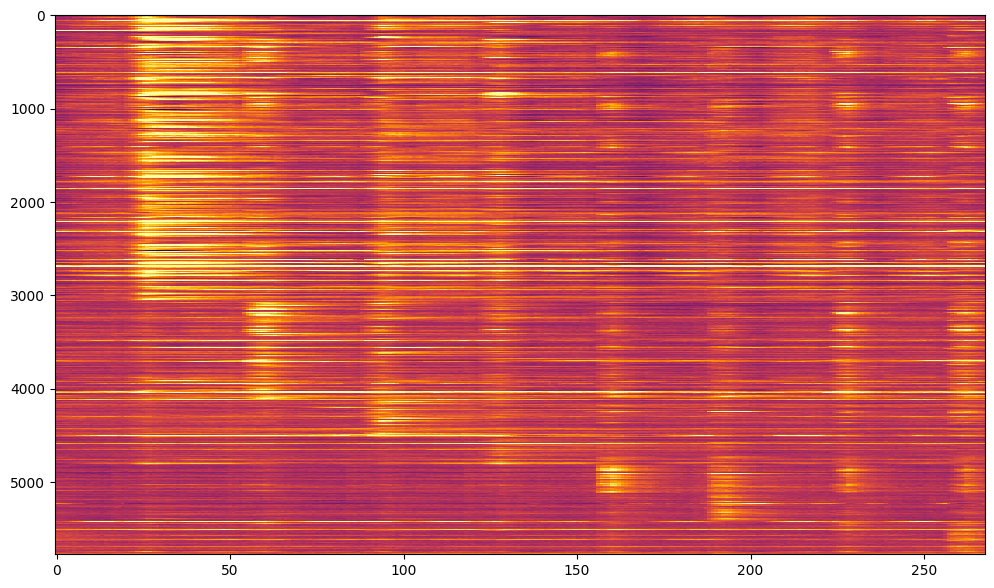

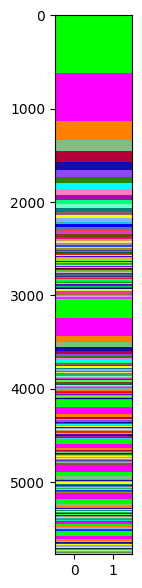

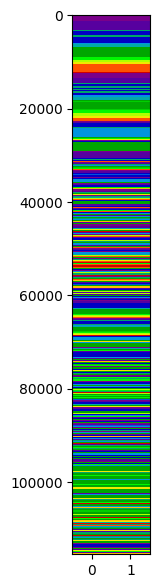

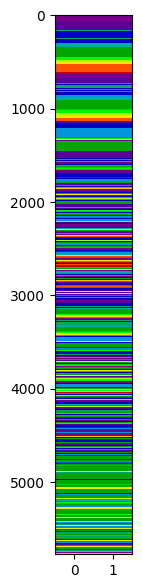

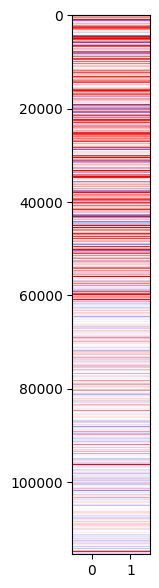

In [16]:
#### All the stimuli togeter

### to limit the number of subtypes
X = 300 #### number of max subtypes


from matplotlib import cm
from matplotlib.colors import ListedColormap
from scipy import stats

####  correlated responses 
thr = perc5mean[5]#*-1
thr2 = perc3mean[5]#*-1
print(thr, thr2)

temp_All_S = np.zeros((1))

for s in range(8):
# for s in [7,6,5,4,3,2,1,0]:
    
    temp_s = np.where(np.absolute(big_corr_regsAllMix[:,s])>thr)[0]
    temp_s2 = np.where(np.absolute(high_corr_perSimMix[:,s])>thr2)[0]
    print(len(temp_s), len(temp_s2))
    temp_s = np.union1d(temp_s,temp_s2)
    print(len(temp_s))

    temp_f = np.where(fish_id==59)[0]

    names = ['all_cells']

    count = 0

    temp_All = np.zeros((1))
    
    for i, cl in enumerate(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]])):

        ds = 1  ### downsample (skipping cells below)

        if cl in glia_subs:  ### skipping glial cells
            continue

            
        temp_cl = np.where(cluster_labelsAll3==cl)[0]
        temp_cl = np.intersect1d(temp_cl,temp_s)   
   
        temp_all = np.zeros((1))
        
        for j,b in enumerate(GoodReg):
        # for j,b in enumerate(GoodReg[0]):  ####
    
            temp_b = np.where(BrainRegions_All[:,b])[0]
            temp = np.intersect1d(temp_cl,temp_b)
#             print(len(temp))
            temp2 = fish_id[temp]

            if len(np.where(temp2==59)[0])>4 and len(np.where(temp2==63)[0])>4 and len(np.where(temp2==71)[0])>4:
                
                if len(np.where(temp2==59)[0])/len(temp2)>0.70 or len(np.where(temp2==63)[0])/len(temp2)>0.70 or len(np.where(temp2==71)[0])/len(temp2)>0.70:
                    # print(x, good_cls_names[i], BrainRegions_names[b])
                    # print(len(np.where(temp2==59)[0])/len(temp2), len(np.where(temp2==63)[0])/len(temp2), len(np.where(temp2==71)[0])/len(temp2))
                    continue

#                 count = count + 1
                temp_all = np.hstack((temp_all,temp))
    
                if len(np.where(temp2==59)[0])/len(temp2)>0.67 or len(np.where(temp2==63)[0])/len(temp2)>0.67 or len(np.where(temp2==71)[0])/len(temp2)>0.67:
                    print(stim[s], good_cls_names[i], BrainRegions_names[b])
                    print(len(np.where(temp2==59)[0])/len(temp2), len(np.where(temp2==63)[0])/len(temp2), len(np.where(temp2==71)[0])/len(temp2))
#                 
                
        temp_all = temp_all[1::]

        temp_All = np.hstack((temp_All,temp_all))

    temp_All = temp_All[1::]

    temp_All = temp_All[::ds]
    
    temp_Sub_cl = cluster_labelsAll3[temp_All.astype(int)]


    ###### finding the X biggest subtypes to only plot those
    temp_subt, temp_stcounts = np.unique(temp_Sub_cl, return_counts=True)

    temp_sort = np.argsort(temp_stcounts)
    temp_sort = temp_sort[::-1]
    print('sorted_counts_',temp_stcounts[temp_sort])

    temp_subt2 = temp_subt[temp_sort][0:X] #### how many max subtypes. 

    temp_All_short = np.zeros((1))

    for i, cl in enumerate(temp_subt2):#enumerate(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]])):
        # if cl in temp_subt2:
        temp_cl = np.where(temp_Sub_cl==cl)[0]
        temp_All_short = np.hstack((temp_All_short,temp_All[temp_cl]))

    temp_All_short = temp_All_short[1::]
    
    temp_Sub_cl_short = cluster_labelsAll3[temp_All_short.astype(int)]

    temp_Sub_cl = temp_Sub_cl_short

    temp_All = temp_All_short

    temp_All_S = np.hstack((temp_All_S,temp_All))

    #######

temp_All = temp_All_S[1::]

### removing duplicates    
_, idx = np.unique(temp_All, return_index=True)
temp_All = temp_All[np.sort(idx)]

temp_All_short = temp_All

temp_Sub_cl = cluster_labelsAll3[temp_All_short.astype(int)]
    
temp_Sub_cl_new = np.zeros((temp_Sub_cl.shape))
for c,cl in enumerate(np.unique(temp_Sub_cl)):
    temp_Sub_cl_new[temp_Sub_cl==cl] = c      

temp_Sub_cl2 = np.vstack((temp_Sub_cl,temp_Sub_cl))

names = ['all_cells']    
names = names + list(itemgetter(*np.unique(temp_Sub_cl)-1)(good_cls_names))   ### the -1 is because there is no subtype 0 but indexing the names starts from 0


cmap = cm.get_cmap('gist_rainbow', len(temp_Sub_cl_new))
cmap_All= ListedColormap(colors_All)


n = len(np.unique(temp_Sub_cl))
colors = plt.cm.gist_rainbow(np.linspace(0,1,n))



plt.figure(figsize=(12,7))
plt.imshow(dff_traceAllavg[temp_All.astype(int),:],vmin=-0.1, vmax=0.6,cmap='inferno',aspect='auto',interpolation='nearest')

# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/StimCorrNeu_fullraster_300dpi.svg',transparent=True, dpi=300)
np.savetxt("/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/StimCorrNeu_fullraster.csv", dff_traceAllavg[temp_All.astype(int),:], delimiter=",")


plt.figure(figsize=(1,7))
plt.imshow(temp_Sub_cl2.T,aspect='auto',cmap=cmap_All,interpolation='nearest',vmin=1,vmax=332)

# #####


nbin = 20 # number of neurons to bin over 
ndiv = (len(temp_All)//nbin) * nbin
# group sorted matrix into rows of length nbin
sn = dff_traceAllavg[temp_All.astype(int),:][:ndiv].reshape(ndiv//nbin, nbin, -1)
# take mean over neurons in a bin
sn = sn.mean(axis=1)

# timepoints to visualize
xmin = 0 
xmax = xmin + 1000

plt.figure(figsize=(12,7))
# plot superneuron activity
plt.imshow(sn[:, xmin:xmax], cmap="inferno", vmin=-0.1, vmax=0.3, aspect="auto",interpolation='nearest')
# ax.set_xlabel("time")
# ax.set_ylabel("superneurons")
# plt.colorbar()

plt.figure(figsize=(1,7))
sn = temp_Sub_cl2.T[:ndiv].reshape(ndiv//nbin, nbin, -1)
# take mean over neurons in a bin
sn = stats.mode(sn, axis = 1)[0] 
plt.imshow(sn,aspect='auto',cmap=cmap_All,interpolation='nearest',vmin=1,vmax=332)

# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/StimCorrNeu_subtyps_300dpi.svg',transparent=True, dpi=300)
np.savetxt("/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/StimCorrNeu_subtyps.csv", sn, delimiter=",")


temp_Bra = Brain_reg[temp_All.astype(int)]

temp_Bra = np.vstack((temp_Bra,temp_Bra))

plt.figure(figsize=(1,7))
plt.imshow(temp_Bra.T,aspect='auto',cmap='nipy_spectral',vmin=0, vmax=17,interpolation='nearest')


plt.figure(figsize=(1,7))
sn = temp_Bra.T[:ndiv].reshape(ndiv//nbin, nbin, -1)
# take mean over neurons in a bin
sn = stats.mode(sn, axis = 1)[0] 
plt.imshow(sn,aspect='auto',cmap='nipy_spectral',vmin=0, vmax=17,interpolation='nearest')

# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/StimCorrNeu_bar_brain_reg_300dpi.svg',transparent=True, dpi=300)
np.savetxt("/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/StimCorrNeu_bar_brain_reg.csv", sn, delimiter=",")

swim_bar = np.vstack((swim_corr_All[temp_All.astype(int)],swim_corr_All[temp_All.astype(int)]))
swim_bar.shape
plt.figure(figsize=(1,7))
plt.imshow(swim_bar.T,aspect='auto',cmap='bwr',interpolation='nearest',vmin=-0.5, vmax=0.5)


# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/StimCorrNeu_bar_swimcorr_300dpi.svg',transparent=True, dpi=300)
np.savetxt("/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/StimCorrNeu_bar_swimcorr.csv", swim_bar, delimiter=",")


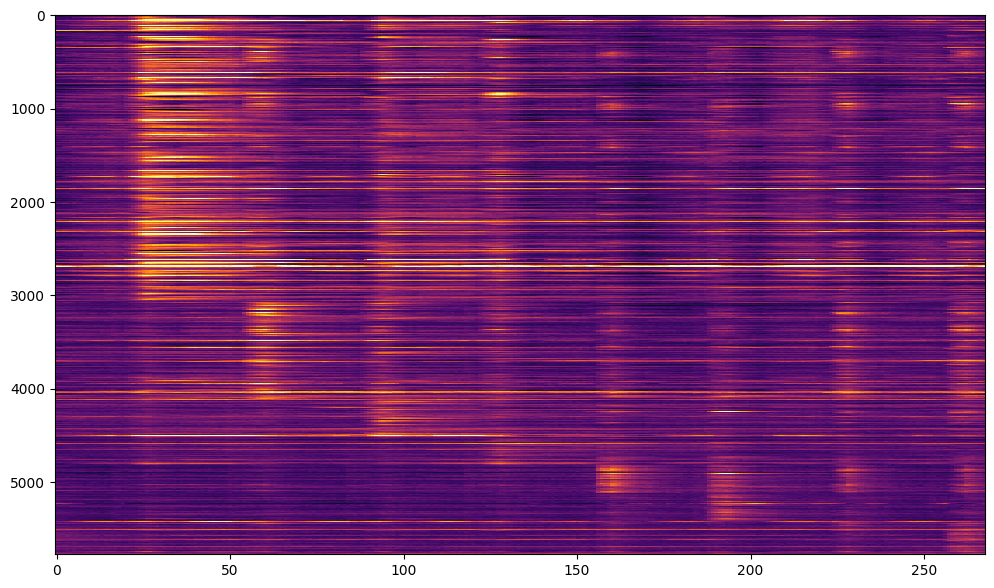

In [17]:

nbin = 20 # number of neurons to bin over 
ndiv = (len(temp_All)//nbin) * nbin
# group sorted matrix into rows of length nbin
sn = dff_traceAllavg[temp_All.astype(int),:][:ndiv].reshape(ndiv//nbin, nbin, -1)
# take mean over neurons in a bin
sn = sn.mean(axis=1)

# timepoints to visualize
xmin = 0 
xmax = xmin + 1000

plt.figure(figsize=(12,7))
# plot superneuron activity
plt.imshow(sn[:, xmin:xmax], cmap="inferno", vmin=0, vmax=0.4, aspect="auto",interpolation='nearest')

# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/StimCorrNeu_raster_300dpi.svg',transparent=True, dpi=300)


0.12937306812442706 0.43417642063345374
87658 60243
104462
69 tac1_chata inferior_medulla_oblongata
0.2033898305084746 0.6949152542372882 0.1016949152542373
24 vglut2a_otpa intermediate_medulla_oblongata
0.12269938650306748 0.1901840490797546 0.6871165644171779
37 vglut2a_cckb intermediate_medulla_oblongata
0.15625 0.15625 0.6875
54 calb1_gad1b superior_medulla_oblongata
0.08333333333333333 0.21666666666666667 0.7
56 irx1b_gad1b superior_medulla_oblongata
0.10185185185185185 0.2037037037037037 0.6944444444444444
29 irx1b periventricular_layer
0.125 0.17857142857142858 0.6964285714285714
97 gad1b_uts1 periventricular_layer
0.14634146341463414 0.17073170731707318 0.6829268292682927
217 irx1b_penkb_gad1b pretectum
0.18421052631578946 0.13157894736842105 0.6842105263157895
27 penkb_gad1b dorsal_thalamus_proper
0.20270270270270271 0.10810810810810811 0.6891891891891891
58 tac1_gad1b hypothalamus
0.1388888888888889 0.16666666666666666 0.6944444444444444
168 tac1_penkb hypothalamus
0.14285714

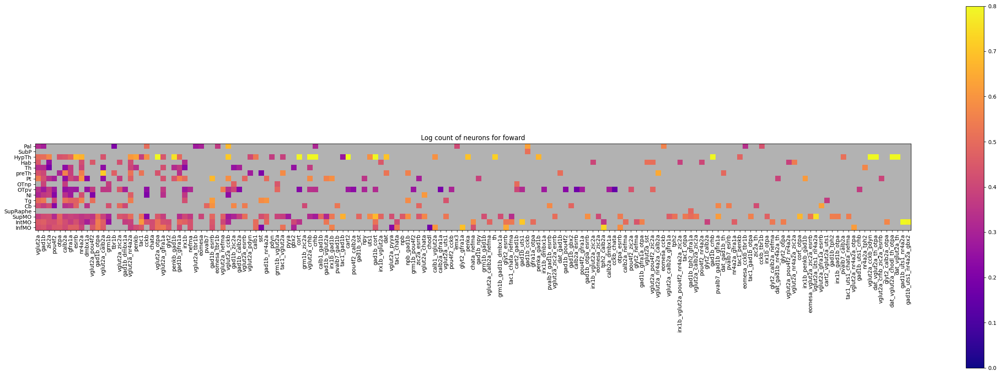

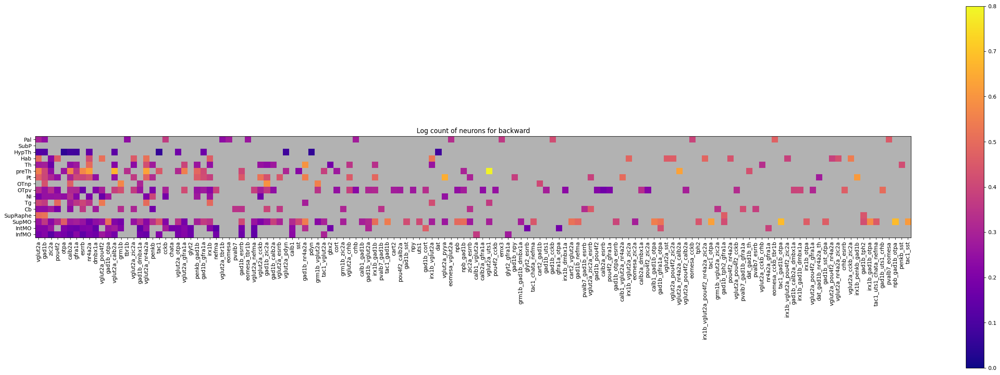

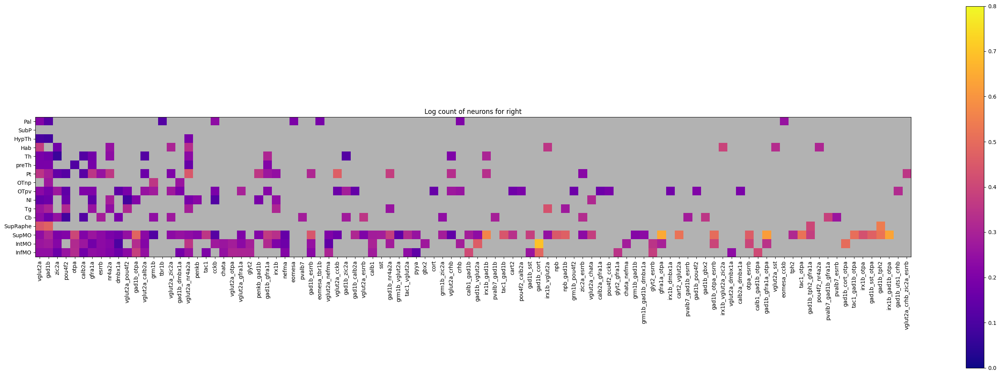

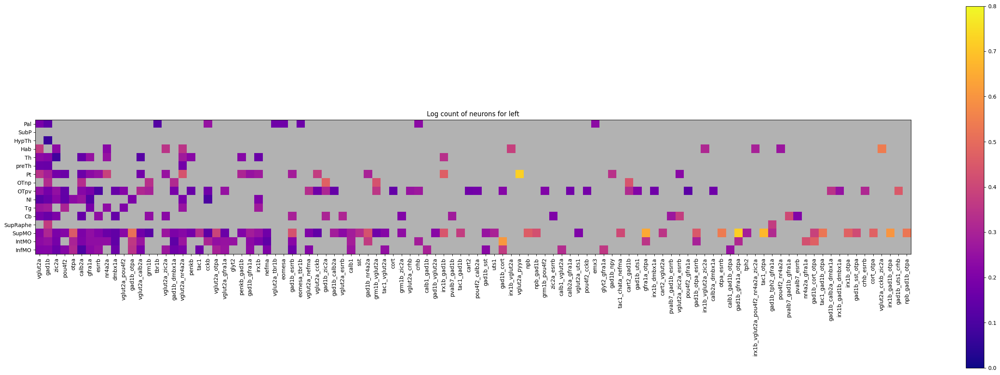

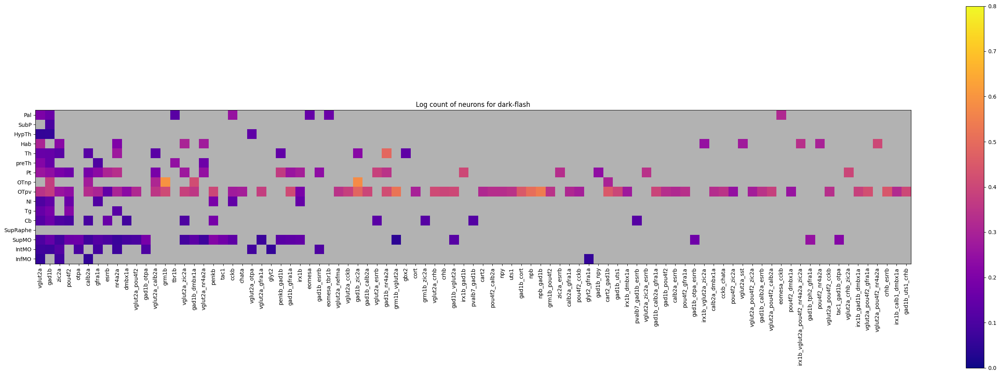

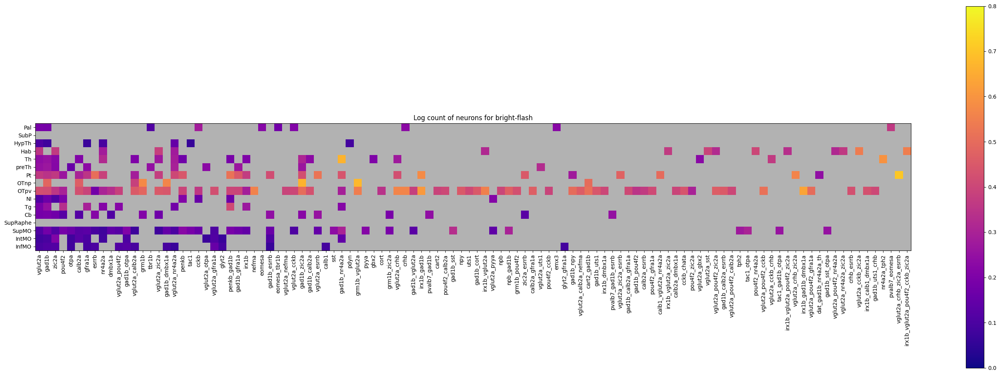

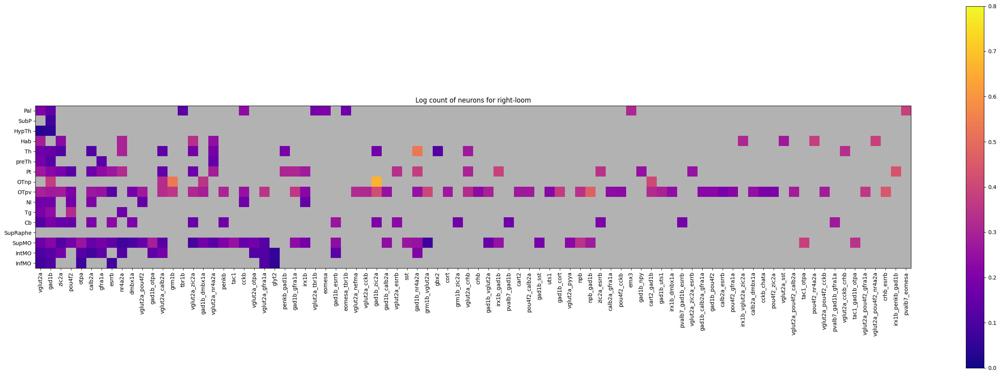

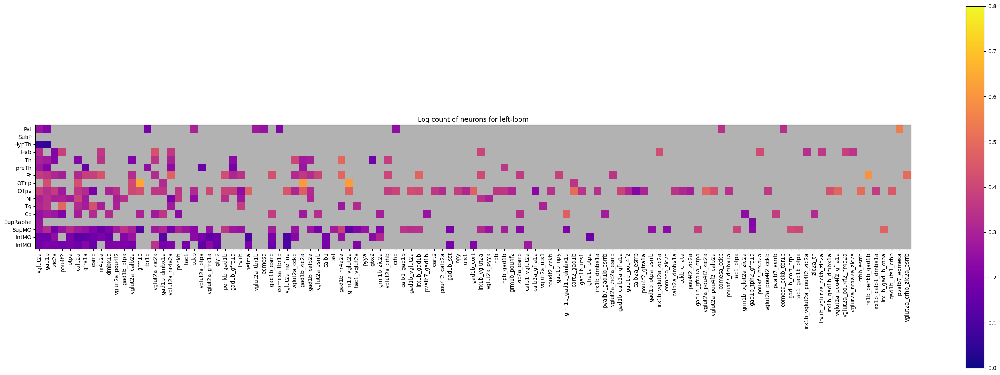

In [15]:
#### which brain regions have more subtypes that respond to the stimuli
#### getting also the average correlation to stimuli (per response window)


Avg_subty_PerBreg_All = np.zeros((len(stim),len(GoodReg),len(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]]))-len(glia_subs)+1))  #### -2 if no vlgut and gad

Avg_subty_PerBreg_All[:] = np.nan

Avg_subty_cnt_PerBreg_All = np.zeros((len(stim),len(GoodReg),len(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]]))-len(glia_subs)+1))  #### -2 if no vlgut and gad

Avg_subty_cnt_PerBreg_All[:] = np.nan

Avg_Corrsubty_PerBreg_All = np.zeros((len(stim),len(GoodReg),len(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]]))-len(glia_subs)+1))  #### -2 if no vlgut and gad

Avg_Corrsubty_PerBreg_All[:] = np.nan

count = 0


thr = perc5mean[5]#*-1
thr2 = perc3mean[5]#*-1
print(thr, thr2)


for s in range(8):
# for s in [0]:
    
    
    Avg_subty_PerBreg = np.zeros((len(GoodReg),len(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]]))-len(glia_subs)+1))
    Avg_subty_PerBreg[:]= np.nan

    Avg_subty_cnt_PerBreg = np.zeros((len(GoodReg),len(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]]))-len(glia_subs)+1))
    Avg_subty_cnt_PerBreg[:]= np.nan

    Avg_Corrsubty_PerBreg = np.zeros((len(GoodReg),len(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]]))-len(glia_subs)+1))
    Avg_Corrsubty_PerBreg[:]= np.nan

    names = ['NumSubtypes']

    
    temp_s = np.where(np.absolute(big_corr_regsAllMix[:,s])>thr)[0]
    temp_s2 = np.where(np.absolute(high_corr_perSimMix[:,s])>thr2)[0]

    print(len(temp_s), len(temp_s2))
    temp_s = np.union1d(temp_s,temp_s2)
    print(len(temp_s))

    for i, cl in enumerate(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]])):
        


        if cl in glia_subs:  ### skipping glial cells
            continue

        names.append(good_cls_names[i])

    for j,b in enumerate(GoodReg):

        names2= ['genes']

        temp_b = np.where(BrainRegions_All[:,b])[0]

        temp_sb = np.intersect1d(temp_s,temp_b)

        subtyps2test = []

        cell_count = np.zeros((len(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]]))-len(glia_subs)+1))
        cell_count[:] = np.nan

        cell_count2 = np.zeros((len(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]]))-len(glia_subs)+1))
        cell_count2[:] = np.nan


        cell_corr = np.zeros((len(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]]))-len(glia_subs)+1))
        cell_corr[:] = np.nan

        count2 = 1
        
        for i, cl in enumerate(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]])):

            # if g_in_cls[i]<2:
            #     continue
    
            if cl in glia_subs:  ### skipping glial cells
                continue
            # if cl == good_cls_names.index('vglut2a')+1  or cl == good_cls_names.index('gad1b')+1:  ### skipping vglut and gad cells
            #     continue
                
            temp_cl = np.where(cluster_labelsAll3==cl)[0]

            temp_clb = np.intersect1d(temp_cl,temp_b)
       
            temp_idx = names.index(good_cls_names[i])
            
            temp_cl = np.intersect1d(temp_cl,temp_s)
            
            temp = np.intersect1d(temp_cl,temp_b)

            temp2 = fish_id[temp]

            # temp3 = fish_id[temp_b] #### if getting the proportion by brain region 
            # temp3 = fish_id[temp_s] #### #### if getting the proportion by stimulus response
            # temp3 = fish_id[temp_sb] #### #### if getting the proportion by stimulus response within brain regions
            temp3 = fish_id[temp_clb] #### if getting the proportion by subtype within brain region 
        
            if len(np.where(temp2==59)[0])>4 and len(np.where(temp2==63)[0])>4 and len(np.where(temp2==71)[0])>4:

                if len(np.where(temp2==59)[0])/len(temp2)>0.70 or len(np.where(temp2==63)[0])/len(temp2)>0.70 or len(np.where(temp2==71)[0])/len(temp2)>0.70:
                    # print(x, good_cls_names[i], BrainRegions_names[b])
                    # print(len(np.where(temp2==59)[0])/len(temp2), len(np.where(temp2==63)[0])/len(temp2), len(np.where(temp2==71)[0])/len(temp2))
                    continue

                # names2.append(good_cls_names[i])
                
                temp_mean = np.mean(np.array([len(np.where(temp2==59)[0]), len(np.where(temp2==63)[0]), len(np.where(temp2==71)[0])]))
                temp_mean2 = np.mean(np.array([len(np.where(temp3==59)[0]), len(np.where(temp3==63)[0]), len(np.where(temp3==71)[0])]))


                # temp_corrmean = np.mean(high_corr_perSimMix[temp,s])
                temp_corrmean = np.mean(np.array([np.mean(high_corr_perSimMix[temp[np.where(temp2==59)[0]],s]), np.mean(high_corr_perSimMix[temp[np.where(temp2==63)[0]],s]), np.mean(high_corr_perSimMix[temp[np.where(temp2==71)[0]],s])]))

                
                if len(np.where(temp2==59)[0])/len(temp2)>0.67 or len(np.where(temp2==63)[0])/len(temp2)>0.67 or len(np.where(temp2==71)[0])/len(temp2)>0.67:
                    print(cl, good_cls_names[i], BrainRegions_names[b])
                    print(len(np.where(temp2==59)[0])/len(temp2), len(np.where(temp2==63)[0])/len(temp2), len(np.where(temp2==71)[0])/len(temp2))
                
                cell_count[temp_idx] = temp_mean/temp_mean2  #### if getting the proportion 

                cell_count2[temp_idx] = temp_mean  #### if getting the avg count 
                
                cell_corr[temp_idx] =  temp_corrmean
            

        Avg_subty_PerBreg[j,:] = cell_count
        Avg_subty_cnt_PerBreg[j,:] = cell_count2
        Avg_Corrsubty_PerBreg[j,:] = cell_corr

    Avg_subty_PerBreg_All[s,:,:] = Avg_subty_PerBreg  
    Avg_subty_cnt_PerBreg_All[s,:,:] = Avg_subty_cnt_PerBreg 
    Avg_Corrsubty_PerBreg_All[s,:,:] = Avg_Corrsubty_PerBreg
            


    #### for  compact version of the above
    temp = np.where(~np.isnan(np.nanmax(Avg_subty_PerBreg,0)))[0]
    temp = temp.astype(int)
    

    plt.figure(figsize=[36,12])
    cmap = plt.cm.plasma
    cmap.set_bad('0.7')  # Set NaN color
    plt.imshow(Avg_subty_PerBreg[::-1,temp], vmin=0, vmax=0.8, cmap=cmap,interpolation='nearest')
    plt.colorbar()
    plt.xticks(range(len(np.array(names)[temp])),np.array(names)[temp], rotation = 90) 
    plt.yticks(range(len(BrainRegions_names_short)),BrainRegions_names_short[::-1]) 
    plt.title("Log count of neurons for "+ stim[s])

    print(Avg_subty_PerBreg[::-1,temp].shape)

print(count)

print(len(names))

print(Avg_subty_PerBreg.shape)

Text(0.5, 1.0, 'Log10 count of neurons for foward')

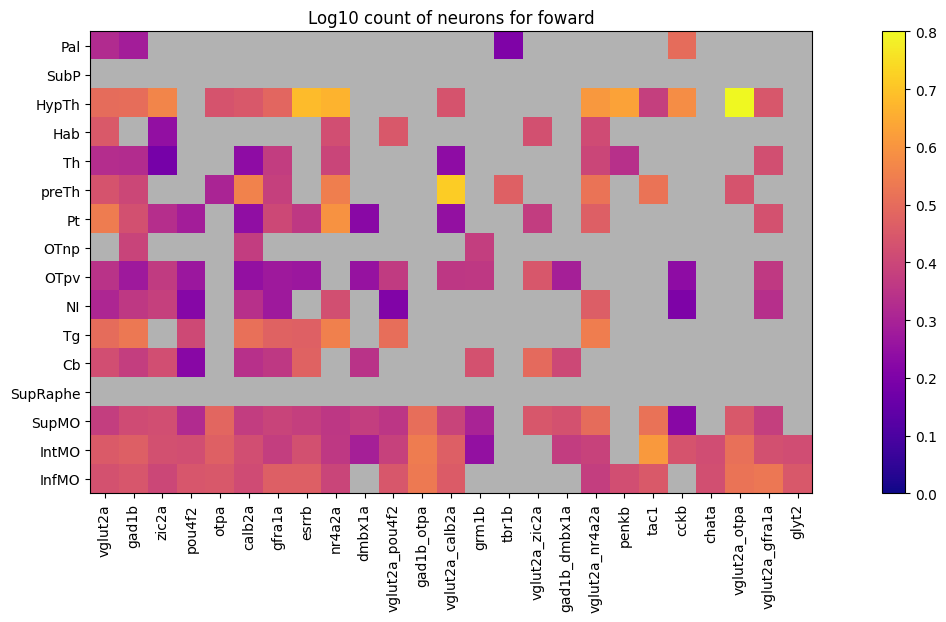

In [16]:
s=0

#### for  compact version
temp = np.where(~np.isnan(np.nanmax(Avg_subty_PerBreg_All[s,:,:],0)))[0]
temp = temp.astype(int)

plt.figure(figsize=[36//2,12//2])
cmap = plt.cm.plasma
cmap.set_bad('0.7')  # Set NaN color 
plt.imshow(Avg_subty_PerBreg_All[s,::-1,temp[0:25]].T, vmin=0, vmax=0.8, cmap=cmap,interpolation='nearest')
plt.colorbar()
plt.xticks(range(len(np.array(names)[temp[0:25]])),np.array(names)[temp[0:25]], rotation = 90) 
plt.yticks(range(len(BrainRegions_names_short)),BrainRegions_names_short[::-1]) 
plt.title("Log10 count of neurons for "+ stim[s])

Text(0.5, 1.0, 'Log10 count of neurons for foward')

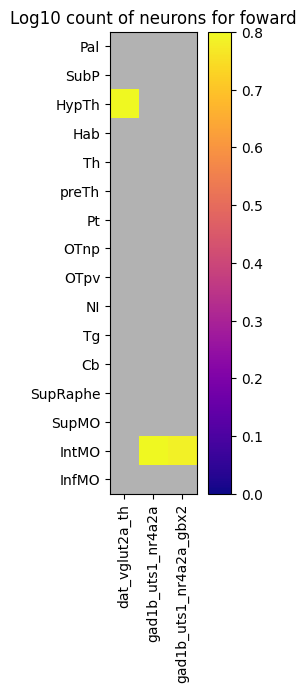

In [17]:
s=0

#### for  compact version
temp = np.where(~np.isnan(np.nanmax(Avg_subty_PerBreg_All[s,:,:],0)))[0]
temp = temp.astype(int)

plt.figure(figsize=[36//12,12//2])
cmap = plt.cm.plasma
cmap.set_bad('0.7')  # Set NaN color 
plt.imshow(Avg_subty_PerBreg_All[s,::-1,temp[-3::]].T, vmin=0, vmax=0.8, cmap=cmap,interpolation='nearest')
plt.colorbar()
plt.xticks(range(len(np.array(names)[temp[-3::]])),np.array(names)[temp[-3::]], rotation = 90) 
plt.yticks(range(len(BrainRegions_names_short)),BrainRegions_names_short[::-1]) 
plt.title("Log10 count of neurons for "+ stim[s])

Text(0.5, 1.0, 'avg correlation for foward')

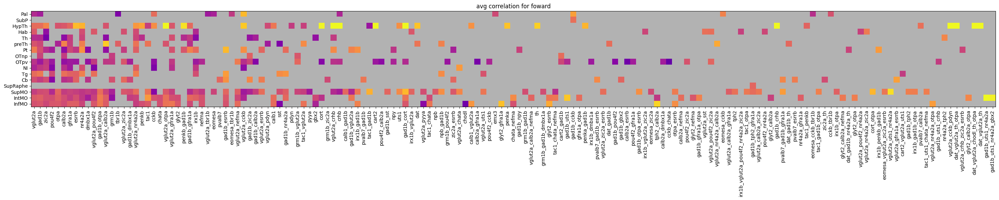

In [18]:
s=0

#### for  compact version 
temp = np.where(~np.isnan(np.nanmax(Avg_subty_PerBreg_All[s,:,:],0)))[0]
temp = temp.astype(int)

plt.figure(figsize=[36//1,12//1])
cmap = plt.cm.plasma
cmap.set_bad('0.7')  # Set NaN color 
plt.imshow(Avg_subty_PerBreg_All[s,::-1,temp].T, vmin=0, vmax=0.8, cmap=cmap,interpolation='nearest')
# plt.colorbar()
plt.xticks(range(len(np.array(names)[temp])),np.array(names)[temp], rotation = 90) 
plt.yticks(range(len(BrainRegions_names_short)),BrainRegions_names_short[::-1]) 
plt.title("avg correlation for "+ stim[s])

(161, 16)


Text(0.5, 1.0, 'avg correlation for foward')

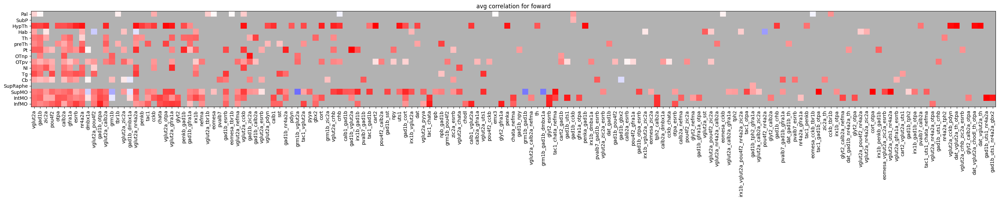

In [19]:
s=0

#### for  compact version
temp = np.where(~np.isnan(np.nanmax(Avg_Corrsubty_PerBreg_All[s,:,:],0)))[0]
temp = temp.astype(int)
print(Avg_Corrsubty_PerBreg_All[s,::-1,temp].shape)
plt.figure(figsize=[36//1,12//1])
cmap = plt.cm.bwr
cmap.set_bad('0.7')  # Set NaN color 
plt.imshow(Avg_Corrsubty_PerBreg_All[s,::-1,temp].T, vmin=-0.5, vmax=0.5, cmap=cmap,interpolation='nearest')
# plt.colorbar()
plt.xticks(range(len(np.array(names)[temp])),np.array(names)[temp], rotation = 90) 
plt.yticks(range(len(BrainRegions_names_short)),BrainRegions_names_short[::-1]) 
plt.title("avg correlation for "+ stim[s])

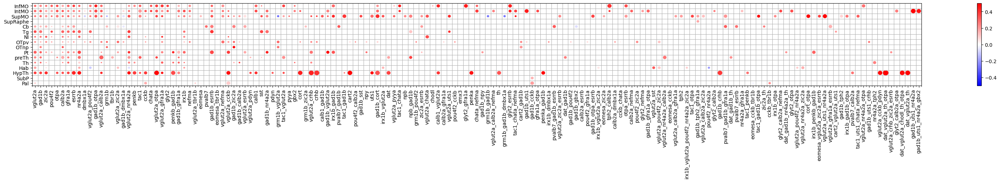

In [24]:
from matplotlib.collections import PatchCollection
from matplotlib.colors import Normalize

temp_mat1 = Avg_subty_PerBreg_All[s,::-1,temp].T
temp_mat1[np.isnan(temp_mat1)] = 0



N = Avg_subty_PerBreg_All[s,::-1,temp].shape[1]
M = Avg_subty_PerBreg_All[s,::-1,temp].shape[0]
xlabels = np.array(names)[temp]
ylabels = BrainRegions_names_short[::-1]


x, y = np.meshgrid(np.arange(M), np.arange(N))

c = Avg_Corrsubty_PerBreg_All[s,::-1,temp].T


fig, ax = plt.subplots(figsize=(40//1,3.9//1))

R = temp_mat1/temp_mat1.max()/2
circles = [plt.Circle((j,i), radius=r) for r, j, i in zip(R.flat, x.flat, y.flat)]

# Create a Normalize object for the colormap
norm = Normalize(vmin=-0.5, vmax=0.5)

col = PatchCollection(circles, array=c.flatten(), cmap="bwr", norm=norm)
ax.add_collection(col)

ax.set(xticks=np.arange(M), yticks=np.arange(N),
       xticklabels=xlabels, yticklabels=ylabels)

# Rotate x-tick labels by 90 degrees
plt.xticks(rotation=90)

ax.set_xticks(np.arange(M+1)-0.5, minor=True)
ax.set_yticks(np.arange(N+1)-0.5, minor=True)

ax.grid(which='minor')
fig.colorbar(col)


plt.show()

Text(0.5, 1.0, 'avg correlation for dark-flash')

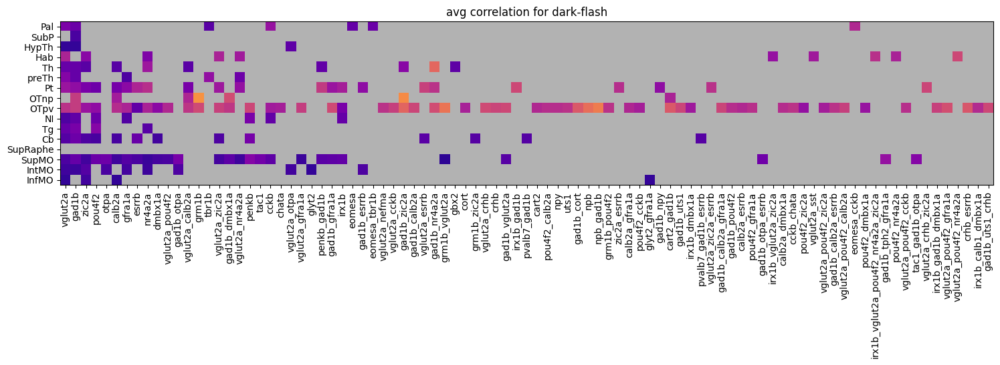

In [28]:
s=4

#### for  compact version 
temp = np.where(~np.isnan(np.nanmax(Avg_Corrsubty_PerBreg_All[s,:,:],0)))[0]
temp = temp.astype(int)

plt.figure(figsize=[36//2,12//2])
cmap = plt.cm.plasma
cmap.set_bad('0.7')  # Set NaN color
plt.imshow(Avg_subty_PerBreg_All[s,::-1,temp].T,vmin=0, vmax=0.8, cmap=cmap,interpolation='nearest')
# plt.colorbar()
plt.xticks(range(len(np.array(names)[temp])),np.array(names)[temp], rotation = 90) 
plt.yticks(range(len(BrainRegions_names_short)),BrainRegions_names_short[::-1]) 
plt.title("avg correlation for "+ stim[s])

Text(0.5, 1.0, 'avg correlation for dark-flash')

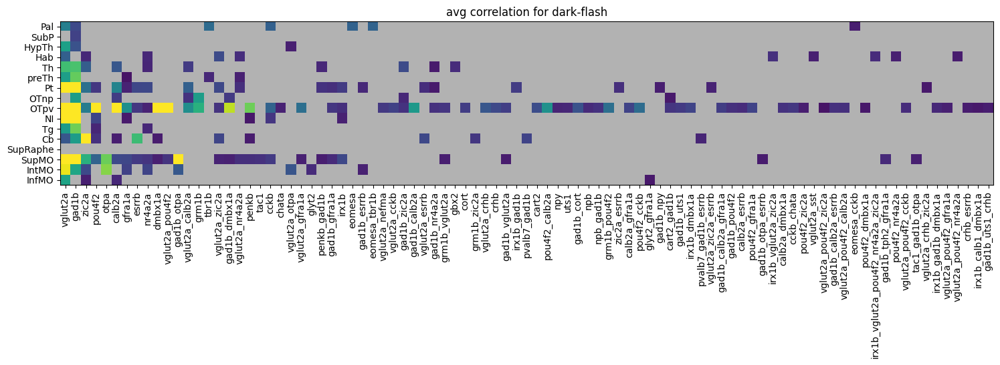

In [29]:
s=4

#### for  compact version
temp = np.where(~np.isnan(np.nanmax(Avg_Corrsubty_PerBreg_All[s,:,:],0)))[0]
temp = temp.astype(int)

plt.figure(figsize=[36//2,12//2])
cmap = plt.cm.viridis
cmap.set_bad('0.7')  # Set NaN color
plt.imshow(Avg_subty_cnt_PerBreg_All[s,::-1,temp].T,vmin=0, vmax=100, cmap=cmap,interpolation='nearest')
# plt.colorbar()
plt.xticks(range(len(np.array(names)[temp])),np.array(names)[temp], rotation = 90) 
plt.yticks(range(len(BrainRegions_names_short)),BrainRegions_names_short[::-1]) 
plt.title("avg correlation for "+ stim[s])

Text(0.5, 1.0, 'avg correlation for dark-flash')

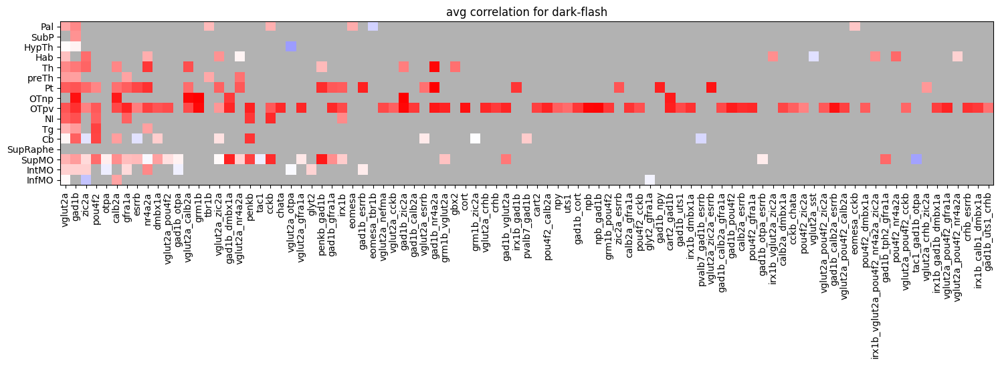

In [30]:
s=4

#### for  compact version
temp = np.where(~np.isnan(np.nanmax(Avg_Corrsubty_PerBreg_All[s,:,:],0)))[0]
temp = temp.astype(int)

plt.figure(figsize=[36//2,12//2])
cmap = plt.cm.bwr
cmap.set_bad('0.7')  # Set NaN color 
plt.imshow(Avg_Corrsubty_PerBreg_All[s,::-1,temp].T, vmin=-0.5, vmax=0.5, cmap=cmap,interpolation='nearest')
# plt.colorbar()
plt.xticks(range(len(np.array(names)[temp])),np.array(names)[temp], rotation = 90) 
plt.yticks(range(len(BrainRegions_names_short)),BrainRegions_names_short[::-1]) 
plt.title("avg correlation for "+ stim[s])

Text(0.5, 1.0, 'avg correlation for foward')

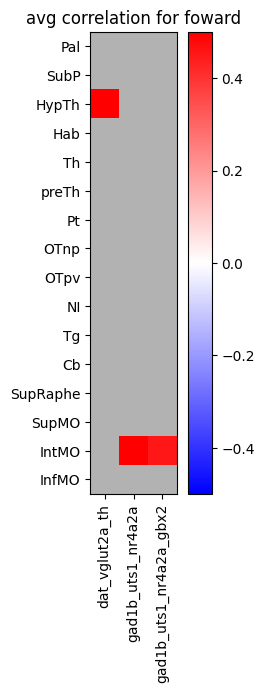

In [32]:
s=0

#### for  compact version of the above
temp = np.where(~np.isnan(np.nanmax(Avg_Corrsubty_PerBreg_All[s,:,:],0)))[0]
temp = temp.astype(int)

plt.figure(figsize=[36//12,12//2])
cmap = plt.cm.bwr
cmap.set_bad('0.7')  # Set NaN color 
plt.imshow(Avg_Corrsubty_PerBreg_All[s,::-1,temp[-3::]].T, vmin=-0.5, vmax=0.5, cmap=cmap,interpolation='nearest')
plt.colorbar()
plt.xticks(range(len(np.array(names)[temp[-3::]])),np.array(names)[temp[-3::]], rotation = 90) 
plt.yticks(range(len(BrainRegions_names_short)),BrainRegions_names_short[::-1]) 
plt.title("avg correlation for "+ stim[s])

In [20]:

#### getting the names and the cell IDs of all the subtypes

dict_subty_list = []                # a list of dictionaries
code_subty_list = [] 

thr = perc5mean[5]
thr2 = perc3mean[5]
print(thr, thr2)


for s in range(8):
# for s in [0]:

    dict_subty = {}                # dictionary to hold lists of cells
    code_subty = []

    
    names = ['NumSubtypes']

    
    temp_s = np.where(np.absolute(big_corr_regsAllMix[:,s])>thr)[0]
    temp_s2 = np.where(np.absolute(high_corr_perSimMix[:,s])>thr2)[0]

    print(len(temp_s), len(temp_s2))
    temp_s = np.union1d(temp_s,temp_s2)
    print(len(temp_s))

    for i, cl in enumerate(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]])):

        if cl in glia_subs:  ### skipping glial cells
            continue

        names.append(good_cls_names[i])

    for j,b in enumerate(GoodReg):

        temp_b = np.where(BrainRegions_All[:,b])[0]

        temp_sb = np.intersect1d(temp_s,temp_b)
        
        for i, cl in enumerate(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]])):

            if cl in glia_subs:  ### skipping glial cells
                continue
              
            temp_cl = np.where(cluster_labelsAll3==cl)[0]

            temp_clb = np.intersect1d(temp_cl,temp_b)
       
            temp_idx = names.index(good_cls_names[i])
            
            temp_cl = np.intersect1d(temp_cl,temp_s)
            
            temp = np.intersect1d(temp_cl,temp_b)

            temp2 = fish_id[temp]
        
            if len(np.where(temp2==59)[0])>4 and len(np.where(temp2==63)[0])>4 and len(np.where(temp2==71)[0])>4:

                if len(np.where(temp2==59)[0])/len(temp2)>0.70 or len(np.where(temp2==63)[0])/len(temp2)>0.70 or len(np.where(temp2==71)[0])/len(temp2)>0.70:
                    continue
                dict_subty[f"stim_{stim[s]}_{BrainRegions_names_short[j]}_{good_cls_names[cl-1]}"] = temp

                code_subty.append(f"sp_{b}_{cl}")

    
    print('# of subpopulations for ',stim[s],len(dict_subty))

    dict_subty_list.append(dict_subty)

    code_subty_list.append(code_subty)
                



0.12937306812442706 0.43417642063345374
87658 60243
104462
# of subpopulations for  foward 406
50641 46010
71255
# of subpopulations for  backward 364
33118 44051
58199
# of subpopulations for  right 271
33888 39373
56088
# of subpopulations for  left 260
26654 26985
41651
# of subpopulations for  dark-flash 190
39425 31377
55345
# of subpopulations for  bright-flash 263
23814 35725
44756
# of subpopulations for  right-loom 201
44553 45112
67320
# of subpopulations for  left-loom 301


In [24]:
len(code_subty)
# code_subty

301

In [43]:
####### to make a single dictionary and save it as .csv
####### and also a .csv file for each stimulus
import csv
    

#### getting the names and the cell IDs of all the subtypes

dict_subty_list2 = []                # a list of dictionaries

thr = perc5mean[5]
thr2 = perc3mean[5]
print(thr, thr2)

# Define the field names (headers)
fieldnames = ["Number", "Stimulus", "Subtype", "Brain Region", "CellIDs"]

counter = 0

for s in range(8):
# for s in [0]:    

    dict_subty_list3 = []                # a list of dictionaries for each stimulus

    
    names = ['NumSubtypes']

    
    temp_s = np.where(np.absolute(big_corr_regsAllMix[:,s])>thr)[0]
    temp_s2 = np.where(np.absolute(high_corr_perSimMix[:,s])>thr2)[0]

    print(len(temp_s), len(temp_s2))
    temp_s = np.union1d(temp_s,temp_s2)
    print(len(temp_s))

    for i, cl in enumerate(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]])):

        if cl in glia_subs:  ### skipping glial cells
            continue

        names.append(good_cls_names[i])

    for j,b in enumerate(GoodReg):

        temp_b = np.where(BrainRegions_All[:,b])[0]

        temp_sb = np.intersect1d(temp_s,temp_b)
        
        for i, cl in enumerate(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]])):

            if cl in glia_subs:  ### skipping glial cells
                continue
              
            temp_cl = np.where(cluster_labelsAll3==cl)[0]

            temp_clb = np.intersect1d(temp_cl,temp_b)
       
            temp_idx = names.index(good_cls_names[i])
            
            temp_cl = np.intersect1d(temp_cl,temp_s)
            
            temp = np.intersect1d(temp_cl,temp_b)

            temp2 = fish_id[temp]
        
            if len(np.where(temp2==59)[0])>4 and len(np.where(temp2==63)[0])>4 and len(np.where(temp2==71)[0])>4:

                if len(np.where(temp2==59)[0])/len(temp2)>0.70 or len(np.where(temp2==63)[0])/len(temp2)>0.70 or len(np.where(temp2==71)[0])/len(temp2)>0.70:
                    continue
                # dict_subty[f"stim_{stim[s]}_{BrainRegions_names_short[j]}_{good_cls_names[cl-1]}"] = temp
                counter = counter + 1

                temp = temp.astype(str).tolist()
                
                dict_subty = {"Number": counter, "Stimulus": stim[s], "Subtype": good_cls_names[cl-1], "Brain Region": BrainRegions_names_short[j], "CellIDs": temp}
                # Convert nested values to a string
                dict_subty["CellIDs"] = ', '.join(dict_subty["CellIDs"])

                dict_subty_list2.append(dict_subty)

                dict_subty_list3.append(dict_subty)


    
    print('# of subpopulations for ',stim[s],len(dict_subty_list3)) 
    
    # CSV file name
    csv_filename = f"/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/subty_lists_{stim[s]}.csv"
    
    # Writing to CSV
    with open(csv_filename, mode='w', newline='') as file:
        writer = csv.DictWriter(file, fieldnames=fieldnames)
        writer.writeheader()  # Write header row
        writer.writerows(dict_subty_list3)  # Write data rows

                



0.12937306812442706 0.43417642063345374
87658 60243
104462
# of subpopulations for  foward 406
50641 46010
71255
# of subpopulations for  backward 364
33118 44051
58199
# of subpopulations for  right 271
33888 39373
56088
# of subpopulations for  left 260
26654 26985
41651
# of subpopulations for  dark-flash 190
39425 31377
55345
# of subpopulations for  bright-flash 263
23814 35725
44756
# of subpopulations for  right-loom 201
44553 45112
67320
# of subpopulations for  left-loom 301


In [39]:
# dict_subty_list2

In [40]:
####### to make a single dictionary and save it as .csv
import csv


# CSV file name
csv_filename = "/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/subty_lists.csv"

# Writing to CSV
with open(csv_filename, mode='w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=fieldnames)
    writer.writeheader()  # Write header row
    writer.writerows(dict_subty_list2)  # Write data rows

In [34]:
#### finding which subpopulations are unique (not taking into account response to stimuli)
unique = set().union(*code_subty_list)      # set of unique elements across all 8 lists
unique_list = list(unique)        # if you need a list
print(len(unique_list))

508


In [85]:
from collections import defaultdict

def evaluate_uniqueness_global_keys(data, require_min=15, strict_equal=False):
    """
    Returns: (result_dict, count_unique)
    result_dict: mapping key -> bool (True = unique & meets min size)
    count_unique: number of keys with True
    
strict_equal controls what "non-unique" means:
If strict_equal = True:
A key is marked non-unique when any other key has an identical set of cell IDs (exact match).
Subsets that are not identical do NOT mark it non-unique.
If strict_equal = False:
A key is marked non-unique when its set of cell IDs is a subset (or equal) of any other key's set.
That means exact duplicates and smaller sets contained inside larger sets both count as non-unique.
Examples:
A = {1..15}, B = {1..15}, C = {1..20}
strict_equal = True => A non-unique (duplicate with B), B non-unique, C unique.
strict_equal = False => A non-unique (subset of C and equal to B), B non-unique, C unique.
A = {1..10}, B = {1..20}
strict_equal = True => A unique (not exactly equal), B unique (assuming size>=min).
strict_equal = False => A non-unique (subset of B), B unique.
    
    """
    key_to_set = {}
    for item in data:
        for k, vals in item.items():
            key_to_set[k] = set(vals) if vals is not None else set()

    keys = list(key_to_set.keys())
    sets = [key_to_set[k] for k in keys]
    sizes = [len(s) for s in sets]

    froz_map = defaultdict(list)
    for k, s in key_to_set.items():
        froz_map[frozenset(s)].append(k)

    result = {}
    for idx, k in enumerate(keys):
        s = sets[idx]
        if sizes[idx] < require_min:
            result[k] = False
            continue

        non_unique = False
        if strict_equal:
            if len(froz_map[frozenset(s)]) > 1:
                non_unique = True
        else:
            for j, t in enumerate(sets):
                if j == idx:
                    continue
                if s.issubset(t):
                    non_unique = True
                    break

        result[k] = not non_unique

    count_unique = sum(1 for v in result.values() if v)
    return result, count_unique

# Example:
data = [
    {"A": list(range(1,16)), "B": [1,2,3]},
    {"C": list(range(16,31)), "D": list(range(1,6))},
    {"E": list(range(1,16))},
]

res, count = evaluate_uniqueness_global_keys(data, require_min=15, strict_equal=False)
print(res)
print("unique count:", count)

{'A': False, 'B': False, 'C': True, 'D': False, 'E': False}
unique count: 1


In [86]:
res, count = evaluate_uniqueness_global_keys(dict_subty_list, require_min=15, strict_equal=False)
# print(res)
print("unique count:", count)

unique count: 2147


In [95]:
data = [
    {"A": list(range(1,16)), "B": [1,2,3]},
    {"C": list(range(16,31)), "D": list(range(1,6))},
    {"E": list(range(1,16))},
    {"F": [1,2,3,4,5,11,12,13,14,15,21,22,23,24,25],}
]

res, count = evaluate_uniqueness_global_keys(data, require_min=15, strict_equal=False)
print(res)
print("unique count:", count)

{'A': False, 'B': False, 'C': True, 'D': False, 'E': False, 'F': True}
unique count: 2


In [89]:
#### another function that is more complete and strict

def evaluate_uniqueness_global_keys_2(
    data,
    require_min=15,
    strict_equal=False,
    subset_mode=False,
    covered_by_others=True
):
    """
    data: list of dicts with globally unique keys
    require_min: minimum unique cells required
    strict_equal: if True, identical sets are non-unique
    subset_mode: if True, a set subset/equal of any single other set is non-unique
    covered_by_others: if True, a set whose elements are all found across the union of other sets is non-unique

    Returns: (result_dict, count_unique)
    result_dict: mapping key -> bool (True = unique & meets min size)
    """
    # build key -> set
    key_to_set = {}
    for item in data:
        for k, vals in item.items():
            key_to_set[k] = set(vals) if vals is not None else set()

    keys = list(key_to_set.keys())
    sets = [key_to_set[k] for k in keys]
    sizes = [len(s) for s in sets]

    # frozenset map for identical checks
    froz_map = defaultdict(list)
    for k, s in key_to_set.items():
        froz_map[frozenset(s)].append(k)

    # precompute union of all sets for covered-by-others checks
    total_union = set().union(*sets) if sets else set()

    result = {}
    for idx, k in enumerate(keys):
        s = sets[idx]
        if sizes[idx] < require_min:
            result[k] = False
            continue

        non_unique = False

        # identical
        if strict_equal and len(froz_map[frozenset(s)]) > 1:
            non_unique = True

        # subset of any single other set
        if not non_unique and subset_mode:
            for j, t in enumerate(sets):
                if j == idx:
                    continue
                if s.issubset(t):
                    non_unique = True
                    break

        # covered by union of all other sets (elements all appear somewhere else)
        if not non_unique and covered_by_others:
            # union of others = total_union - elements unique to this set that don't appear elsewhere
            # faster: check s <= union_of_others
            # build union_of_others by removing s then unioning remaining sets:
            union_others = total_union.copy()
            # remove elements that only appear in s: but easier to compute union of others directly:
            union_others = set().union(*(sets[j] for j in range(len(sets)) if j != idx))
            if s.issubset(union_others):
                non_unique = True

        result[k] = not non_unique

    count_unique = sum(1 for v in result.values() if v)
    return result, count_unique

In [96]:
data = [
    {"A": list(range(1,16)), "B": [1,2,3]},
    {"C": list(range(16,31)), "D": list(range(1,6))},
    {"E": list(range(1,16))},
    {"F": [1,2,3,4,5,11,12,13,14,15,21,22,23,24,25],}
]

res, count = evaluate_uniqueness_global_keys_2(data, require_min=15, strict_equal=False)
print(res)
print("unique count:", count)

{'A': False, 'B': False, 'C': True, 'D': False, 'E': False, 'F': False}
unique count: 1


In [97]:
res, count = evaluate_uniqueness_global_keys_2(dict_subty_list, require_min=15, strict_equal=False)
# print(res)
print("unique count:", count)

unique count: 2032


In [21]:
dict_subty_list[2]

{'stim_right_InfMO_vglut2a': array([ 11417,  32497,  34770,  34786,  34790,  35922,  35931,  35937,
         35947,  36643,  37084,  37086,  37482,  37528,  37785,  37895,
         37899,  37938,  37945,  37970,  37973,  37980,  37988,  37993,
         37994,  37995,  38001,  38016,  38081,  38091,  38161,  38206,
         38232,  38259,  38312,  67304,  67381,  67475,  67663,  67813,
         67825,  67849,  67964,  68034,  68035,  68104,  68112,  68169,
         68221,  68347,  68390,  68431,  68432,  68465,  68468,  68474,
         68477,  68482,  68492,  68507,  68535,  68560,  68562,  68567,
         68587,  68648,  68674,  68685,  68688,  68743,  68956,  69029,
         69067,  69093,  69150,  69166,  69283,  69287,  69288,  69300,
         69302,  69390,  69613,  69624,  69631,  69652,  69774,  69801,
         69826,  69831,  69852,  69862,  69873,  69917,  69922,  69954,
         70082,  70121,  70132,  70155,  70285,  70396,  70412,  70418,
         70431,  70504,  70818,  708

(8, 16, 329)
(191,)


Text(0.5, 1.0, '% of neurons')

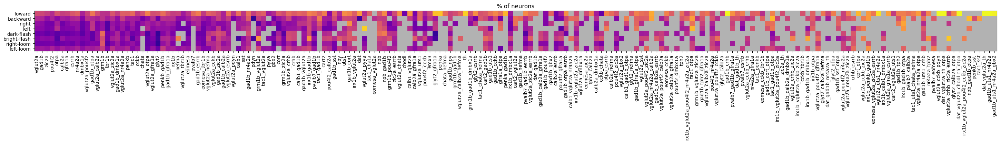

In [35]:
###### making a stimulus (8) by subtypes (max 332) matrix to map the subtypes that are involved in each stimulus presentation

print(Avg_subty_PerBreg_All.shape)

Avg_subty_PerStim = np.nansum(Avg_subty_PerBreg_All,1)   #### this makes all the NaNs become 0s

#### for  compact version 
temp = np.where(np.nanmax(Avg_subty_PerStim,0))[0]
temp = temp.astype(int)


#### this is to get the values. because the above np.nansum and np.nanmean behave different with NaNs
Avg_subty_PerStim = np.nanmean(Avg_subty_PerBreg_All,1)

print(temp.shape)

plt.figure(figsize=[36//1,12//1])
cmap = plt.cm.plasma
cmap.set_bad('0.7')  # Set NaN color 
plt.imshow(Avg_subty_PerStim[:,temp], vmin=0, vmax=0.8, cmap=cmap,interpolation='nearest')
# plt.colorbar()
plt.xticks(range(len(np.array(names)[temp])),np.array(names)[temp], rotation = 90) 
plt.yticks(range(len(stim)),stim) 
plt.title("% of neurons")

(8, 16, 329)
(191,)


Text(0.5, 1.0, 'Log count of neurons')

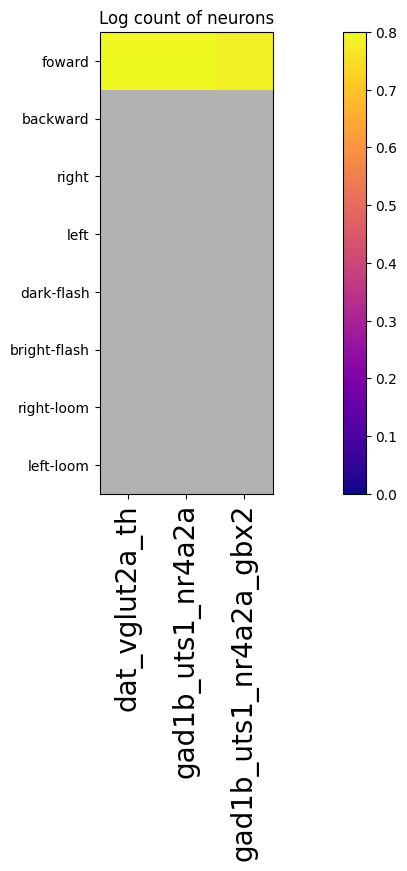

In [36]:
###### making a stimulus (8) by subtypes (max 332) matrix to map the subtypes that are involved in each stimulus presentation

print(Avg_subty_PerBreg_All.shape)

Avg_subty_PerStim = np.nansum(Avg_subty_PerBreg_All,1)   #### this makes all the NaNs become 0s

#### for  compact version of the above
temp = np.where(np.nanmax(Avg_subty_PerStim,0))[0]
temp = temp.astype(int)

#### this is to get the values. because the above np.nansum and np.nanmean behave different with NaNs
Avg_subty_PerStim = np.nanmean(Avg_subty_PerBreg_All,1) 


print(temp.shape)

plt.figure(figsize=[36//2,12//2])
cmap = plt.cm.plasma
cmap.set_bad('0.7')  # Set NaN color 
plt.imshow(Avg_subty_PerStim[:,temp[-3::]], vmin=0, vmax=0.8, cmap=cmap,interpolation='nearest')
plt.colorbar()
plt.xticks(range(len(np.array(names)[temp[-3::]])),np.array(names)[temp[-3::]], rotation = 90, fontsize=20) 
plt.yticks(range(len(stim)),stim) 
plt.title("Log count of neurons")

In [37]:
Avg_subty_PerBreg_All_noNaN = np.zeros((Avg_subty_PerBreg_All.shape))

Avg_subty_PerBreg_All_noNaN[~np.isnan(Avg_subty_PerBreg_All)] = Avg_subty_PerBreg_All[~np.isnan(Avg_subty_PerBreg_All)]


(8, 16, 329)
(191,)


Text(0.5, 1.0, 'count of subtypes')

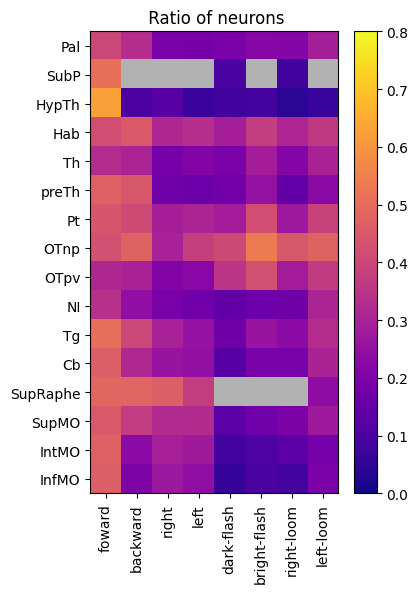

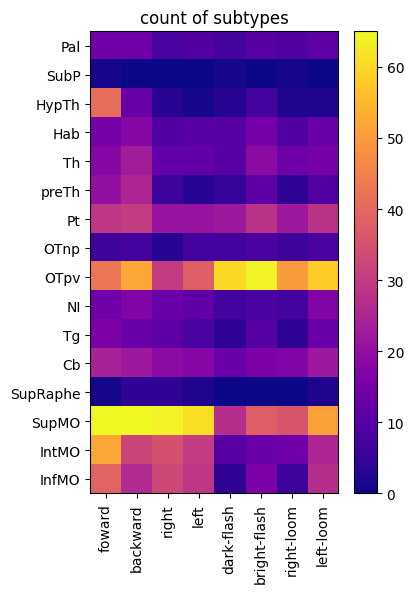

In [38]:
###### making a brain region (16) by stimuli (8) matrix to map the subtypes that are involved in each stimulus presentation

print(Avg_subty_PerBreg_All.shape)

#### if just counting how many subtypes
temp_mat = np.zeros((Avg_subty_PerBreg_All_noNaN.shape))
temp_mat[np.where(Avg_subty_PerBreg_All_noNaN>0)] = 1

temp_mat = np.sum(temp_mat,2)


Avg_subty_PerStim = np.nanmean(Avg_subty_PerBreg_All,2)

# #### this is to get the values. because the above np.nansum and np.nanmean behave different with NaNs
# Avg_subty_PerStim = np.nanmean(Avg_subty_PerBreg_All_noNaN,2)

print(temp.shape)

plt.figure(figsize=[18//4,6//1])
cmap = plt.cm.plasma
cmap.set_bad('0.7')  # Set NaN color 
plt.imshow(Avg_subty_PerStim[:,::-1].T, vmin=0, vmax=0.8, cmap=cmap,interpolation='nearest',aspect = 'auto')
plt.colorbar()
plt.yticks(range(len(np.array(BrainRegions_names_short[::-1]))),np.array(BrainRegions_names_short[::-1])) 
plt.xticks(range(len(stim)),stim, rotation = 90) 
plt.title(" Ratio of neurons")

plt.figure(figsize=[18//4,6//1])
cmap = plt.cm.plasma
cmap.set_bad('0.7')  # Set NaN color 
plt.imshow(temp_mat[:,::-1].T, vmin=0, vmax=65, cmap=cmap,interpolation='nearest',aspect = 'auto')
plt.colorbar()
plt.yticks(range(len(np.array(BrainRegions_names_short[::-1]))),np.array(BrainRegions_names_short[::-1])) 
plt.xticks(range(len(stim)),stim, rotation = 90) 
plt.title("count of subtypes")


(8, 16, 329)
(191,)


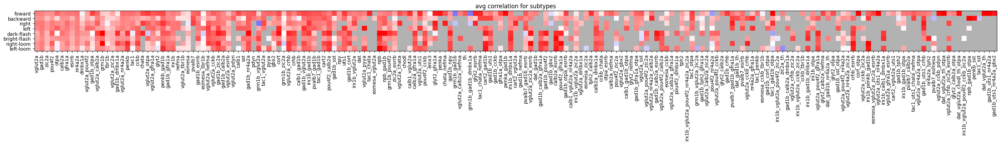

In [39]:
###### making a stimulus (8) by subtypes (max 332) matrix to map the subtypes that are involved in each stimulus presentation

print(Avg_Corrsubty_PerBreg_All.shape)

Avg_Corrsubty_PerStim = np.nanmean(Avg_Corrsubty_PerBreg_All,1)   #### 

#### for  compact version 
temp = np.where(~np.isnan(np.nanmean(Avg_Corrsubty_PerStim,0)))[0]
temp = temp.astype(int)


print(temp.shape)

plt.figure(figsize=[36//1,12//1])
cmap = plt.cm.bwr
cmap.set_bad('0.7')  # Set NaN color 
plt.imshow(Avg_Corrsubty_PerStim[:,temp], vmin=-0.5, vmax=0.5, cmap=cmap,interpolation='nearest')
# plt.colorbar()
plt.xticks([])
plt.xticks(range(len(np.array(names)[temp])),np.array(names)[temp], rotation = 90) 
plt.yticks(range(len(stim)),stim) 
plt.title("avg correlation for subtypes")



# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/StimVSsuptyps_mat_300dpi.svg',transparent=True, dpi=300)

np.savetxt("/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/StimVSsuptyps_mat.csv", Avg_Corrsubty_PerStim[:,temp], delimiter=",")


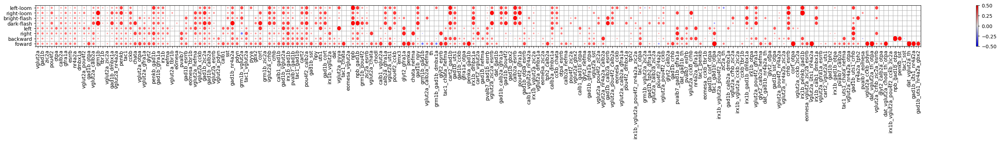

In [63]:
from matplotlib.collections import PatchCollection
from matplotlib.colors import Normalize

temp_mat1 = Avg_Corrsubty_PerStim[:,temp]
temp_mat1[np.isnan(temp_mat1)] = 0



N = Avg_Corrsubty_PerStim[:,temp].shape[0]
M = Avg_Corrsubty_PerStim[:,temp].shape[1]
xlabels = np.array(names)[temp]
ylabels = stim


x, y = np.meshgrid(np.arange(M), np.arange(N))

c = Avg_Corrsubty_PerStim[:,temp]


fig, ax = plt.subplots(figsize=(40//1,1.5))

R = temp_mat1/temp_mat1.max()/2
circles = [plt.Circle((j,i), radius=r) for r, j, i in zip(R.flat, x.flat, y.flat)]

# Create a Normalize object for the colormap
norm = Normalize(vmin=-0.5, vmax=0.5)

col = PatchCollection(circles, array=c.flatten(), cmap="bwr", norm=norm)
ax.add_collection(col)

ax.set(xticks=np.arange(M), yticks=np.arange(N),
       xticklabels=xlabels, yticklabels=ylabels)

# Rotate x-tick labels by 90 degrees
plt.xticks(rotation=90)

ax.set_xticks(np.arange(M+1)-0.5, minor=True)
ax.set_yticks(np.arange(N+1)-0.5, minor=True)

ax.grid(which='minor')
fig.colorbar(col)

# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/StimVSsuptyps_mat_circles_300dpi.svg',transparent=False, dpi=300)

plt.show()

In [66]:
Avg_Corrsubty_PerStim[:,temp].shape

df = pd.DataFrame(np.round(Avg_Corrsubty_PerStim[:,temp],2).T, index=list(np.array(names)[temp]),columns=[stim_full]).T

# df.to_csv('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/Big_corr_stim_table.csv', index=True)

df


,vglut2a,gad1b,zic2a,pou4f2,otpa,calb2a,gfra1a,esrrb,nr4a2a,dmbx1a,...,vglut2a_crhb_zic2a_esrrb,glyt2_calb2a_otpa,dat_vglut2a_chodl_th_otpa,irx1b_vglut2a_pou4f2_cckb_zic2a,npb_gad1b_otpa,penkb_sst,tac1_sst,dat_vglut2a_th,gad1b_uts1_nr4a2a,gad1b_uts1_nr4a2a_gbx2
forward visual motion,0.25,0.24,0.21,0.21,0.30,0.25,0.26,0.27,0.28,0.03,...,0.22,0.25,0.48,NaN,NaN,NaN,NaN,0.57,0.5,0.45
backward visual motion,0.21,0.22,0.13,0.19,0.08,0.21,0.22,0.15,0.25,0.07,...,NaN,NaN,NaN,NaN,0.55,0.46,-0.12,NaN,NaN,NaN
rightward visual motion,0.25,0.26,0.20,0.26,0.23,0.21,0.28,0.21,0.25,0.12,...,0.36,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
leftward visual motion,0.24,0.26,0.20,0.25,0.31,0.23,0.26,0.20,0.26,0.17,...,NaN,NaN,NaN,NaN,0.03,NaN,NaN,NaN,NaN,NaN
Dark flash,0.16,0.25,0.14,0.32,-0.00,0.27,0.24,0.17,0.25,0.20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Bright flash,0.18,0.23,0.14,0.20,0.21,0.22,0.23,0.15,0.23,0.17,...,0.29,NaN,NaN,-0.0,NaN,NaN,NaN,NaN,NaN,NaN
Right loom,0.21,0.25,0.14,0.32,0.03,0.18,0.26,0.16,0.25,0.17,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Left loom,0.20,0.25,0.10,0.23,-0.03,0.18,0.22,0.12,0.20,0.05,...,0.38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(16, 329)
(107, 2)


Text(0.5, 1.0, 'responsive unique subpopulations')

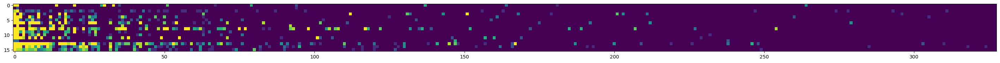

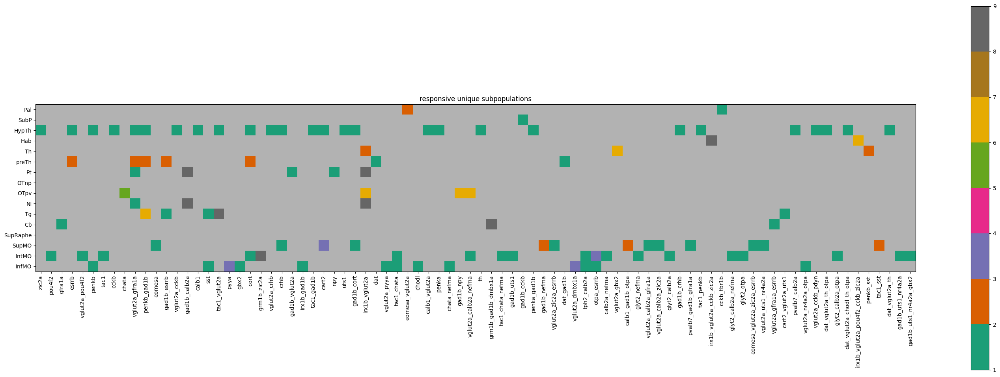

In [67]:
##### finding the unique subtypes/brain regions for each stimuli

stim_subNstim_counts = np.zeros((Avg_subty_PerBreg_All.shape))
stim_subNstim_counts[np.where(Avg_subty_PerBreg_All>0)] = 1

# np.argwhere(stim_subNstim_counts[4,:,:]).shape

print(np.sum(stim_subNstim_counts,0).shape)

plt.figure(figsize=[36,12])
plt.imshow(np.sum(stim_subNstim_counts,0)[::-1,1:],vmin=0, vmax=8)
# plt.colorbar()

print(np.argwhere(np.sum(stim_subNstim_counts,0)==1).shape)


stim_subNstim_unique = np.zeros((np.sum(stim_subNstim_counts,0).shape))
stim_subNstim_unique[:] = np.nan

for i, xy in enumerate(list(np.argwhere(np.sum(stim_subNstim_counts,0)==1))):
    stim_subNstim_unique[xy[0],xy[1]] = np.argwhere(stim_subNstim_counts[:,xy[0],xy[1]])[0][0]+1


#### for  compact version of the above
temp = np.where(np.nansum(stim_subNstim_unique,0))[0]
temp = temp.astype(int)

cmap = plt.cm.Dark2
cmap.set_bad('0.7')  # Set NaN color 
plt.figure(figsize=[36,12])
plt.imshow(stim_subNstim_unique[::-1,temp],vmin=1, vmax=9,cmap=cmap)
plt.colorbar()
plt.xticks(range(len(np.array(names)[temp])),np.array(names)[temp], rotation = 90) 
plt.yticks(range(len(BrainRegions_names_short)),BrainRegions_names_short[::-1]) 
plt.title("responsive unique subpopulations")

In [69]:
#### number of responding subtypes by brain region
stim_subNstim_counts = np.zeros((Avg_subty_PerBreg_All.shape))
stim_subNstim_counts[np.where(Avg_subty_PerBreg_All>0)] = 1
stim_subNstim_counts = np.max(stim_subNstim_counts, axis = 1)
print(stim_subNstim_counts.shape)
stim_subNstim_counts = np.sum(stim_subNstim_counts, axis = 1)

print(stim_subNstim_counts)

(8, 329)
[161. 138. 100. 104.  91. 110.  86. 113.]


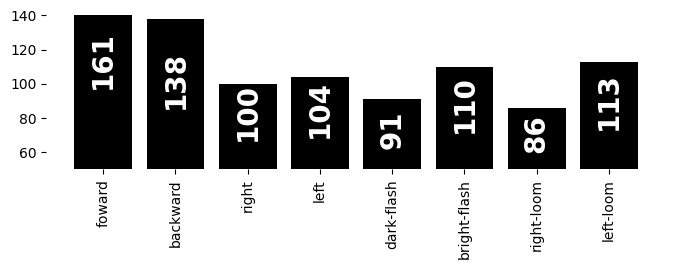

In [71]:
fig, ax = plt.subplots(figsize=(8,2))
plt.bar(stim, stim_subNstim_counts, color='k')

for i, v in enumerate(stim_subNstim_counts):
    plt.text(i, v/2+20, str(int(v)), ha='center', color='w', fontsize=20, fontweight='bold', rotation = 90)  # Adjust the y position as needed


plt.xticks(rotation = 90)
plt.ylim([50,140])
# plt.title('# of subtypes responsive to stimuli')
ax.spines[:].set_visible(False)

# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/StimVSsuptyps_count_300dpi.svg',transparent=True, dpi=300)


(8,)
[0.47429222 0.35463518 0.29782226 0.30001585 0.28029422 0.33520808
 0.25232213 0.3217956 ]


Text(0.5, 1.0, 'average of %s')

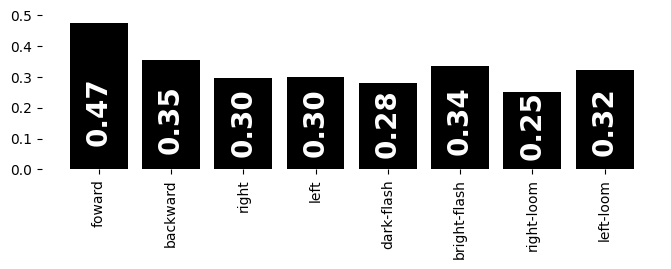

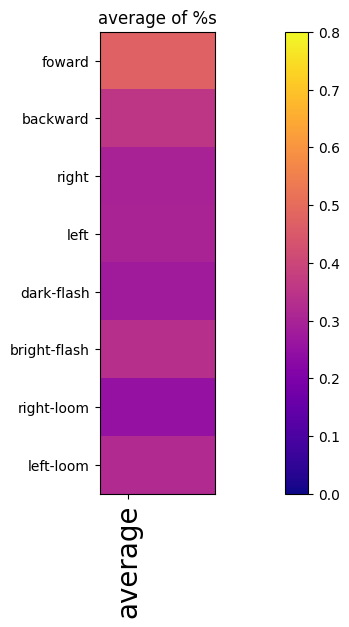

In [72]:
##### for % of cells responding per subtype
stim_subNstim_avg = np.nanmean(Avg_subty_PerBreg_All, axis = 1)
stim_subNstim_avg = np.nanmean(stim_subNstim_avg, axis = 1)
print(stim_subNstim_avg.shape)


print(stim_subNstim_avg)

fig, ax = plt.subplots(figsize=(8,2))
plt.bar(stim, stim_subNstim_avg, color='k')
# Add text annotations
for i, v in enumerate(stim_subNstim_avg):
    plt.text(i, v/5, f'{v:.2f}', ha='center', color='w', fontsize=20, fontweight='bold', rotation = 90)  # Adjust the y position as needed

plt.xticks(rotation = 90)
plt.ylim([0,0.5])
# plt.title('# of subtypes responsive to stimuli')
ax.spines[:].set_visible(False)




plt.figure(figsize=[36//2,12//2])
cmap = plt.cm.plasma
cmap.set_bad('0.7')  # Set NaN color 
plt.imshow(np.vstack((stim_subNstim_avg,stim_subNstim_avg)).T, vmin=0, vmax=0.8, cmap=cmap,interpolation='nearest')
plt.colorbar()
plt.xticks(range(1),['average'], rotation = 90, fontsize=20) 
plt.yticks(range(len(stim)),stim) 
plt.title("average of %s")

In [75]:
#### number of responding subtypes by brain region
region_subNstim_counts = np.zeros((Avg_subty_PerBreg_All.shape))
region_subNstim_counts[np.where(Avg_subty_PerBreg_All>0)] = 1
region_subNstim_counts = np.max(region_subNstim_counts, axis = 0)
region_subNstim_counts = np.sum(region_subNstim_counts, axis = 1)

print(region_subNstim_counts)

[47. 57. 87.  4. 28. 19. 21. 67.  8. 37. 28. 26. 20. 41.  2. 16.]


In [76]:
colors_B = plt.cm.nipy_spectral(np.linspace(0,1,len(BrainRegions_names_short)+2))
colors_B.shape

(18, 4)

Text(0.5, 1.0, '# of subtypes responsive to stimuli')

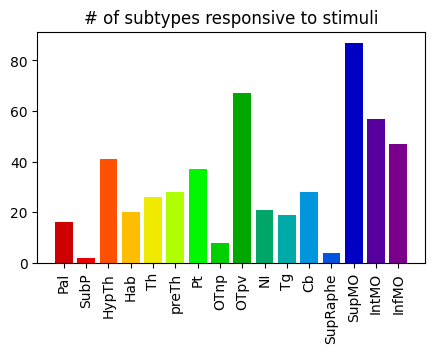

In [77]:
fig, ax = plt.subplots(figsize=(5,3))
plt.bar(BrainRegions_names_short[::-1], region_subNstim_counts[::-1], color = colors_B[::-1][1:17])
plt.xticks(rotation = 90)
plt.title('# of subtypes responsive to stimuli')

In [78]:
##########################

In [79]:
##### cfos counts in relation to the responses to stimuli

(0.0, 10000.0)

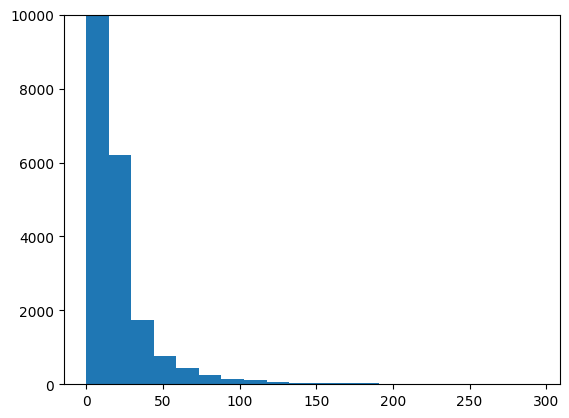

In [80]:
##### distribution of spots counts

plt.hist(genes_df_All[:,gene_names.index('cfos')],bins=20)
plt.ylim([0,10000])

2255
798
552
905
0.21153063686650617
0.04152484126981496
0.0885629142081715


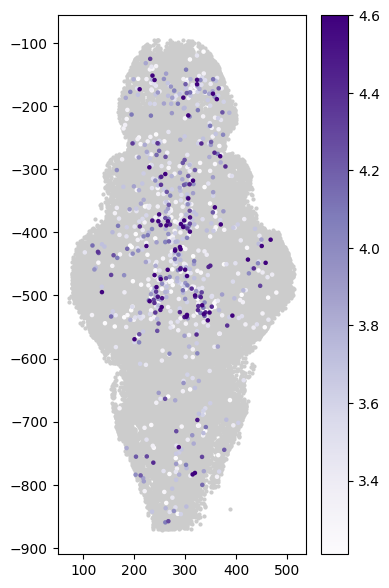

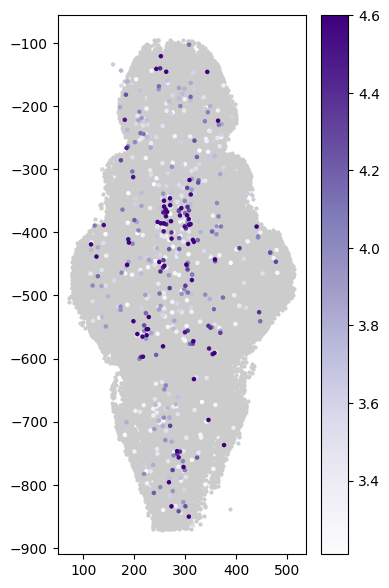

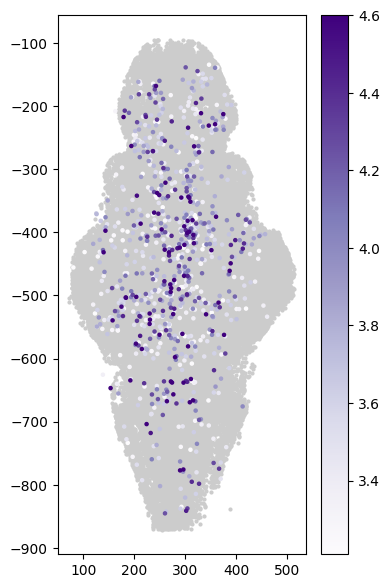

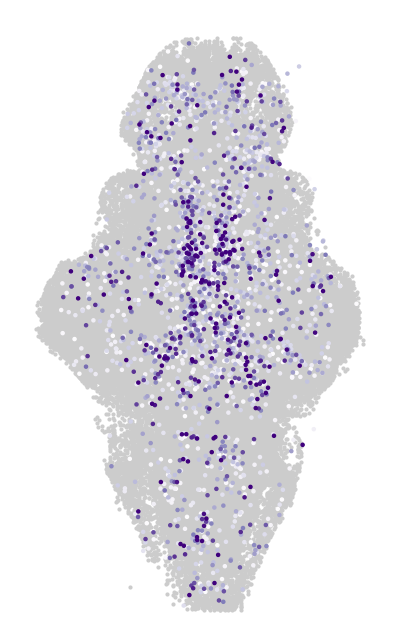

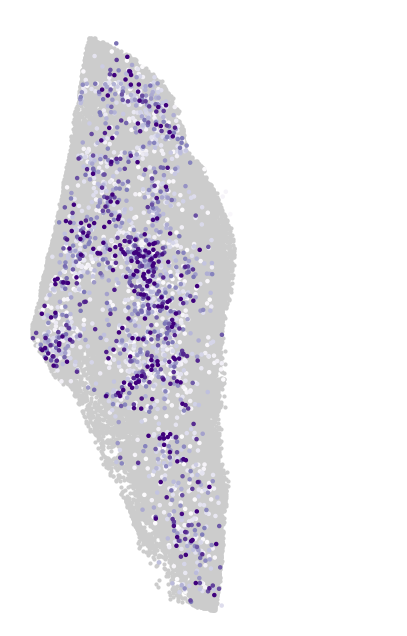

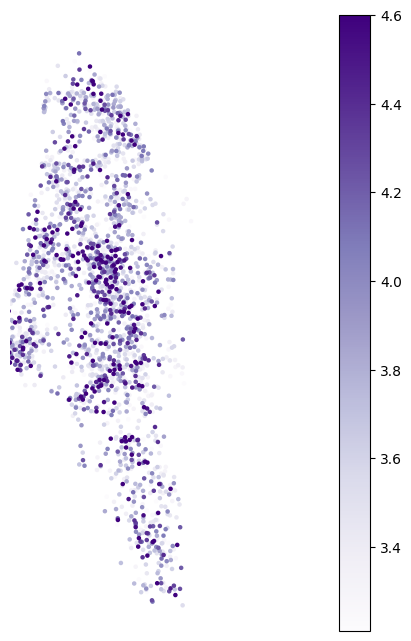

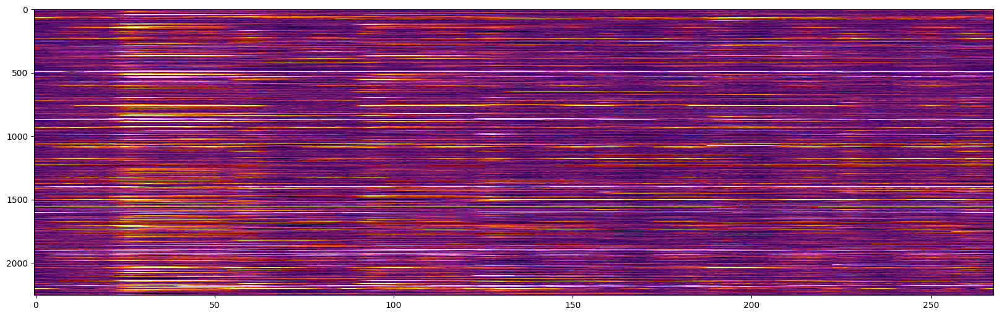

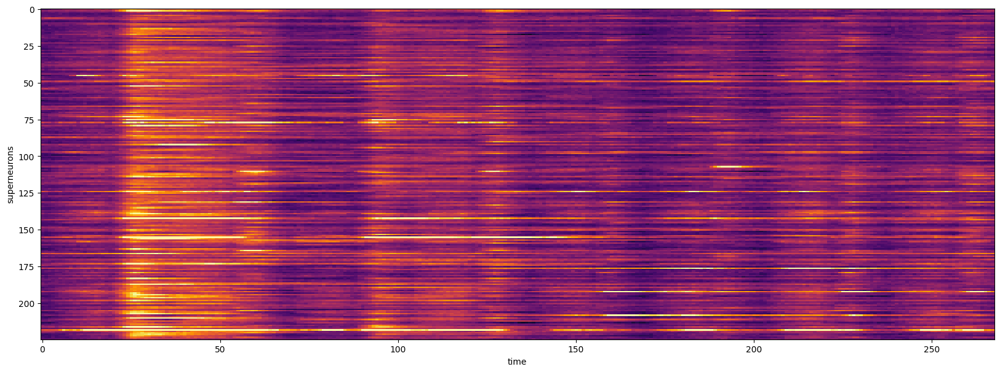

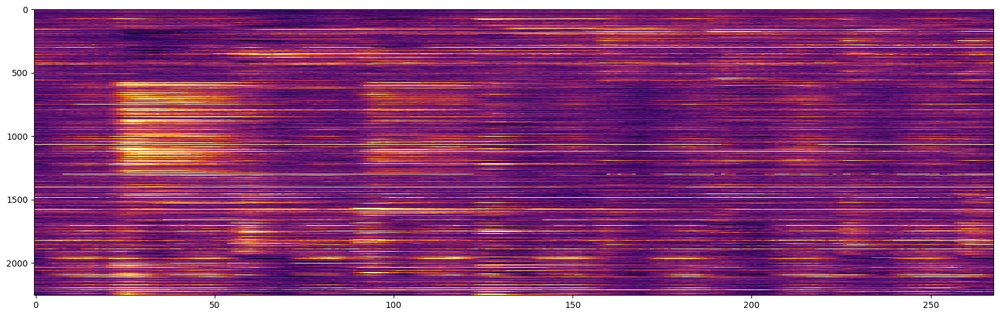

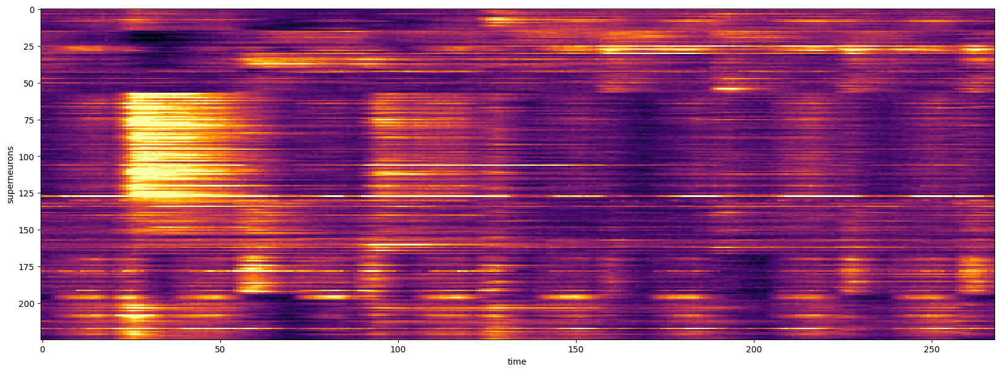

In [81]:
##### distribution in the brain with the subtypes


no_nans = np.where(~np.isnan(dff_traceAll[:,0]))[0]
in_planeAll_idx = np.where(in_planeAll)[0]

good_cells = np.intersect1d(no_nans, in_planeAll_idx)

#### if i just want to use one fish
f = 59
temp_f = np.where(fish_id==f)[0]

#### getting rid of 0s.
no_zeros = np.where(dff_traceAll[:,0])[0]  ## 
good_cells = np.intersect1d(good_cells, no_zeros)


##### filtering for neurons that don't have a subtype
good_cells = np.intersect1d(good_cells, np.where(cluster_labelsAll3)[0])


#### that have at least some cfos

temp_cfos = np.where(genes_df_All[:,gene_names.index('cfos')]>=25)[0]
temp_cfos = np.intersect1d(good_cells, temp_cfos)


print(len(temp_cfos))



idx = np.argsort(genes_df_All[temp_cfos.astype(int),gene_names.index('cfos')])


for i, fish in enumerate(np.unique(fish_id[temp_cfos[idx]])):

    temp = np.where(fish_id[temp_cfos[idx]] == fish)[0]

    
    plt.figure(figsize=(4,7))
    plt.scatter(Coords_All[temp_f,1],Coords_All[temp_f,2]*-1,s=4,c='0.8',alpha=1,label='all_cells')    
    
    plt.scatter(Coords_All[temp_cfos[idx][temp].astype(int),1],Coords_All[temp_cfos[idx][temp].astype(int),2]*-1,c=np.log(genes_df_All[temp_cfos[idx][temp].astype(int),gene_names.index('cfos')]),cmap='Purples',
           vmin = 3.21, vmax = 4.60,s=5, label='cfos')
    plt.colorbar()
    print(len(temp))


plt.figure(figsize=(5,8))
plt.scatter(Coords_All[temp_f,1],Coords_All[temp_f,2]*-1,s=4,c='0.8',alpha=1,label='all_cells')

plt.scatter(Coords_All[temp_cfos[idx].astype(int),1],Coords_All[temp_cfos[idx].astype(int),2]*-1,c=np.log(genes_df_All[temp_cfos[idx].astype(int),gene_names.index('cfos')]),cmap='Purples',
           vmin = 3.21, vmax = 4.60,s=5, label='cfos')
# plt.legend(bbox_to_anchor=(1, 1))
# plt.colorbar()

plt.axis('equal')
plt.xlim(25, 550)  # Set x-axis limits
plt.ylim(-900, -50)  # Set y-axis limits
plt.axis('off')
plt.gca().invert_xaxis()  # Invert the x-axis

# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/Cfos_Bmap_top_count_300dpi.png',transparent=True, dpi=300)


plt.figure(figsize=(5,8))
plt.scatter(Coords_All[temp_f,0],Coords_All[temp_f,2]*-1,s=4,c='0.8',alpha=1,label='all_cells')

plt.scatter(Coords_All[temp_cfos[idx].astype(int),0],Coords_All[temp_cfos[idx].astype(int),2]*-1,c=np.log(genes_df_All[temp_cfos[idx].astype(int),gene_names.index('cfos')]),cmap='Purples',
           vmin = 3.21, vmax = 4.60,s=5, label='cfos')

plt.axis('equal')
plt.xlim(25, 550)  # Set x-axis limits
plt.ylim(-900, -50)  # Set y-axis limits
plt.axis('off')

# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/Cfos_Bmap_side_count_300dpi.png',transparent=True, dpi=300)


plt.figure(figsize=(5,8))
plt.scatter(Coords_All[temp_cfos[idx].astype(int),0],Coords_All[temp_cfos[idx].astype(int),2]*-1,c=np.log(genes_df_All[temp_cfos[idx].astype(int),gene_names.index('cfos')]),cmap='Purples',
           vmin = 3.21, vmax = 4.60,s=5, label='cfos')

plt.axis('equal')
plt.xlim(25, 550)  # Set x-axis limits
plt.ylim(-900, -50)  # Set y-axis limits
plt.axis('off')

plt.colorbar()
# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/Cfos_Bmap_side_count_colorbar_300dpi.svg',transparent=True, dpi=300)




fig, (ax1) = plt.subplots(1, 1, figsize=(20, 6))
ax1.imshow(dff_traceAllavg[temp_cfos[idx].astype(int),:],vmax=0.6, vmin=-0.1,aspect='auto',cmap='inferno', interpolation = 'nearest')



#### showing all time series and binning neurons
nbin = 10 # number of neurons to bin over 
ndiv = (len(temp_cfos)//nbin) * nbin
# group sorted matrix into rows of length nbin
sn = dff_traceAllavg[temp_cfos[idx].astype(int),:][:ndiv].reshape(ndiv//nbin, nbin, -1)
# take mean over neurons in a bin
sn = sn.mean(axis=1)

# timepoints to visualize
xmin = 0 
xmax = xmin + 3000

plt.figure(figsize=(20,7))
# plot superneuron activity
plt.imshow(sn[:, xmin:xmax], cmap="inferno", vmin=0, vmax=0.4, aspect="auto",interpolation='nearest')
plt.xlabel("time")
plt.ylabel("superneurons")


temp_corrmat = np.corrcoef(dff_traceAllavg[temp_cfos[idx].astype(int),:])
_ , corr_idx = cluster_corr(temp_corrmat)

fig, (ax1) = plt.subplots(1, 1, figsize=(20, 6))
ax1.imshow(dff_traceAllavg[temp_cfos[idx][corr_idx].astype(int),:],vmax=0.6, vmin=-0.1,aspect='auto',cmap='inferno', interpolation = 'nearest')


#### showing all time series and binning neurons
nbin = 10 # number of neurons to bin over 
ndiv = (len(temp_cfos)//nbin) * nbin
# group sorted matrix into rows of length nbin
sn = dff_traceAllavg[temp_cfos[idx][corr_idx].astype(int),:][:ndiv].reshape(ndiv//nbin, nbin, -1)
# take mean over neurons in a bin
sn = sn.mean(axis=1)

# timepoints to visualize
xmin = 0 
xmax = xmin + 3000

plt.figure(figsize=(20,7))
# plot superneuron activity
plt.imshow(sn[:, xmin:xmax], cmap="inferno", vmin=0, vmax=0.4, aspect="auto",interpolation='nearest')
plt.xlabel("time")
plt.ylabel("superneurons")



# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/Cfos_raster_count_300dpi.svg',transparent=True, dpi=300)


print(np.nanmean(np.nanmax(dff_traceAllavg[temp_cfos.astype(int),0:20],1)))
print(np.nanmean(np.nanstd(dff_traceAllavg[temp_cfos.astype(int),0:20],1)))
print(np.nanmean(np.nanstd(dff_traceAllavg[temp_cfos.astype(int),:],1)))



In [82]:
dff_traceAllavg[temp_cfos[idx][corr_idx].astype(int),:].shape

(2255, 268)

2258 206054
temp_cfos_N
0.3148021625295346
0.05852980089256875
temp_cfos_H
0.3395575595463086
0.06454833906527738
p for max: 4.592929546797108e-152
p for std: 1.1192368512476729e-168
p for each stim corr: 5.941393785281057e-65
p for swim corr: 2.7117822917865943e-39
p for each foward stim corr: 5.486586786829026e-52
p for each backward stim corr: 4.466004207060134e-07
p for each right stim corr: 7.02049587367193e-14
p for each left stim corr: 1.0087923735800024e-13
p for each dark-flash stim corr: 0.48860655326114
p for each bright-flash stim corr: 0.8766482028467634
p for each right-loom stim corr: 0.000423696775170484
p for each left-loom stim corr: 3.033976522493223e-07


(0.1, 0.35)

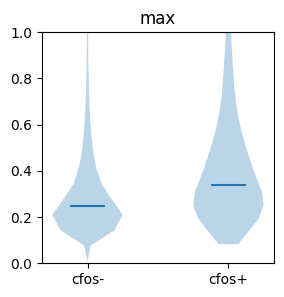

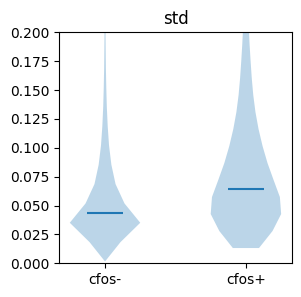

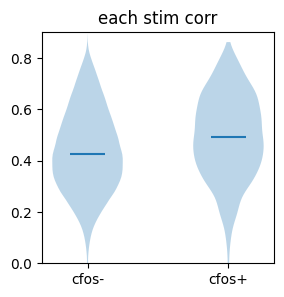

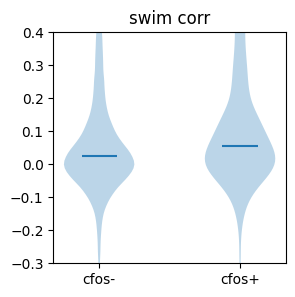

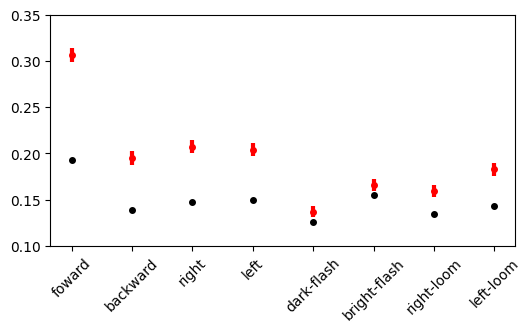

In [83]:
#### doing some stat tests and plots between the <5 cfos and the >25 cfos




no_nans = np.where(~np.isnan(dff_traceAll[:,0]))[0]
in_planeAll_idx = np.where(in_planeAll)[0]

good_cells = np.intersect1d(no_nans, in_planeAll_idx)

#### if i just want to use one fish
f = 59
temp_f = np.where(fish_id==f)[0]


#### getting rid of 0s.
no_zeros = np.where(dff_traceAllavg[:,0])[0]  ## if filtering with reliable cells too
good_cells = np.intersect1d(good_cells, no_zeros)


##### filgering for neurons that don't have a subtype
good_cells = np.intersect1d(good_cells, np.where(cluster_labelsAll3)[0])


#### that have cfos
temp_cfos_H = np.where(genes_df_All[:,gene_names.index('cfos')]>=25)[0]
temp_cfos_H = np.intersect1d(good_cells, temp_cfos_H)

#### that have NO cfos
temp_cfos_N = np.where(genes_df_All[:,gene_names.index('cfos')]<5)[0]
temp_cfos_N = np.intersect1d(good_cells, temp_cfos_N)


print(len(temp_cfos_H), len(temp_cfos_N))


print('temp_cfos_N')
# print(np.nanmean(np.nanmax(dff_traceAllavg[temp_cfos_N.astype(int),0:20],1)))
print(np.nanmean(np.nanmax(dff_traceAllavg[temp_cfos_N.astype(int),:],1)))
# print(np.nanmean(np.nanstd(dff_traceAllavg[temp_cfos_N.astype(int),0:20],1)))
print(np.nanmean(np.nanstd(dff_traceAllavg[temp_cfos_N.astype(int),:],1)))

print('temp_cfos_H')
# print(np.nanmean(np.nanmax(dff_traceAllavg[temp_cfos_H.astype(int),0:20],1)))
print(np.nanmedian(np.nanmax(dff_traceAllavg[temp_cfos_H.astype(int),:],1)))
# print(np.nanmean(np.nanstd(dff_traceAllavg[temp_cfos_H.astype(int),0:20],1)))
print(np.nanmedian(np.nanstd(dff_traceAllavg[temp_cfos_H.astype(int),:],1)))


from scipy.stats import mannwhitneyu
from scipy import stats

##### max
U, p = mannwhitneyu(np.nanmax(dff_traceAllavg[temp_cfos_N.astype(int),:],1), np.nanmax(dff_traceAllavg[temp_cfos_H.astype(int),:],1))
print('p for max:',p)

plt.figure(figsize = (3,3))
plt.violinplot([np.nanmax(dff_traceAllavg[temp_cfos_N.astype(int),:],1), np.nanmax(dff_traceAllavg[temp_cfos_H.astype(int),:],1)], 
               showmeans=False, showextrema=False, showmedians=True)
plt.xticks(ticks=np.arange(1, 3), labels=['cfos-', 'cfos+'])
plt.ylim([0,1])
plt.title('max')
# plt.boxplot([np.nanmax(dff_traceAllavg[temp_cfos_N.astype(int),:],1), np.nanmax(dff_traceAllavg[temp_cfos_H.astype(int),:],1)])


# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/Cfos_MaxTest_300dpi.svg',transparent=True, dpi=300)



##### std
U, p = mannwhitneyu(np.nanstd(dff_traceAllavg[temp_cfos_N.astype(int),:],1), np.nanstd(dff_traceAllavg[temp_cfos_H.astype(int),:],1))
print('p for std:',p)

plt.figure(figsize = (3,3))
plt.violinplot([np.nanstd(dff_traceAllavg[temp_cfos_N.astype(int),:],1), np.nanstd(dff_traceAllavg[temp_cfos_H.astype(int),:],1)], 
               showmeans=False, showextrema=False, showmedians=True)
plt.xticks(ticks=np.arange(1, 3), labels=['cfos-', 'cfos+'])
plt.ylim([0,0.2])
plt.title('std')

# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/Cfos_STDTest_300dpi.svg',transparent=True, dpi=300)


##### correlation to each stim
U, p = mannwhitneyu(np.max(high_corr_perSimMix,1)[temp_cfos_N.astype(int)], np.max(high_corr_perSimMix,1)[temp_cfos_H.astype(int)])
print('p for each stim corr:',p)

plt.figure(figsize = (3,3))
plt.violinplot([np.max(high_corr_perSimMix,1)[temp_cfos_N.astype(int)], np.max(high_corr_perSimMix,1)[temp_cfos_H.astype(int)]], 
               showmeans=False, showextrema=False, showmedians=True)
plt.xticks(ticks=np.arange(1, 3), labels=['cfos-', 'cfos+'])
plt.ylim([-0,0.9])
plt.title('each stim corr')


# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/Cfos_CorrStimTest_300dpi.svg',transparent=True, dpi=300)

##### correlation to swims
U, p = mannwhitneyu(swim_corr_All[temp_cfos_N.astype(int)], swim_corr_All[temp_cfos_H.astype(int)])
print('p for swim corr:',p)

plt.figure(figsize = (3,3))
plt.violinplot([swim_corr_All[temp_cfos_N.astype(int)], swim_corr_All[temp_cfos_H.astype(int)]], 
               showmeans=False, showextrema=False, showmedians=True)
plt.xticks(ticks=np.arange(1, 3), labels=['cfos-', 'cfos+'])
plt.ylim([-0.3,0.4])
plt.title('swim corr')



# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/Cfos_SwimTest_300dpi.svg',transparent=True, dpi=300)


plt.figure(figsize = (6,3))
for s in range(8):
    xpoints = np.array([s+1])
    
    ypoints = np.array(np.nanmedian(high_corr_perSimMix[temp_cfos_N.astype(int),s]))
    plt.plot(xpoints, ypoints , 'o', c='k',markersize=4)
    # plt.errorbar(xpoints, ypoints, yerr=np.std(high_corr_perSimMix[temp_cfos_N.astype(int),s]), c = 'k', alpha = 0.3)
    plt.errorbar(xpoints, ypoints, yerr=stats.sem(high_corr_perSimMix[temp_cfos_N.astype(int),s]), c = 'k', alpha = 1,linewidth=3)
    
    ypoints = np.array(np.nanmedian(high_corr_perSimMix[temp_cfos_H.astype(int),s]))
    plt.plot(xpoints, ypoints , 'o', c='r',markersize=4)
    # plt.errorbar(xpoints, ypoints, yerr=np.std(high_corr_perSimMix[temp_cfos_H.astype(int),s]), c = 'r', alpha = 0.3)
    plt.errorbar(xpoints, ypoints, yerr=stats.sem(high_corr_perSimMix[temp_cfos_H.astype(int),s]), c = 'r', alpha = 1,linewidth=3)


    U, p = mannwhitneyu(high_corr_perSimMix[temp_cfos_N.astype(int),s], high_corr_perSimMix[temp_cfos_H.astype(int),s])
    print('p for each '+ stim[s] +' stim corr:',p)

plt.xticks(ticks=np.arange(1, 9), labels=stim, rotation = 45) 
plt.ylim([0.1,0.35])


# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/Cfos_EachStimTest_300dpi.svg',transparent=True, dpi=300)




2 gad1b ventral_telencephalon_(subpallium)
0.6875 0.125 0.1875
0
329
(16, 329)
(3, 16, 329)
31.0


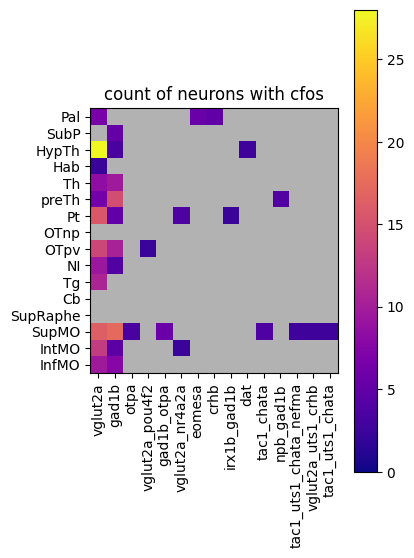

In [84]:
#### finding the subtypes that have the most cfos or that have more likelihood to express cfos


#### which brain regions has more subtypes that have cfos

Avg_CFOSsubty_PerBreg_All = np.zeros((len(GoodReg),len(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]]))-len(glia_subs)+1))  #### -2 if no vlgut and gad

Avg_CFOSsubty_PerBreg_All[:] = np.nan


Avg_CFOSsubty_PerBreg_All_pFish = np.zeros((3,len(GoodReg),len(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]]))-len(glia_subs)+1))  #### -2 if no vlgut and gad

Avg_CFOSsubty_PerBreg_All_pFish[:] = np.nan

AvgRatio_CFOSsubty_PerBreg_All = np.zeros((len(GoodReg),len(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]]))-len(glia_subs)+1))  #### -2 if no vlgut and gad

AvgRatio_CFOSsubty_PerBreg_All[:] = np.nan


Avg_CFOSsubtySpots_PerBreg = np.zeros((len(GoodReg),len(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]]))-len(glia_subs)+1))  #### -2 if no vlgut and gad

Avg_CFOSsubtySpots_PerBreg[:] = np.nan


names = ['NumSubtypes']


#### that have cfos
temp_cfos_H = np.where(genes_df_All[:,gene_names.index('cfos')]>=25)[0]
temp_cfos_H = np.intersect1d(good_cells, temp_cfos_H)

for i, cl in enumerate(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]])):
    

    if cl in glia_subs:  ### skipping glial cells
        continue


    names.append(good_cls_names[i])

for j,b in enumerate(GoodReg):

    names2= ['genes']

    temp_b = np.where(BrainRegions_All[:,b])[0]

    subtyps2test = []

    cell_count = np.zeros((len(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]]))-len(glia_subs)+1))
    cell_count[:] = np.nan

    cell_count_pFish = np.zeros((3,len(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]]))-len(glia_subs)+1))
    cell_count_pFish[:] = np.nan

    cell_ratio = np.zeros((len(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]]))-len(glia_subs)+1))
    cell_ratio[:] = np.nan
    
    cell_Cfos = np.zeros((len(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]]))-len(glia_subs)+1))
    cell_Cfos[:] = np.nan

    count2 = 1
    
    for i, cl in enumerate(np.unique(cluster_labelsAll3[np.where(cluster_labelsAll3>0)[0]])):


        if cl in glia_subs:  ### skipping glial cells
            continue

            
        temp_cl = np.where(cluster_labelsAll3==cl)[0]
   
        temp_idx = names.index(good_cls_names[i])
        
        temp = np.intersect1d(temp_cl,temp_cfos_H)
        
        temp = np.intersect1d(temp,temp_b)

        temp2 = fish_id[temp]

        temp_bcl = np.intersect1d(temp_cl,temp_b)

        temp3 = fish_id[temp_bcl] #### if getting the proportion by brain region 
        # temp3 = fish_id[temp_s] #### #### if getting the proportion by stimulus response

        # if len(np.unique(temp2))>1:
        if len(np.where(temp2==59)[0])>1 and len(np.where(temp2==63)[0])>1 and len(np.where(temp2==71)[0])>1:

            if len(np.where(temp2==59)[0])/len(temp2)>0.70 or len(np.where(temp2==63)[0])/len(temp2)>0.70 or len(np.where(temp2==71)[0])/len(temp2)>0.70:
                # print(x, good_cls_names[i], BrainRegions_names[b])
                # print(len(np.where(temp2==59)[0])/len(temp2), len(np.where(temp2==63)[0])/len(temp2), len(np.where(temp2==71)[0])/len(temp2))
                continue

            names2.append(good_cls_names[i])

            # temp_mean = len(temp)
            
            temp_mean = np.mean(np.array([len(np.where(temp2==59)[0]), len(np.where(temp2==63)[0]), len(np.where(temp2==71)[0])]))
            temp_mean2 = np.mean(np.array([len(np.where(temp3==59)[0]), len(np.where(temp3==63)[0]), len(np.where(temp3==71)[0])]))

            cell_count_pFish[0,temp_idx] = len(np.where(temp2==59)[0])
            cell_count_pFish[1,temp_idx] = len(np.where(temp2==63)[0])
            cell_count_pFish[2,temp_idx] = len(np.where(temp2==71)[0])


            # temp_Cfosmean = np.mean(genes_df_All[temp,gene_names.index('cfos')])
            temp_Cfosmean = np.mean(np.array([np.nanmean(genes_df_All[temp[np.where(temp2==59)[0]],gene_names.index('cfos')]), np.nanmean(genes_df_All[temp[np.where(temp2==63)[0]],gene_names.index('cfos')]), np.nanmean(genes_df_All[temp[np.where(temp2==71)[0]],gene_names.index('cfos')])]))

            
            if len(np.where(temp2==59)[0])/len(temp2)>0.67 or len(np.where(temp2==63)[0])/len(temp2)>0.67 or len(np.where(temp2==71)[0])/len(temp2)>0.67:
                print(cl, good_cls_names[i], BrainRegions_names[b])
                print(len(np.where(temp2==59)[0])/len(temp2), len(np.where(temp2==63)[0])/len(temp2), len(np.where(temp2==71)[0])/len(temp2))
            
            cell_count[temp_idx] = temp_mean
            cell_ratio[temp_idx] = temp_mean/temp_mean2  #### if getting the proportion 
            

            cell_Cfos[temp_idx] =  temp_Cfosmean
        

    Avg_CFOSsubty_PerBreg_All[j,:] = cell_count
    Avg_CFOSsubty_PerBreg_All_pFish[:,j,:] = cell_count_pFish
    AvgRatio_CFOSsubty_PerBreg_All[j,:] = cell_ratio
    Avg_CFOSsubtySpots_PerBreg[j,:] = cell_Cfos



#### for  compact version of the above
temp = np.where(~np.isnan(np.nanmax(Avg_CFOSsubty_PerBreg_All,0)))[0]
temp = temp.astype(int)


plt.figure(figsize=[18//4,6//1])
cmap = plt.cm.plasma
cmap.set_bad('0.7')  # Set NaN color to black
plt.imshow(Avg_CFOSsubty_PerBreg_All[::-1,temp], vmin=0, vmax=28, cmap=cmap,interpolation='nearest')
plt.colorbar()
plt.xticks(range(len(np.array(names)[temp])),np.array(names)[temp], rotation = 90) 
plt.yticks(range(len(BrainRegions_names_short)),BrainRegions_names_short[::-1]) 
plt.title("count of neurons with cfos")


print(count)

print(len(names))

print(Avg_CFOSsubty_PerBreg_All.shape)

print(Avg_CFOSsubty_PerBreg_All_pFish.shape)


print(np.nanmax(Avg_CFOSsubty_PerBreg_All))

[17.33333333 20.         54.33333333  0.          0.         10.66666667
 13.33333333 26.66666667  0.         26.66666667 25.         18.
  2.33333333 37.          5.33333333 17.33333333]


(0.0, 60.0)

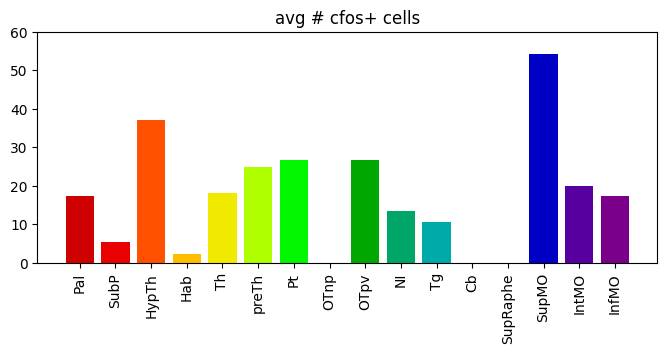

In [86]:
#### number of responding subtypes by brain region for a stimulus
from matplotlib import spines

cfos_N_counts = np.nansum(Avg_CFOSsubty_PerBreg_All, axis = 1)

print(cfos_N_counts)

fig, ax = plt.subplots(figsize=(8,3))
plt.bar(BrainRegions_names_short[::-1], cfos_N_counts[::-1], color = colors_B[::-1][1:17])
plt.xticks(rotation = 90)
plt.title('avg # cfos+ cells')
plt.ylim([0,60])
# plt.axis('off')
# ax.spines[:].set_visible(False)

[17.33333333 20.         54.33333333  0.          0.         10.66666667
 13.33333333 26.66666667  0.         26.66666667 25.         18.
  2.33333333 37.          5.33333333 17.33333333]


(0.0, 80.0)

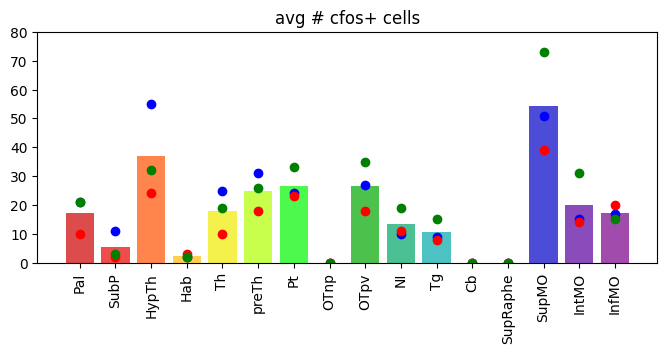

In [89]:

#### number of responding subtypes by brain region for a stimulus
from matplotlib import spines

#### like this I get the same:
# cfos_N_counts = np.nansum(np.nanmean(Avg_CFOSsubty_PerBreg_All_pFish[:,::-1,:], axis = 0), axis = 1)

#### 
cfos_N_counts = np.nanmean(np.nansum(Avg_CFOSsubty_PerBreg_All_pFish[:,:,:], axis = 2), axis = 0)


print(cfos_N_counts)

fig, ax = plt.subplots(figsize=(8,3))
plt.bar(BrainRegions_names_short[::-1], cfos_N_counts[::-1], color = colors_B[::-1][1:17], alpha = 0.7)
plt.scatter(np.arange(16), np.nansum(Avg_CFOSsubty_PerBreg_All_pFish[0,::-1,:],axis=1),c='b',alpha = 1)
plt.scatter(np.arange(16), np.nansum(Avg_CFOSsubty_PerBreg_All_pFish[1,::-1,:],axis=1),c='r',alpha = 1)
plt.scatter(np.arange(16), np.nansum(Avg_CFOSsubty_PerBreg_All_pFish[2,::-1,:],axis=1),c='g',alpha = 1)
plt.xticks(rotation = 90)
plt.title('avg # cfos+ cells')
plt.ylim([0,80])
# plt.axis('off')
# ax.spines[:].set_visible(False)


# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/Cfos_NumPerBrainReg_300dpi.svg',transparent=True, dpi=300)


0
329
(16, 329)
31.0
0
329
(16, 329)
82.38888888888889


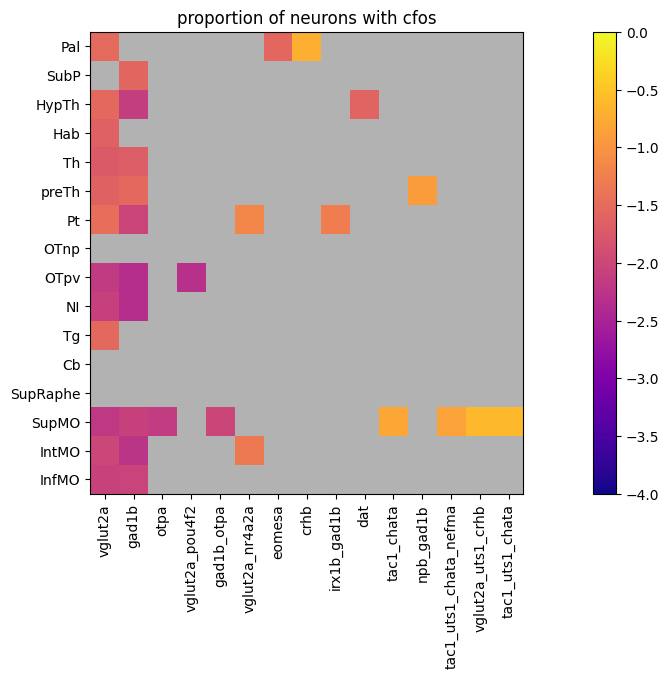

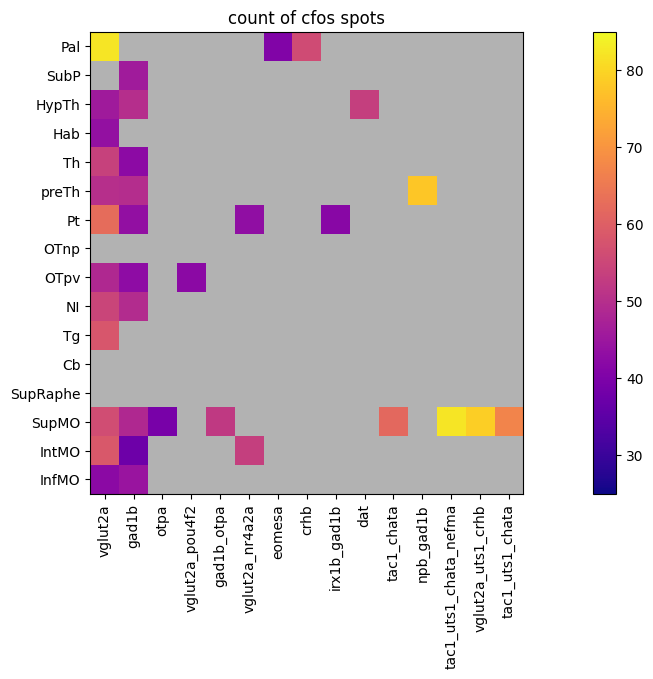

In [92]:
### plotting


#### for  compact version of the above
temp = np.where(~np.isnan(np.nanmax(AvgRatio_CFOSsubty_PerBreg_All,0)))[0]
temp = temp.astype(int)


plt.figure(figsize=[18//1,6//1])
cmap = plt.cm.plasma
cmap.set_bad('0.7')  # Set NaN color to black
plt.imshow(np.log10(AvgRatio_CFOSsubty_PerBreg_All[::-1,temp]), vmin=-4, vmax=0, cmap=cmap,interpolation='nearest')
plt.colorbar()
plt.xticks(range(len(np.array(names)[temp])),np.array(names)[temp], rotation = 90) 
plt.yticks(range(len(BrainRegions_names_short)),BrainRegions_names_short[::-1]) 
plt.title("proportion of neurons with cfos")


print(count)

print(len(names))

print(Avg_CFOSsubty_PerBreg_All.shape)


print(np.nanmax(Avg_CFOSsubty_PerBreg_All))


plt.figure(figsize=[18//1,6//1])
cmap = plt.cm.plasma
cmap.set_bad('0.7')  # Set NaN color to black
plt.imshow(Avg_CFOSsubtySpots_PerBreg[::-1,temp], vmin=25, vmax=85, cmap=cmap,interpolation='nearest')
plt.colorbar()
plt.xticks(range(len(np.array(names)[temp])),np.array(names)[temp], rotation = 90) 
plt.yticks(range(len(BrainRegions_names_short)),BrainRegions_names_short[::-1]) 
plt.title("count of cfos spots")

# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/Cfos_CntSpotsPerBrainReg_300dpi.svg',transparent=False, dpi=300)



print(count)

print(len(names))

print(Avg_CFOSsubtySpots_PerBreg.shape)


print(np.nanmax(Avg_CFOSsubtySpots_PerBreg))

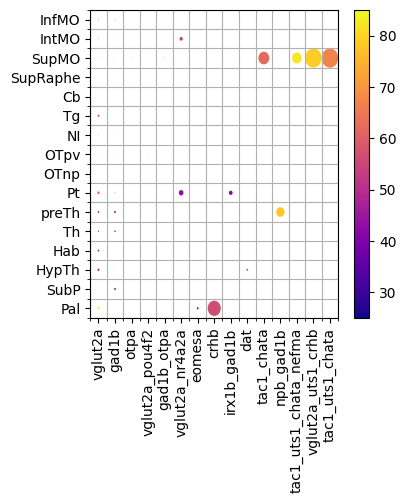

In [93]:
from matplotlib.collections import PatchCollection
from matplotlib.colors import Normalize

temp_mat1 = AvgRatio_CFOSsubty_PerBreg_All[::-1,temp]

# temp_mat1 = np.log10(temp_mat1)
# temp_mat1 = np.absolute(temp_mat1)

temp_mat1[np.isnan(temp_mat1)] = 0



N = temp_mat1.shape[0]
M = temp_mat1.shape[1]
xlabels = np.array(names)[temp]
ylabels = BrainRegions_names_short[::-1]


x, y = np.meshgrid(np.arange(M), np.arange(N))

c = Avg_CFOSsubtySpots_PerBreg[::-1,temp]


fig, ax = plt.subplots(figsize=(4//1,4))

R = temp_mat1/temp_mat1.max()/2


circles = [plt.Circle((j,i), radius=r) for r, j, i in zip(R.flat, x.flat, y.flat)]

# Create a Normalize object for the colormap
norm = Normalize(vmin=25, vmax=85)

col = PatchCollection(circles, array=c.flatten(), cmap="plasma", norm=norm)
ax.add_collection(col)

ax.set(xticks=np.arange(M), yticks=np.arange(N),
       xticklabels=xlabels, yticklabels=ylabels)

# Rotate x-tick labels by 90 degrees
plt.xticks(rotation=90)

ax.set_xticks(np.arange(M+1)-0.5, minor=True)
ax.set_yticks(np.arange(N+1)-0.5, minor=True)

ax.grid(which='minor')
fig.colorbar(col)

# plt.savefig('/nrs/ahrens/Emmanuel/multFISH/MF59_63_71_analysis/Figure_panels_SVG/Figure5/Cfos_RatioPerBrainReg_cricles_300dpi.svg',transparent=False, dpi=300)

plt.show()

In [94]:
#########################################